<a href="https://www.kaggle.com/code/yaramahrous/job-recommendation?scriptVersionId=196903061" target="_blank"><img align="left" alt="Kaggle" title="Open in Kaggle" src="https://kaggle.com/static/images/open-in-kaggle.svg"></a>

In [1]:
%config IPCompleter.greedy=True
from jedi import settings
settings.case_insensitive_completion = True

<div style="
  background-color: #e3f2fd;
  padding: 15px;
  border-left: 6px solid #0d47a1;
  border-radius: 8px;
  font-family: 'Georgia', serif;
  color: #01579b;
  font-size: 28px;
  text-align: center;
  font-weight: bold;
">
 📚 Import Libraries
</div>


In [2]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import plotly.express as px
import plotly.graph_objects as go
from plotly.subplots import make_subplots
from sklearn.manifold import TSNE
from sklearn.cluster import AgglomerativeClustering
from sklearn import metrics
from sklearn.metrics import silhouette_score, auc, accuracy_score, confusion_matrix, f1_score, precision_score, recall_score,multilabel_confusion_matrix, classification_report, roc_curve, roc_auc_score,ConfusionMatrixDisplay
from sklearn.preprocessing import MultiLabelBinarizer,StandardScaler, RobustScaler, MinMaxScaler
from sklearn.pipeline import make_pipeline, FeatureUnion, Pipeline
from sklearn.feature_selection import VarianceThreshold
from sklearn.multioutput import MultiOutputClassifier
from sklearn.model_selection import train_test_split
from sklearn.decomposition import PCA, KernelPCA
from sklearn import tree
from sklearn.linear_model import LogisticRegression
from sklearn.ensemble import AdaBoostClassifier, GradientBoostingClassifier, RandomForestClassifier,VotingClassifier,StackingClassifier
import xgboost as xgb
from sklearn.tree import DecisionTreeClassifier
from sklearn.svm import SVC
from sklearn.neighbors import KNeighborsClassifier
from sklearn.naive_bayes import GaussianNB
from sklearn.model_selection import GridSearchCV,RandomizedSearchCV,cross_val_score
import pickle



import warnings
warnings.filterwarnings('ignore')

# Setting options for display
pd.set_option("display.max_columns", None)

<div style="
  background-color: #e3f2fd;
  padding: 15px;
  border-left: 6px solid #0d47a1;
  border-radius: 8px;
  font-family: 'Georgia', serif;
  color: #01579b;
  font-size: 28px;
  text-align: center;
  font-weight: bold;
">
  📌 Constants
</div>


In [3]:
DATA_PATH = '/kaggle/input/stack-overflow-2023-developers-survey/survey_results_public.csv'

REPLACE_DICT = {
    'YearsCodePro': {'Less than 1 year': 0, 'More than 50 years': 51}, 
    'YearsCode':    {'Less than 1 year': 0, 'More than 50 years': 51}}

ROLE_COLS      = ['DevType']
TECH_COLS      = ['LanguageHaveWorkedWith',
                  'DatabaseHaveWorkedWith',
                  'PlatformHaveWorkedWith',
                  'WebframeHaveWorkedWith',
                  'MiscTechHaveWorkedWith',
                  'ToolsTechHaveWorkedWith',
                  'NEWCollabToolsHaveWorkedWith']



EXCLUDE_ROLES = [
    'Other (please specify):',
    'Student',
    'Designer',
    'Educator',
    'Marketing or sales professional',
    'Engineering manager',
    'Senior Executive (C-Suite, VP, etc.)',
    'Product manager',
    'Engineer, site reliability',
    'Engineer, data',
    'Cloud infrastructure engineer',
    'Data or business analyst',
    'Developer, game or graphics',
    'System administrator',
    'Developer, QA or test',
    'Project manager',
    'Security professional',
    'Scientist',
    'Developer Experience',
    'Blockchain',
    'Hardware Engineer',
    'Database administrator',
    'Developer Advocate'
]

<div style="
  background-color: #e3f2fd;
  padding: 15px;
  border-left: 6px solid #0d47a1;
  border-radius: 8px;
  font-family: 'Georgia', serif;
  color: #01579b;
  font-size: 28px;
  text-align: center;
  font-weight: bold;
">
  ⚙️ Functions
</div>


In [4]:
def split_answers(data_series, delimiter=";"):
    """ 
    Split multiple answers in a single string 
    to a list of single strings each represnting a single answers 

    Parameters:
    * data_series (pd.Series): String series with answers 
    * delimiter (string): Another decimal integer 
                          Defaults to ";"

    Returns: (pd.Series): If column contains 
    """
    
    # Sub functions 
    def is_splittable(pd_series, delimiter):
        """ Check if results multiple should be splitted - Returns boolean """    
        return pd_series.str.contains(delimiter)
    
    def split_answer(pd_series, delimiter): 
        """Function to split single answer"""
        return pd_series.str.split(delimiter)
    
    # --------------------
    
    # Check if multiple answers exist - if none: return original 
    splittable_values = is_splittable(data_series, delimiter)
    if not splittable_values.any():
        return data_series
    
    # Else, split each value to a list 
    modified_series = split_answer(data_series, delimiter)    
    
    # Replace NAs with empty lists 
    mask_null = modified_series.isnull()
    modified_series.loc[mask_null] = modified_series.loc[mask_null].apply(lambda x: [])
    
    return modified_series

In [5]:
def calculate_quality(ground_truth, predictions, metric_function, sort_values=False):
    """
    Calculate quality of predictions using a metric function

    - Parameters:
        * ground_truth (pd.DataFrame): DataFrame with ground truth values
        * predictions (pd.DataFrame): DataFrame with predicted values
        * metric_function (function): Function to calculate quality
        * sort_values (bool): Sort values in the output

    - Returns:
        * quality_scores (pd.Series): Quality scores for each column
    """
    quality_scores = {}
    for col in predictions.columns:
        role_pred  = predictions[col].copy()
        role_truth = ground_truth[col].copy()
        quality_scores[col] = round(metric_function(role_truth, role_pred) * 100, 2)
        
    quality_scores = pd.Series(quality_scores.values(), index=quality_scores.keys())
    if sort_values:
        quality_scores = quality_scores.sort_values()
    
    return quality_scores

In [6]:
def evaluate_model(pipeline, X_train, Y_train, X_test, Y_test):
    """
    Evaluate a model pipeline on training and test set and print the results
    
    - Parameters:
        * pipeline (Pipeline): Model pipeline
        * X_train (pd.DataFrame): Training features
        * Y_train (pd.DataFrame): Training labels
        * X_test (pd.DataFrame): Test features
        * Y_test (pd.DataFrame): Test labels

    - Returns:
        * train_scores (pd.DataFrame): Training scores
        * test_scores (pd.DataFrame): Test scores
    """
# Evaluate on training set
    predictions =  pd.DataFrame(pipeline.predict(X_train.values),
                                columns=Y_train.columns)
    train_scores = {score.__name__: calculate_quality(Y_train, predictions, score) 
                    for score in [accuracy_score, precision_score, recall_score, f1_score]}
    train_scores = pd.concat(train_scores,axis=1)
# Evaluate on test set
    predictions =  pd.DataFrame(pipeline.predict(X_test.values), columns=Y_test.columns)
    test_scores = {score.__name__: calculate_quality(Y_test, predictions, score) 
                    for score in [accuracy_score, precision_score, recall_score, f1_score]}
    test_scores = pd.concat(test_scores,axis=1)

    mean_train_scores = train_scores.mean()
    mean_test_scores = test_scores.mean()
    print("======Train Scores======")
    print(mean_train_scores)
    print()
    print(train_scores)
    print()
    print("======Test Scores======")
    print(mean_test_scores)
    print()
    print(test_scores)
    print("\n" + "-" * 50 + "\n")
    
    return train_scores, test_scores

In [7]:
def perform_randomized_search(X_train, Y_train, X_test, Y_test, scalers, models, scoring = 'accuracy', use_pca = False, save_model=False, n_iter=10):
    """
    Perform a randomized search for the best model and scaler combination

    - Parameters:
        * X_train (pd.DataFrame): Training features
        * Y_train (pd.DataFrame): Training labels
        * X_test (pd.DataFrame): Test features
        * Y_test (pd.DataFrame): Test labels
        * scalers (dict): Dictionary with scalers
        * models (dict): Dictionary with models
        * scoring (str): Scoring metric
        * save_model (bool): Save the best model
        * n_iter (int): Number of iterations for the randomized search

    - Returns:
        * results (list): List with the results of the randomized search

    """
    results = [] 
    
    for scaler_name, scaler in scalers.items():
        for model_name, (model, param_grid) in models.items():
            if use_pca:
                pipeline = Pipeline([
                    ('scaler', scaler),
                    ('pca', PCA()),
                    ('classifier', MultiOutputClassifier(model))
                ])
                param_grid['pca__n_components'] = [5, 10, 20,25]
            else:
                pipeline = Pipeline([
                    ('scaler', scaler),
                    ('classifier', MultiOutputClassifier(model))
                ])

            randomized_search = RandomizedSearchCV(pipeline, param_distributions=param_grid, n_iter=n_iter, cv=5, scoring=scoring, n_jobs=-1, random_state=42)
            print(f"Training with {scaler_name} and {model_name}")
            randomized_search.fit(X_train, Y_train)

            print(f"Best parameters for {scaler_name} with {model_name}: {randomized_search.best_params_}")
            print(f"Best score: {randomized_search.best_score_}")

            evaluate_model(randomized_search.best_estimator_, X_train, Y_train, X_test, Y_test)
            
            results.append({
                'scaler': scaler_name,
                'model': model_name,
                'best_params': randomized_search.best_params_,
                'best_score': randomized_search.best_score_,
            })

            if save_model:
                file_path = f'best_model_{model_name}_{scaler_name}_{randomized_search.best_score_}_random.pkl'
                with open(file_path, 'wb') as f:
                    pickle.dump(randomized_search.best_estimator_, f)
                print(f"Best model saved to {file_path}")
                print()

    return results

In [8]:
def perform_grid_search(X_train, Y_train, X_test, Y_test, scalers, models,scoring='accuracy',use_pca=False, save_model=False):

    """
    Perform a grid search for the best model and scaler combination

    - Parameters:
        * X_train (pd.DataFrame): Training features
        * Y_train (pd.DataFrame): Training labels
        * X_test (pd.DataFrame): Test features
        * Y_test (pd.DataFrame): Test labels
        * scalers (dict): Dictionary with scalers
        * models (dict): Dictionary with models
        * scoring (str): Scoring metric
        * save_model (bool): Save the best model

    - Returns:
        * results (list): List with the results of the grid search

    """
    results=[]

    for scaler_name, scaler in scalers.items():
        for model_name, (model, param_grid) in models.items():
            if use_pca:
                pipeline = Pipeline([
                    ('scaler', scaler),
                    ('pca', PCA()),
                    ('classifier', MultiOutputClassifier(model))
                ])
                param_grid['pca__n_components'] = [5, 10, 20,25]
            else:
                pipeline = Pipeline([
                        ('scaler', scaler),
                        ('classifier', MultiOutputClassifier(model))
                    ])

            grid_search = GridSearchCV(pipeline, param_grid, cv=5, scoring=scoring, n_jobs=-1)
            print(f"Training with {scaler_name} and {model_name}")
            grid_search.fit(X_train, Y_train)

            print(f"Best parameters for {scaler_name} with {model_name}: {grid_search.best_params_}")
            print(f"Best score: {grid_search.best_score_}")

            evaluate_model(grid_search.best_estimator_, X_train, Y_train, X_test, Y_test)
            
            results.append({
                'scaler': scaler_name,
                'model': model_name,
                'best_params': grid_search.best_params_,
                'best_score': grid_search.best_score_,
            })

            if save_model:
                file_path = f'best_model_{scaler_name}_{model_name}_{grid_search.best_score_}_grid.pkl'
                with open(file_path, 'wb') as f:
                    pickle.dump(grid_search.best_estimator_, f)
                print(f"Best model saved to {file_path}")
                print()

    return results

In [9]:
def calculate_mean_roc(roc_data):
    """
    Calculate the mean ROC curve from a dictionary of ROC data

    - Parameters:
        * roc_data (dict): Dictionary with ROC data
        
    - Returns:
        * all_fpr (np.array): All false positive rates
        * mean_tpr (np.array): Mean true positive rate
    """
    
    all_fpr = np.linspace(0, 1, 100)
    mean_tpr = np.zeros_like(all_fpr)
    for fpr, tpr in roc_data.values():
        mean_tpr += np.interp(all_fpr, fpr, tpr)
    mean_tpr /= len(roc_data)
    return all_fpr, mean_tpr


In [10]:
def plot_roc_for_each_model(results,title):

    n_models = len(results)
    n_cols = 2
    n_rows = (n_models + 1) // n_cols 

    fig, axes = plt.subplots(n_rows, n_cols, figsize=(15, 5 * n_rows))
    fig.suptitle(title, fontsize=16)
    axes = axes.flatten()

    for idx, result in enumerate(results):
        model_name = result['model']
        roc_data = result['roc_data']
        scaler_name = result['scaler']
        
        ax = axes[idx]
        for col, (fpr, tpr) in roc_data.items():
            ax.plot(fpr, tpr, label=f'{col} (AUC = {auc(fpr, tpr):.2f})')
        
        ax.plot([0, 1], [0, 1], 'k--', label='Random (AUC = 0.5)')
        
        ax.set_title(model_name+ ' with '+ scaler_name )
        ax.set_xlabel('False Positive Rate')
        ax.set_ylabel('True Positive Rate')
        ax.legend(loc='lower right')

    for i in range(len(results), len(axes)):
        fig.delaxes(axes[i])

    plt.tight_layout(rect=[0, 0, 1, 0.98])
    plt.show()

In [11]:
def plot_mean_roc_auc(results):

    mean_roc_data = {}
    for result in results:
        model_name = result['model']
        roc_data = result['roc_data']
        mean_fpr, mean_tpr = calculate_mean_roc(roc_data)
        mean_auc = auc(mean_fpr, mean_tpr)
        mean_roc_data[model_name] = (mean_fpr, mean_tpr, mean_auc)

    mean_auc_df = pd.DataFrame(
        [(model_name, mean_auc) for model_name, (_, _, mean_auc) in mean_roc_data.items()],
        columns=['Model', 'Mean AUC']
    )

    fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(18, 8))

    bars = ax1.bar(mean_auc_df['Model'], mean_auc_df['Mean AUC'], color='skyblue')
    ax1.set_xlabel('Model')
    ax1.set_ylabel('Mean AUC')
    ax1.set_title('Mean AUC Scores for Each Model')
    ax1.set_xticklabels(mean_auc_df['Model'], rotation=45, ha='right')

    for bar in bars:
        yval = bar.get_height()
        ax1.text(bar.get_x() + bar.get_width()/2, yval, f'{yval:.2f}', va='bottom', ha='center')

    for model_name, (mean_fpr, mean_tpr, mean_auc) in mean_roc_data.items():
        ax2.plot(mean_fpr, mean_tpr, label=f'{model_name} (AUC = {mean_auc:.2f})')

    ax2.plot([0, 1], [0, 1], 'k--', label='Random (AUC = 0.5)')
    ax2.set_xlabel('False Positive Rate')
    ax2.set_ylabel('True Positive Rate')
    ax2.set_title('Mean ROC Curves for Each Model')
    ax2.legend(loc='best')

    plt.tight_layout()
    plt.show()

    return mean_auc_df


In [12]:
def plot_confusion_matrix(mean_auc_df,X_train,X_test,Y_train,Y_test,n_top=2):
    

    sorted_models = mean_auc_df.sort_values('Mean AUC', ascending=False).head(n_top)
    top_models = sorted_models['Model'].tolist()

    fig, axes = plt.subplots(nrows=n_top, ncols=2, figsize=(16, 5 * n_top))
    fig.suptitle('Aggregated Confusion Matrices for Top Models (Train and Test)', fontsize=16)

    for idx, model_name in enumerate(top_models):
        model = models[model_name][0]

        pipeline = Pipeline([
            ('scaler', StandardScaler()),
            ('classifier', MultiOutputClassifier(model))
        ])

        pipeline.fit(X_train, Y_train)
        
        y_train_pred = pipeline.predict(X_train)
        y_test_pred = pipeline.predict(X_test)
        
        train_cm = confusion_matrix(Y_train.values.argmax(axis=1), y_train_pred.argmax(axis=1))
        test_cm = confusion_matrix(Y_test.values.argmax(axis=1), y_test_pred.argmax(axis=1))
        
        disp_train = ConfusionMatrixDisplay(confusion_matrix=train_cm, display_labels=Y_train.columns)
        disp_train.plot(ax=axes[idx, 0], cmap=plt.cm.Blues, values_format='d')
        axes[idx, 0].set_title(f'{model_name} - Train')
        axes[idx, 0].tick_params(axis='x', rotation=45) 
        
        disp_test = ConfusionMatrixDisplay(confusion_matrix=test_cm, display_labels=Y_test.columns)
        disp_test.plot(ax=axes[idx, 1], cmap=plt.cm.Blues, values_format='d')
        axes[idx, 1].set_title(f'{model_name} - Test')
        axes[idx, 1].tick_params(axis='x', rotation=45)

    plt.tight_layout(rect=[0, 0, 1, 0.98])
    plt.show()


<div style="
  background-color: #e3f2fd;
  padding: 15px;
  border-left: 6px solid #0d47a1;
  border-radius: 8px;
  font-family: 'Georgia', serif;
  color: #01579b;
  font-size: 28px;
  text-align: center;
  font-weight: bold;
">
  📥 Reading the Data

</div>


In [13]:
data = pd.read_csv(DATA_PATH)
print(data.shape)
data.sample(5)

(89184, 84)


,ResponseId,Q120,MainBranch,Age,Employment,RemoteWork,CodingActivities,EdLevel,LearnCode,LearnCodeOnline,LearnCodeCoursesCert,YearsCode,YearsCodePro,DevType,OrgSize,PurchaseInfluence,TechList,BuyNewTool,Country,Currency,CompTotal,LanguageHaveWorkedWith,LanguageWantToWorkWith,DatabaseHaveWorkedWith,DatabaseWantToWorkWith,PlatformHaveWorkedWith,PlatformWantToWorkWith,WebframeHaveWorkedWith,WebframeWantToWorkWith,MiscTechHaveWorkedWith,MiscTechWantToWorkWith,ToolsTechHaveWorkedWith,ToolsTechWantToWorkWith,NEWCollabToolsHaveWorkedWith,NEWCollabToolsWantToWorkWith,OpSysPersonal use,OpSysProfessional use,OfficeStackAsyncHaveWorkedWith,OfficeStackAsyncWantToWorkWith,OfficeStackSyncHaveWorkedWith,OfficeStackSyncWantToWorkWith,AISearchHaveWorkedWith,AISearchWantToWorkWith,AIDevHaveWorkedWith,AIDevWantToWorkWith,NEWSOSites,SOVisitFreq,SOAccount,SOPartFreq,SOComm,SOAI,AISelect,AISent,AIAcc,AIBen,AIToolInterested in Using,AIToolCurrently Using,AIToolNot interested in Using,AINextVery different,AINextNeither different nor similar,AINextSomewhat similar,AINextVery similar,AINextSomewhat different,TBranch,ICorPM,WorkExp,Knowledge_1,Knowledge_2,Knowledge_3,Knowledge_4,Knowledge_5,Knowledge_6,Knowledge_7,Knowledge_8,Frequency_1,Frequency_2,Frequency_3,TimeSearching,TimeAnswering,ProfessionalTech,Industry,SurveyLength,SurveyEase,ConvertedCompYearly
16483,16484,I agree,I am a developer by profession,35-44 years old,"Employed, full-time","Hybrid (some remote, some in-person)",Hobby;Professional development or self-paced l...,"Professional degree (JD, MD, Ph.D, Ed.D, etc.)",Books / Physical media;Colleague;Other online ...,Formal documentation provided by the owner of ...,NaN,16,10,Other (please specify):,20 to 99 employees,I have a great deal of influence,Investigate,Ask developers I know/work with;Visit develope...,United Kingdom of Great Britain and Northern I...,GBP\tPound sterling,87000.0,Bash/Shell (all shells);C++;Go;Java;JavaScript...,Bash/Shell (all shells);C++;Go;Python,MongoDB;PostgreSQL;SQLite,PostgreSQL,Amazon Web Services (AWS);Google Cloud;Microso...,Microsoft Azure,AngularJS;Django;Flask;Node.js;React;WordPress,NaN,CUDA;Flutter;NumPy;Opencv;Pandas;RabbitMQ;Scik...,CUDA;NumPy;Opencv;RabbitMQ;Torch/PyTorch,Ansible;APT;bandit;CMake;Docker;GNU GCC;Google...,Ansible;APT;bandit;CMake;Docker;GNU GCC;Google...,Emacs;Nano;Vim;Visual Studio Code,Nano;Visual Studio Code,MacOS,MacOS,Confluence;Doxygen;Jira;Markdown File,Confluence;Doxygen;Jira;Markdown File,Google Meet;Microsoft Teams;Slack;Zoom,Slack;Zoom,NaN,NaN,NaN,NaN,Stack Overflow,Multiple times per day,Yes,I have never participated in Q&A on Stack Over...,"No, not really","A GDPR compliant version would be nice, also t...","No, and I don't plan to",NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,Yes,People manager,10.0,Strongly agree,Neither agree nor disagree,Agree,Agree,Strongly agree,Disagree,Disagree,Agree,1-2 times a week,3-5 times a week,1-2 times a week,15-30 minutes a day,30-60 minutes a day,DevOps function;Microservices;Automated testin...,"Information Services, IT, Software Development...",Appropriate in length,Easy,108000.0
57327,57328,I agree,I am a developer by profession,25-34 years old,"Employed, full-time",Remote,Hobby;Bootstrapping a business;Professional de...,"Master’s degree (M.A., M.S., M.Eng., MBA, etc.)",Books / Physical media;On the job training;Oth...,Formal documentation provided by the owner of ...,NaN,18,7,"Developer, full-stack",100 to 499 employees,I have some influence,Investigate,Start a free trial;Ask developers I know/work ...,Germany,EUR European Euro,NaN,Bash/Shell (all shells);Java;Rust;TypeScript,Rust,NaN,NaN,Microsoft Azure,Amazon Web Services (AWS);Google Cloud,React;Spring Boot,NaN,NaN,NaN,Cargo;Gradle;Maven (build tool),Cargo,Eclipse;IntelliJ IDEA;Vim,IntelliJ IDEA;Vim;Visual Studio Code,Arch,Windows,Confluence;Jira,NaN,Microsoft Teams,NaN,NaN,NaN,NaN,NaN,Stack Overflow;Stack Exchange,Daily or almost daily,Not sure/can't remember,NaN,"No, not really

<div style="
  background-color: #e3f2fd;
  padding: 15px;
  border-left: 6px solid #0d47a1;
  border-radius: 8px;
  font-family: 'Georgia', serif;
  color: #01579b;
  font-size: 28px;
  text-align: center;
  font-weight: bold;
">
  🔍 Exploring The Data

</div>


In [14]:
data.isna().any(axis=1).sum()

89184

In [6]:
nulls_cnt = (data.isnull().sum()/len(data))*100
nulls = pd.DataFrame(nulls_cnt, columns=['Null percentage'])
nulls = nulls[nulls['Null percentage']>0]
nulls = nulls.sort_values(by='Null percentage', ascending=False)
display(nulls)

,Null percentage
AINextVery similar,97.061132
AINextSomewhat similar,93.005472
AINextNeither different nor similar,92.600691
AINextVery different,85.803507
AIDevWantToWorkWith,78.037540
...,...
Employment,1.441963
NEWSOSites,1.357867
Country,1.357867
EdLevel,1.357867


In [7]:
display(nulls[nulls['Null percentage']>50])

,Null percentage
AINextVery similar,97.061132
AINextSomewhat similar,93.005472
AINextNeither different nor similar,92.600691
AINextVery different,85.803507
AIDevWantToWorkWith,78.037540
AIToolNot interested in Using,76.375807
AINextSomewhat different,73.870874
AIDevHaveWorkedWith,70.954431
AIToolInterested in Using,63.241164
AIToolCurrently Using,59.480400


### We can eliminate several of the previous columns as they are not relevant for our model or analysis.



In [11]:
data.duplicated().sum()

0

In [9]:
data.info()

<class 'pandas.core.frame.DataFrame'>

RangeIndex: 89184 entries, 0 to 89183

Data columns (total 84 columns):

 #   Column                               Non-Null Count  Dtype  

---  ------                               --------------  -----  

 0   ResponseId                           89184 non-null  int64  

 1   Q120                                 89184 non-null  object 

 2   MainBranch                           89184 non-null  object 

 3   Age                                  89184 non-null  object 

 4   Employment                           87898 non-null  object 

 5   RemoteWork                           73810 non-null  object 

 6   CodingActivities                     73764 non-null  object 

 7   EdLevel                              87973 non-null  object 

 8   LearnCode                            87663 non-null  object 

 9   LearnCodeOnline                      70084 non-null  object 

 10  LearnCodeCoursesCert                 37076 non-null  object 

 11  YearsCode   

In [10]:
data.describe()

,ResponseId,CompTotal,WorkExp,ConvertedCompYearly
count,89184.000000,4.822500e+04,43579.000000,4.801900e+04
mean,44592.500000,1.036807e+42,11.405126,1.031101e+05
std,25745.347541,2.276847e+44,9.051989,6.814188e+05
min,1.000000,0.000000e+00,0.000000,1.000000e+00
25%,22296.750000,6.300000e+04,5.000000,4.390700e+04
50%,44592.500000,1.150000e+05,9.000000,7.496300e+04
75%,66888.250000,2.300000e+05,16.000000,1.216410e+05
max,89184.000000,5.000000e+46,50.000000,7.435143e+07


In [11]:
data.describe(include='O')

,Q120,MainBranch,Age,Employment,RemoteWork,CodingActivities,EdLevel,LearnCode,LearnCodeOnline,LearnCodeCoursesCert,YearsCode,YearsCodePro,DevType,OrgSize,PurchaseInfluence,TechList,BuyNewTool,Country,Currency,LanguageHaveWorkedWith,LanguageWantToWorkWith,DatabaseHaveWorkedWith,DatabaseWantToWorkWith,PlatformHaveWorkedWith,PlatformWantToWorkWith,WebframeHaveWorkedWith,WebframeWantToWorkWith,MiscTechHaveWorkedWith,MiscTechWantToWorkWith,ToolsTechHaveWorkedWith,ToolsTechWantToWorkWith,NEWCollabToolsHaveWorkedWith,NEWCollabToolsWantToWorkWith,OpSysPersonal use,OpSysProfessional use,OfficeStackAsyncHaveWorkedWith,OfficeStackAsyncWantToWorkWith,OfficeStackSyncHaveWorkedWith,OfficeStackSyncWantToWorkWith,AISearchHaveWorkedWith,AISearchWantToWorkWith,AIDevHaveWorkedWith,AIDevWantToWorkWith,NEWSOSites,SOVisitFreq,SOAccount,SOPartFreq,SOComm,SOAI,AISelect,AISent,AIAcc,AIBen,AIToolInterested in Using,AIToolCurrently Using,AIToolNot interested in Using,AINextVery different,AINextNeither different nor similar,AINextSomewhat similar,AINextVery similar,AINextSomewhat different,TBranch,ICorPM,Knowledge_1,Knowledge_2,Knowledge_3,Knowledge_4,Knowledge_5,Knowledge_6,Knowledge_7,Knowledge_8,Frequency_1,Frequency_2,Frequency_3,TimeSearching,TimeAnswering,ProfessionalTech,Industry,SurveyLength,SurveyEase
count,89184,89184,89184,87898,73810,73764,87973,87663,70084,37076,87435,66136,76872,65043,64964,60851,83009,87973,65334,87140,80709,73435,60911,63628,51308,66938,56741,57019,46848,77884,68315,85864,76649,86557,78587,69090,53743,83439,69776,56328,46150,25904,19587,87973,87140,87852,66061,87692,47858,87973,61501,38594,61396,32783,36137,21069,12661,6599,6238,2621,23303,65768,43668,42535,41670,41798,41684,41527,41520,41467,41404,41916,41925,41054,42778,42629,41783,36774,86485,86554
unique,1,6,8,106,3,116,8,790,7940,210,52,52,33,10,3,3,231,185,144,32641,29602,11096,10485,5920,4963,15144,14620,10322,11775,33133,27456,21262,13659,3050,2470,6258,3754,6925,4078,323,399,166,233,16,5,3,6,6,43061,3,6,60,5,640,533,535,349,222,197,159,326,2,2,5,5,5,5,5,5,5,5,5,5,5,5,5,284,12,3,3
top,I agree,I am a developer by profession,25-34 years old,"Employed, full-time","Hybrid (some remote, some in-person)",Hobby,"Bachelor’s degree (B.A., B.S., B.Eng., etc.)","Other online resources (e.g., videos, blogs, f...",Formal documentation provided by the owner of ...,Udemy,10,5,"Developer, full-stack",20 to 99 employees,I have some influence,Investigate,Start a free trial;Ask developers I know/work ...,United States of America,EUR European Euro,HTML/CSS;JavaScript;TypeScript,Rust,PostgreSQL,PostgreSQL,Amazon Web Services (AWS),Amazon Web Services (AWS),React,React,.NET (5+) ;.NET Framework (1.0 - 4.8),.NET (5+),Visual Studio Solution,Docker,Visual Studio Code,Visual Studio Code,Windows,Windows,Jira,Jira,Microsoft Teams,Microsoft Teams,ChatGPT,ChatGPT,GitHub Copilot,GitHub Copilot,Stack Overflow;Stack Exchange,A few times per week,Yes,Less than once per month or monthly,"No, not really",No opinion,Yes,Favorable,Increase productivity;Greater efficiency;Speed...,Somewhat trust,Learning about a codebase;Project planning;Wri...,Writing code,Collaborating with teammates,Writing code,Writing code,Writing code,Writing code,Writing code,Yes,Individual contributor,Agree,Agree,Agree,Agree,Agree,Agree,Agree,Agree,1-2 times a week,1-2 times a week,1-2 times a week,30-60 minutes a day,15-30 minutes a day,None of these,"Information Services, IT, Software Development...",Appropriate in length,Easy
freq,89184,67237,33247,53748,31131,15308,36706,4873,1182,7445,6521,4792,25735,13380,26805,49212,12371,18647,17651,1487,1438,4350,4815,9804,7269,2017,1561,3854,3582,1264,1331,8754,10193,17688,15943,5810,4467,7018,5790,32150,21609,17754,13426,51270,28085,66282,34661,29100,210,39042,29863,6576,24128,1252,6459,2087,1563,1855,2222,944,6540,43872,37685,19812,13464,16865,18978,22131,15171,15659,16430,25528,18930,21470,16338,13678,4871,18159,65962,54092


<div style="
  background-color: #e3f2fd;
  padding: 12px;
  border-left: 4px solid #0d47a1;
  border-radius: 6px;
  font-family: 'Georgia', serif;
  color: #0288d1;
  font-size: 24px; 
  text-align: left;
">
Replace Values & Split multiple answers
</div>


In [24]:
df = data.copy()

In [25]:
for col, replacement in REPLACE_DICT.items():
    df[col] = df[col].replace(replacement).astype(np.float32)

In [26]:
object_cols = df.select_dtypes(include='object').columns.tolist()
for col in object_cols:
    df[col] = split_answers(df[col])

In [27]:
i = df.sample(1).index[0]
print(data['LanguageHaveWorkedWith'].iloc[i])
print(df['LanguageHaveWorkedWith'].iloc[i])

C++;HTML/CSS;JavaScript;Python;R;SQL

['C++', 'HTML/CSS', 'JavaScript', 'Python', 'R', 'SQL']


In [28]:
i = df.sample(1).index[0]
print(data['YearsCodePro'].iloc[i])
print(df['YearsCodePro'].iloc[i])

4

4.0


<div style="
  background-color: #e3f2fd;
  padding: 15px;
  border-left: 6px solid #0d47a1;
  border-radius: 8px;
  font-family: 'Georgia', serif;
  color: #01579b;
  font-size: 28px;
  text-align: center;
  font-weight: bold;
">
  📊 Data Analysis


</div>


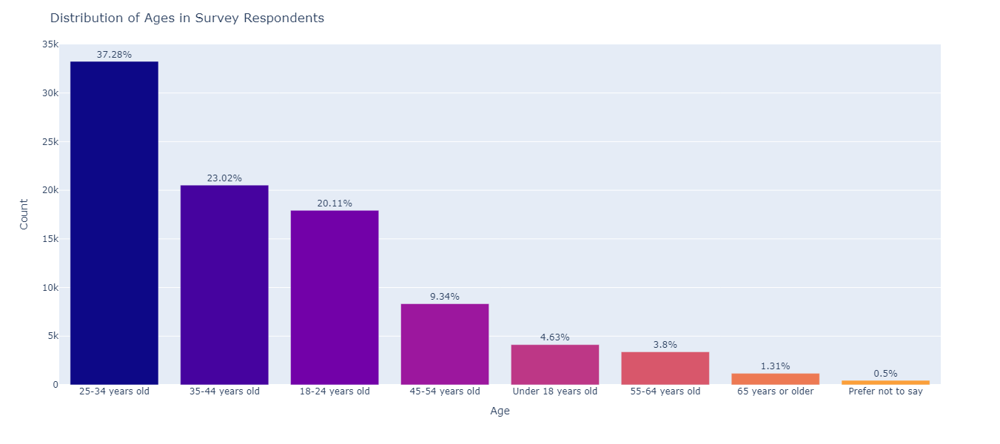

In [268]:
age_counts = df.Age.value_counts().reset_index(name='Count')
age_counts.columns = ['Age', 'Count']

total_count = age_counts['Count'].sum()
age_counts['Percentage'] = (age_counts['Count'] / total_count) * 100

fig = px.bar(age_counts, x='Age', y='Count', text=age_counts['Percentage'].round(2),color='Age',color_discrete_sequence=px.colors.sequential.Plasma,height=600)

fig.update_traces(texttemplate='%{text}%', textposition='outside')
fig.update_layout(title='Distribution of Ages in Survey Respondents',showlegend=False)

fig.show()

The majority of respondents **(37.28%) are aged 25-34**, followed by **35-44 (23.02%)**, indicating that the developer community is largely composed of young to mid-career professionals. A significant portion **(20.11%) are 18-24**, likely early-career or students. Representation declines in older age groups, with only **3.8% aged 55-64 and 1.31% aged 65 or older**, suggesting fewer senior developers actively engage on platforms like StackOverflow.

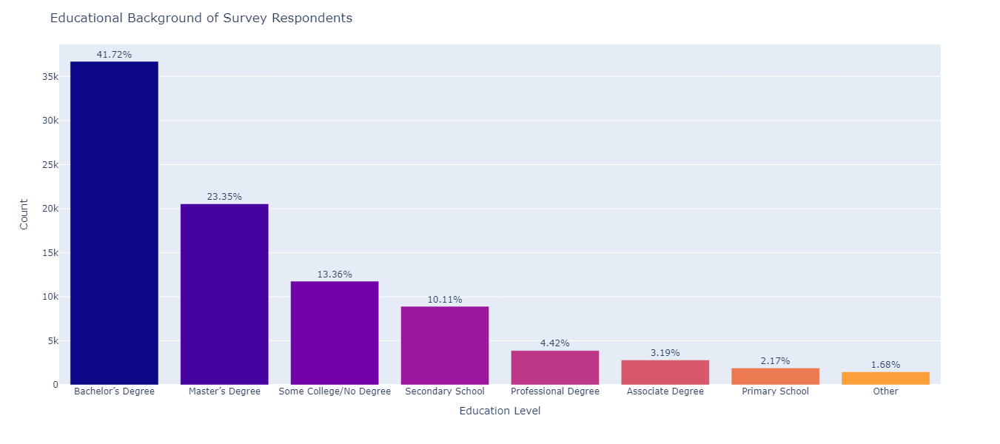

In [55]:
edlevel_mapping = {
    'Bachelor’s degree (B.A., B.S., B.Eng., etc.)': 'Bachelor’s Degree',
    'Some college/university study without earning a degree': 'Some College/No Degree',
    'Master’s degree (M.A., M.S., M.Eng., MBA, etc.)': 'Master’s Degree',
    'Primary/elementary school': 'Primary School',
    'Professional degree (JD, MD, Ph.D, Ed.D, etc.)': 'Professional Degree',
    'Associate degree (A.A., A.S., etc.)': 'Associate Degree',
    'Secondary school (e.g. American high school, German Realschule or Gymnasium, etc.)': 'Secondary School',
    'Something else': 'Other'
}
df['EdLevel'] = df['EdLevel'].replace(edlevel_mapping)

edlevel_counts = df.EdLevel.value_counts().reset_index(name='Count')
edlevel_counts.columns = ['Education Level', 'Count']

total_count = edlevel_counts['Count'].sum()
edlevel_counts['Percentage'] = (edlevel_counts['Count'] / total_count) * 100

fig = px.bar(edlevel_counts, x='Education Level', y='Count', text=edlevel_counts['Percentage'].round(2),
             color='Education Level', color_discrete_sequence=px.colors.sequential.Plasma,height=600)

fig.update_traces(texttemplate='%{text}%', textposition='outside')

fig.update_layout(title='Educational Background of Survey Respondents',showlegend=False)

fig.show()

- **Bachelor’s Degree (41.7%):** The majority of respondents have a bachelor’s degree, highlighting it as a key educational level for hiring in the tech industry.

- **Master’s Degree (23.35%):** A strong presence of advanced degree holders suggests demand for specialized, high-skill roles in the industry.

- **Professional Degree:** Professional degrees often indicate highly specialized knowledge and expertise in specific fields, which may translate into a reduced need for resources like StackOverflow.

- **Some College/No Degree (13.36%):** This group reflects a potential market for educational tools, upskilling, or certification programs.

- **Lower Education Levels:** Associate, secondary, and professional degrees represent smaller segments but could be niche talent pools for specific roles or markets.

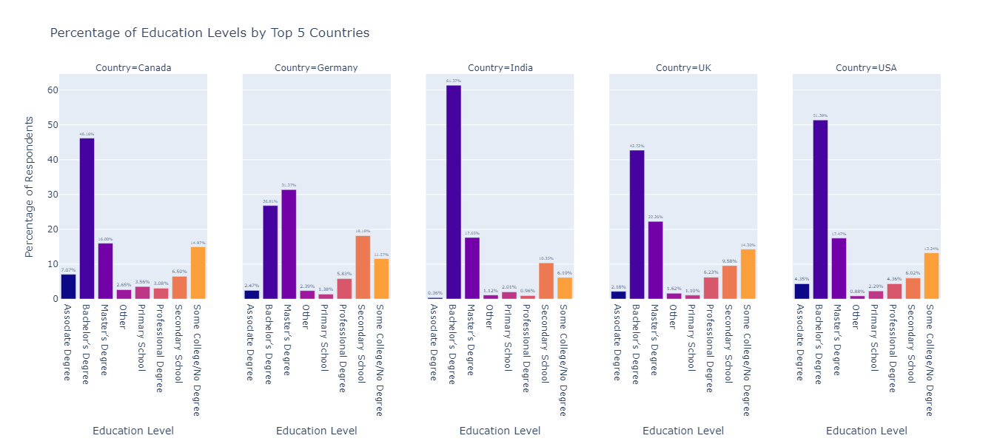

In [56]:
grouped_df = df.groupby(['Country', 'EdLevel']).size().reset_index(name='Count')
total_counts = grouped_df.groupby('Country')['Count'].transform('sum')
grouped_df['Percentage'] = (grouped_df['Count'] / total_counts) * 100
grouped_df = df.groupby(['Country', 'EdLevel']).size().reset_index(name='Count')
total_counts = grouped_df.groupby('Country')['Count'].transform('sum')
grouped_df['Percentage'] = (grouped_df['Count'] / total_counts) * 100
grouped_df['Country'] = grouped_df['Country'].replace({
    'United States of America': 'USA',
    'United Kingdom of Great Britain and Northern Ireland': 'UK'
})
top_countries = grouped_df.groupby('Country')['Count'].sum().nlargest(5).index

top_countries_df = grouped_df[grouped_df['Country'].isin(top_countries)]

fig = px.bar(top_countries_df, 
             x='EdLevel', 
             y='Percentage', 
             color='EdLevel', 
             facet_col='Country',
             title='Percentage of Education Levels by Top 5 Countries',
             labels={'Percentage': 'Percentage of Respondents', 'EdLevel': 'Education Level'},
             height=600,
             color_discrete_sequence=px.colors.sequential.Plasma,
             facet_col_spacing=0.04)

fig.update_traces(texttemplate='%{y:.2f}%', textposition='outside')

fig.update_layout(showlegend=False)

fig.show()

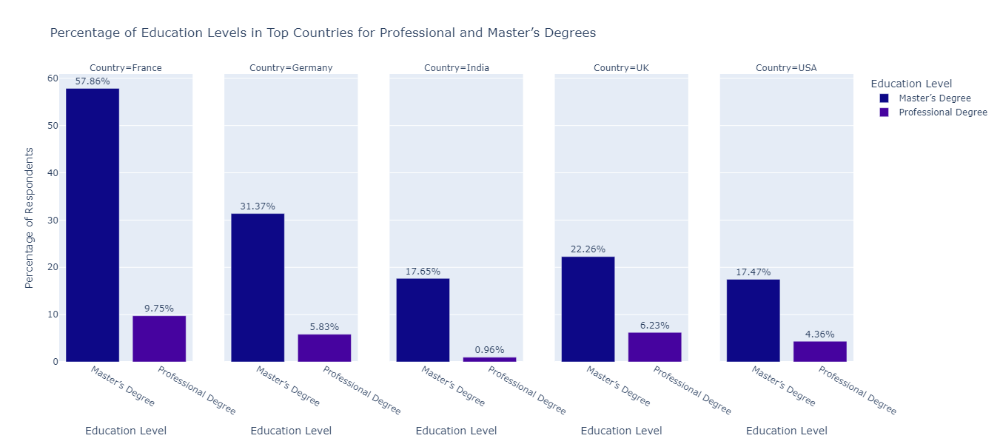

In [166]:
degree_df = grouped_df[grouped_df['EdLevel'].isin(['Professional Degree', 'Master’s Degree'])]
top_countries_by_degree = degree_df.groupby('Country')['Count'].sum().nlargest(5).index

top_countries_degree_df = degree_df[degree_df['Country'].isin(top_countries_by_degree)]

fig = px.bar(top_countries_degree_df, 
             x='EdLevel', 
             y='Percentage', 
             color='EdLevel', 
             facet_col='Country',
             title='Percentage of Education Levels in Top Countries for Professional and Master’s Degrees',
             labels={'Percentage': 'Percentage of Respondents', 'EdLevel': 'Education Level'},
             height=600,
             color_discrete_sequence=px.colors.sequential.Plasma,
             facet_col_spacing=0.04)

fig.update_traces(texttemplate='%{y:.2f}%', textposition='outside')

fig.show()

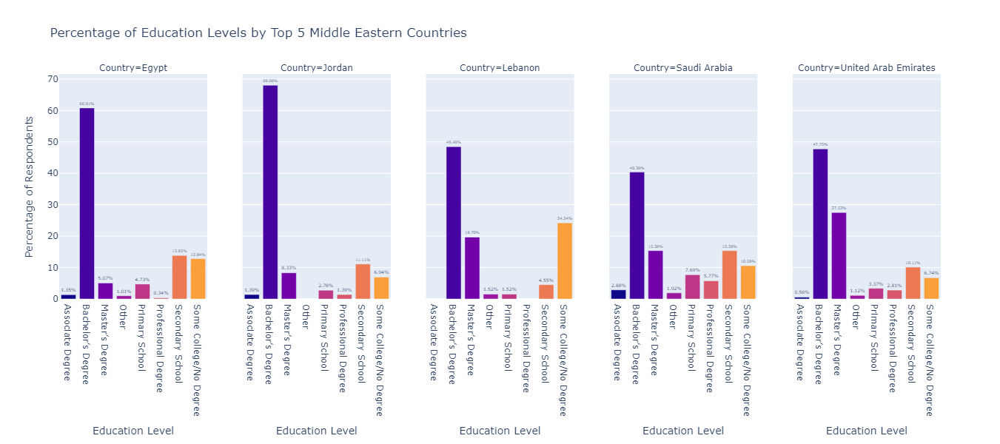

In [265]:
middle_east_countries = [
    'Bahrain', 'Egypt', 'Iran', 'Iraq', 'Jordan',
    'Kuwait', 'Lebanon', 'Oman', 'Qatar', 'Saudi Arabia', 'Syria',
    'United Arab Emirates', 'Yemen'
]

middle_east_df = grouped_df[grouped_df['Country'].isin(middle_east_countries)]

top_5_middle_east_countries = middle_east_df.groupby('Country')['Count'].sum().nlargest(5).index

top_5_middle_east_df = middle_east_df[middle_east_df['Country'].isin(top_5_middle_east_countries)]

fig = px.bar(top_5_middle_east_df, 
             x='EdLevel', 
             y='Percentage', 
             color='EdLevel', 
             facet_col='Country',
             title='Percentage of Education Levels by Top 5 Middle Eastern Countries',
             labels={'Percentage': 'Percentage of Respondents', 'EdLevel': 'Education Level'},
             height=600,
             color_discrete_sequence=px.colors.sequential.Plasma,
             facet_col_spacing=0.04)

fig.update_traces(texttemplate='%{y:.2f}%', textposition='outside')

fig.update_layout(showlegend=False)

fig.show()

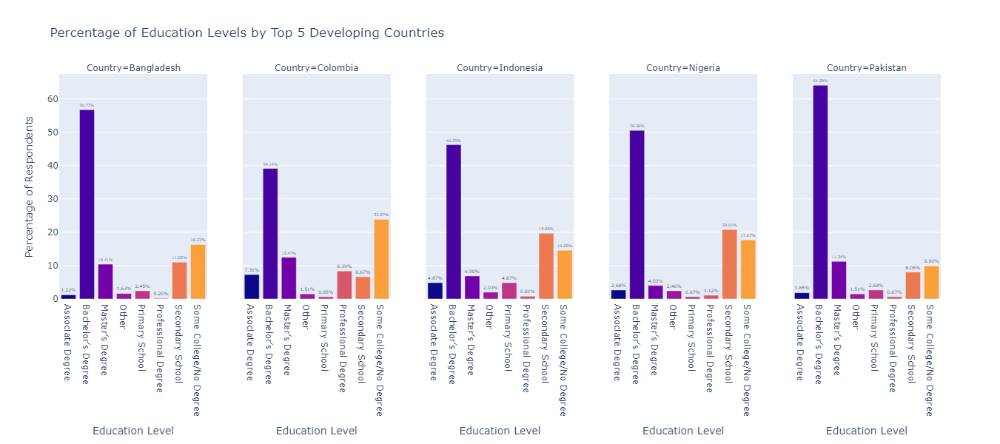

In [264]:
developing_countries = [
    'Afghanistan', 'Bangladesh', 'Benin', 'Bolivia', 'Burkina Faso',
    'Cambodia', 'Cameroon', 'Chad', 'Colombia', 'Congo', 'Ecuador',
    'El Salvador', 'Ethiopia', 'Ghana', 'Guinea', 'Haiti', 'Honduras',
     'Indonesia', 'Kenya', 'Laos', 'Liberia', 'Madagascar',
    'Malawi', 'Mali', 'Mauritania', 'Mozambique', 'Myanmar', 'Nepal',
    'Niger', 'Nigeria', 'Pakistan', 'Palestine', 'Paraguay', 'Peru',
    'Philippines', 'Rwanda', 'Senegal', 'Sierra Leone', 'Somalia',
    'South Sudan', 'Sri Lanka', 'Sudan', 'Tanzania', 'Timor-Leste',
    'Togo', 'Uganda','Venezuela', 'Zambia', 'Zimbabwe'
]

developing_df = grouped_df[grouped_df['Country'].isin(developing_countries)]

top_5_developing_countries = developing_df.groupby('Country')['Count'].sum().nlargest(5).index

top_5_developing_df = developing_df[developing_df['Country'].isin(top_5_developing_countries)]

fig = px.bar(top_5_developing_df, 
             x='EdLevel', 
             y='Percentage', 
             color='EdLevel', 
             facet_col='Country',
             title='Percentage of Education Levels by Top 5 Developing Countries',
             labels={'Percentage': 'Percentage of Respondents', 'EdLevel': 'Education Level'},
             height=600,
             color_discrete_sequence=px.colors.sequential.Plasma,
             facet_col_spacing=0.04)

fig.update_traces(texttemplate='%{y:.2f}%', textposition='outside')

fig.update_layout(showlegend=False)

fig.show()

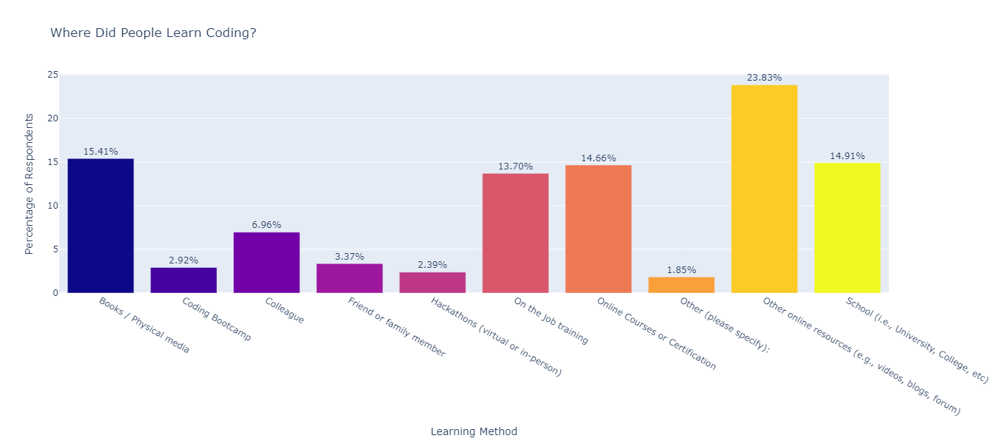

In [263]:
df_exploded = df.explode('LearnCode')

learn_code_df = df_exploded.groupby('LearnCode').size().reset_index(name='Count')

total_learners = learn_code_df['Count'].sum()
learn_code_df['Percentage'] = (learn_code_df['Count'] / total_learners) * 100

fig = px.bar(learn_code_df, 
             x='LearnCode', 
             y='Percentage', 
             color='LearnCode', 
             title='Where Did People Learn Coding?',
             labels={'Percentage': 'Percentage of Respondents', 'LearnCode': 'Learning Method'},
             height=600,
             color_discrete_sequence=px.colors.sequential.Plasma)

fig.update_traces(texttemplate='%{y:.2f}%', textposition='outside')

fig.update_layout(showlegend=False)

fig.show()

- **Online resources (videos, blogs, forums)** are the most popular coding learning method, used by 23.83%.
- **Books/Physical media** account for 15.41%.
- **Formal education (School/University)** is used by 14.91%.
- **Online courses/certifications** are chosen by 14.66%.
- **On-the-job training** helps 13.70% of learners gain coding skills.

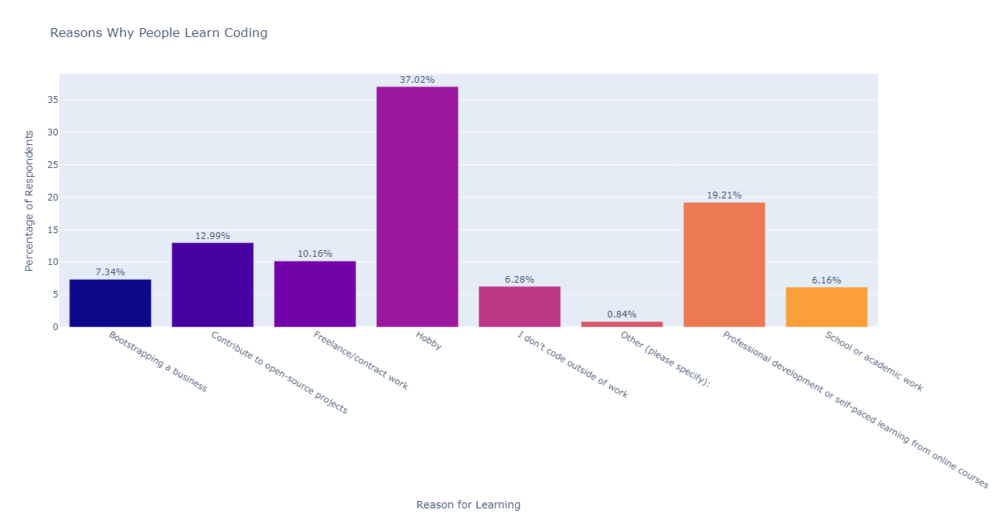

In [262]:
coding_activities_exploded = df.explode('CodingActivities')

coding_activities_df = coding_activities_exploded.groupby('CodingActivities').size().reset_index(name='Count')

total_reasons = coding_activities_df['Count'].sum()
coding_activities_df['Percentage'] = (coding_activities_df['Count'] / total_reasons) * 100

fig = px.bar(coding_activities_df, 
             x='CodingActivities', 
             y='Percentage', 
             title='Reasons Why People Learn Coding',
             labels={'Percentage': 'Percentage of Respondents', 'CodingActivities': 'Reason for Learning'},
             height=700,
             color='CodingActivities',
             color_discrete_sequence=px.colors.sequential.Plasma)

fig.update_traces(texttemplate='%{y:.2f}%', textposition='outside')

fig.update_layout(showlegend=False)

fig.show()

- Most people learned coding for **personal enjoyment (hobby)** and **professional development**, while a notable portion contributes to **open-source projects** or engages in **freelance work**

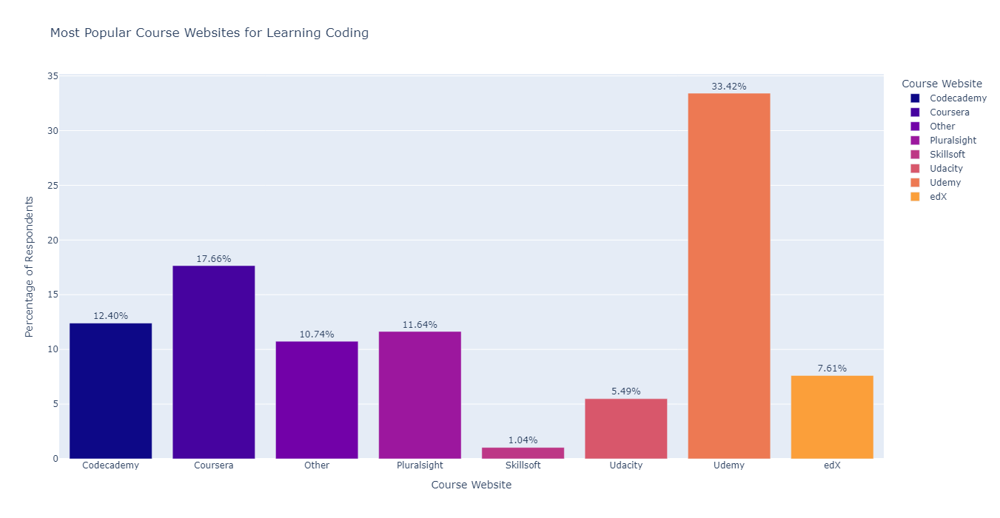

In [261]:
learn_code_courses_cert_exploded = df.explode('LearnCodeCoursesCert')

learn_code_courses_cert_df = learn_code_courses_cert_exploded.groupby('LearnCodeCoursesCert').size().reset_index(name='Count')

total_courses = learn_code_courses_cert_df['Count'].sum()

learn_code_courses_cert_df['Percentage'] = (learn_code_courses_cert_df['Count'] / total_courses) * 100

fig = px.bar(learn_code_courses_cert_df, 
             x='LearnCodeCoursesCert', 
             y='Percentage', 
             title='Most Popular Course Websites for Learning Coding',
             labels={'Percentage': 'Percentage of Respondents', 'LearnCodeCoursesCert': 'Course Website'},
             height=700,
             color='LearnCodeCoursesCert',
             color_discrete_sequence=px.colors.sequential.Plasma)

fig.update_traces(texttemplate='%{y:.2f}%', textposition='outside')

fig.show()

- **Udemy:** Udemy dominates with 33.42% of users, indicating strong popularity and broad course selection.

- **Coursera** and **Codecademy:** **Coursera** (17.66%) and **Codecademy** (12.40%) are also popular, valued for their comprehensive and interactive content.

- **Pluralsight** (11.64%) and **edX** (7.61%) attract users seeking specialized or high-quality courses.

- **Skillsoft** (1.04%) and **Udacity** (5.49%) have smaller shares, suggesting limited appeal or niche focus

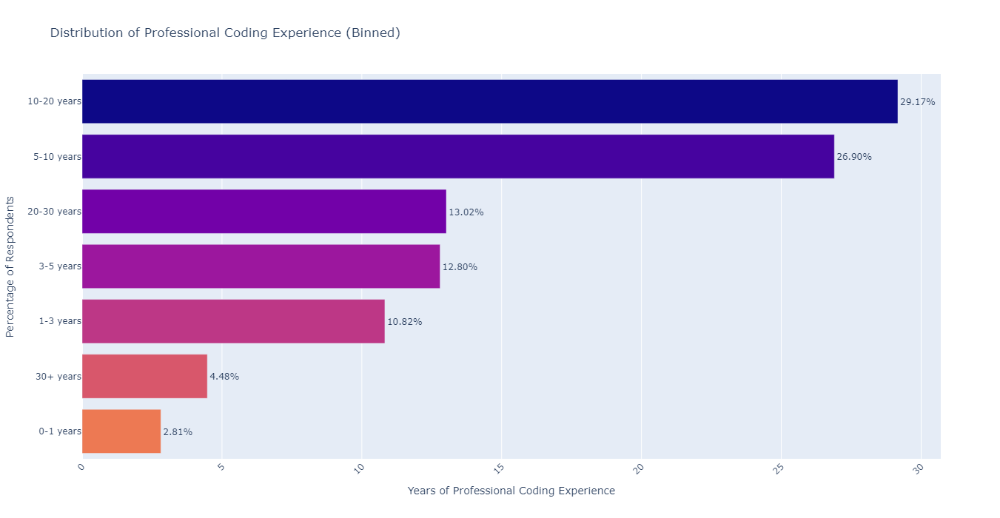

In [260]:
bins = [0, 1, 3, 5, 10, 20, 30, 40]
labels = ['0-1 years', '1-3 years', '3-5 years', '5-10 years', '10-20 years', '20-30 years', '30+ years']

df['YearsCodeProBin'] = pd.cut(df['YearsCodePro'].astype(float), bins=bins, labels=labels, right=False)

years_code_pro_bin_df = df['YearsCodeProBin'].value_counts().reset_index()
years_code_pro_bin_df.columns = ['YearsCodeProBin', 'Count']

total_respondents = years_code_pro_bin_df['Count'].sum()
years_code_pro_bin_df['Percentage'] = (years_code_pro_bin_df['Count'] / total_respondents) * 100

fig = px.bar(years_code_pro_bin_df, 
             x='Percentage', 
             y='YearsCodeProBin', 
             title='Distribution of Professional Coding Experience (Binned)',
             labels={'Percentage': 'Percentage of Respondents', 'YearsCodeProBin': 'Years of Professional Coding Experience'},
             height=700,
             color='YearsCodeProBin',
             color_discrete_sequence=px.colors.sequential.Plasma,
             orientation='h')

fig.update_traces(texttemplate='%{x:.2f}%', textposition='outside')

fig.update_layout(xaxis_title='Years of Professional Coding Experience', yaxis_title='Percentage of Respondents', xaxis_tickangle=-45)

fig.update_layout(showlegend=False)

fig.show()

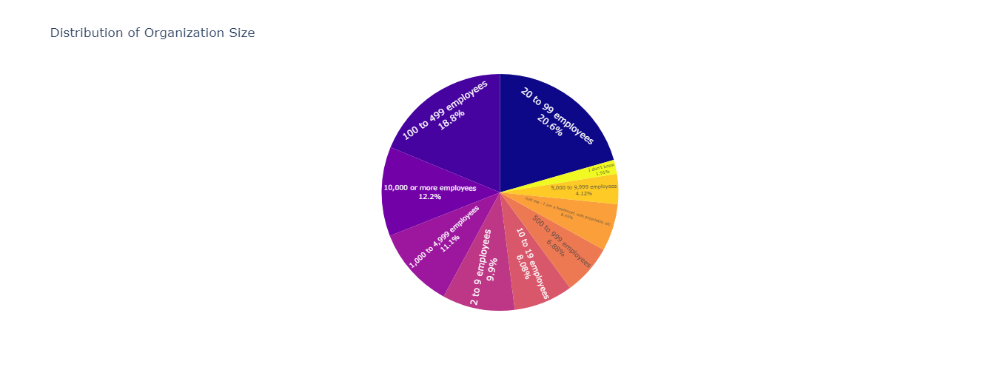

In [259]:
org_size_df = df['OrgSize'].value_counts().reset_index()
org_size_df.columns = ['OrgSize', 'Count']

total_org_size = org_size_df['Count'].sum()
org_size_df['Percentage'] = (org_size_df['Count'] / total_org_size) * 100

fig = px.pie(org_size_df, 
             names='OrgSize', 
             values='Count', 
             title='Distribution of Organization Size',
             labels={'Count': 'Number of Respondents'},
             color='OrgSize', 
             height=500,
             color_discrete_sequence=px.colors.sequential.Plasma)

fig.update_traces(textinfo='label+percent', 
                  textposition='inside')
fig.update_layout(showlegend=False)

fig.show()

- **20 to 99 employees:** The most common size, with 20.6% of respondents working in organizations of this size.
- **100 to 499 employees:** Close behind, with 18.8% of respondents.
- **1,000 to 4,999 employees:** Accounts for 11.1% of the responses, showing a notable segment of mid-sized companies.
- **10,000 or more employees:** Represents 12.2% of the respondents, indicating a significant portion of large enterprises.
- **Just me - freelancer/sole proprietor:** 6.5% are self-employed or working independently.

In [16]:
from dash import dcc, html, Dash
from dash.dependencies import Input, Output

app = Dash(__name__)

def prepare_treemap_data(df, col_have_worked, col_want_to_work):
    have_worked_counts = df.explode(col_have_worked).groupby(['DevType', col_have_worked]).size().reset_index(name='HaveWorkedCount')
    want_to_work_counts = df.explode(col_want_to_work).groupby(['DevType', col_want_to_work]).size().reset_index(name='WantToWorkCount')

    have_worked_counts.rename(columns={col_have_worked: 'Tech'}, inplace=True)
    want_to_work_counts.rename(columns={col_want_to_work: 'Tech'}, inplace=True)

    devtype_totals_have_worked = have_worked_counts.groupby('DevType')['HaveWorkedCount'].sum().reset_index()
    devtype_totals_have_worked.rename(columns={'HaveWorkedCount': 'TotalHaveWorked'}, inplace=True)

    devtype_totals_want_to_work = want_to_work_counts.groupby('DevType')['WantToWorkCount'].sum().reset_index()
    devtype_totals_want_to_work.rename(columns={'WantToWorkCount': 'TotalWantToWork'}, inplace=True)

    have_worked_counts = pd.merge(have_worked_counts, devtype_totals_have_worked, on='DevType')
    want_to_work_counts = pd.merge(want_to_work_counts, devtype_totals_want_to_work, on='DevType')

    have_worked_counts['Percentage'] = (have_worked_counts['HaveWorkedCount'] / have_worked_counts['TotalHaveWorked']) * 100
    want_to_work_counts['Percentage'] = (want_to_work_counts['WantToWorkCount'] / want_to_work_counts['TotalWantToWork']) * 100

    have_worked_counts = have_worked_counts.dropna(subset=['DevType'])
    want_to_work_counts = want_to_work_counts.dropna(subset=['DevType'])

    # Combine data for plotting
    combined_counts = pd.merge(have_worked_counts, want_to_work_counts, on=['DevType', 'Tech'], how='outer', suffixes=('_HaveWorked', '_WantToWork'))
    combined_counts['HaveWorked_Percentage'] = combined_counts['Percentage_HaveWorked'].fillna(0)
    combined_counts['WantToWork_Percentage'] = combined_counts['Percentage_WantToWork'].fillna(0)
    
    combined_counts = combined_counts.melt(id_vars=['DevType', 'Tech'], 
                                           value_vars=['HaveWorked_Percentage', 'WantToWork_Percentage'],
                                           var_name='Category',
                                           value_name='Percentage')
    
    combined_counts['Category'] = combined_counts['Category'].str.replace('HaveWorked_Percentage', 'Have Worked With')
    combined_counts['Category'] = combined_counts['Category'].str.replace('WantToWork_Percentage', 'Want To Work With')

    return combined_counts

attributes = {
    'Languages': ('LanguageHaveWorkedWith', 'LanguageWantToWorkWith'),
    'Databases': ('DatabaseHaveWorkedWith', 'DatabaseWantToWorkWith'),
    'Platforms': ('PlatformHaveWorkedWith', 'PlatformWantToWorkWith'),
    'Webframes': ('WebframeHaveWorkedWith', 'WebframeWantToWorkWith'),
    'MiscTech': ('MiscTechHaveWorkedWith', 'MiscTechWantToWorkWith'),
    'CollabTools': ('NEWCollabToolsHaveWorkedWith', 'NEWCollabToolsWantToWorkWith')
}

prepared_data = {}
for title, (col_have_worked, col_want_to_work) in attributes.items():
    prepared_data[title] = prepare_treemap_data(df, col_have_worked, col_want_to_work)

app.layout = html.Div([
    dcc.Dropdown(
        id='devtype-dropdown',
        options=[{'label': devtype, 'value': devtype} for devtype in df['DevType'].dropna().unique()],
        value=df['DevType'].dropna().unique()[0]
    ),
    dcc.Dropdown(
        id='attribute-dropdown',
        options=[{'label': title, 'value': title} for title in attributes.keys()],
        value='Languages'
    ),
    dcc.Graph(id='treemap-graph')
])

@app.callback(
    Output('treemap-graph', 'figure'),
    [Input('devtype-dropdown', 'value'),
     Input('attribute-dropdown', 'value')]
)
def update_treemap(selected_devtype, selected_attribute):
    combined_counts = prepared_data[selected_attribute]
    devtype_counts = combined_counts[combined_counts['DevType'] == selected_devtype]

    fig = px.treemap(devtype_counts, 
                     path=['Category', 'Tech'],
                     values='Percentage',
                     color='Percentage',
                     color_continuous_scale='Blues',
                     labels={'Percentage': 'Percentage of Respondents'},
                     title=f'{selected_attribute} for {selected_devtype}',height=600)
    
    fig.update_traces(texttemplate='%{label}<br>%{value:.2f}%', textposition='middle center')
    
    return fig

if __name__ == '__main__':
    app.run_server(debug=True)

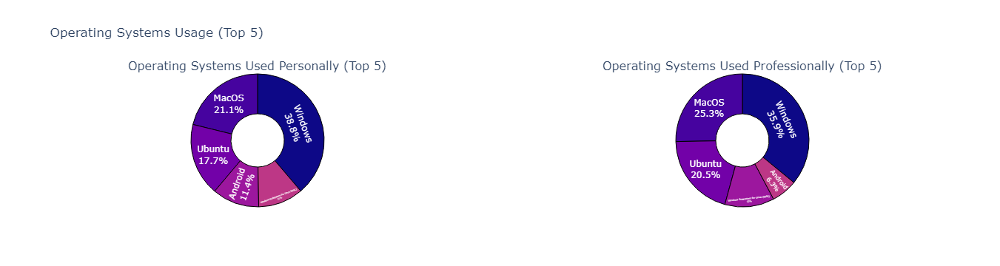

In [24]:


df_personal = df.explode('OpSysPersonal use')
df_professional = df.explode('OpSysProfessional use')

personal_data = df_personal['OpSysPersonal use'].value_counts().reset_index()
personal_data.columns = ['OpSysPersonal use', 'Count']
total_personal = personal_data['Count'].sum()
personal_data['Percentage'] = (personal_data['Count'] / total_personal) * 100

professional_data = df_professional['OpSysProfessional use'].value_counts().reset_index()
professional_data.columns = ['OpSysProfessional use', 'Count']
total_professional = professional_data['Count'].sum()
professional_data['Percentage'] = (professional_data['Count'] / total_professional) * 100

top_5_personal_data = personal_data.head(5)
top_5_professional_data = professional_data.head(5)

fig_personal = px.pie(top_5_personal_data, 
                     names='OpSysPersonal use', 
                     values='Count', 
                     title='Operating Systems Used Personally (Top 5)',
                     labels={'Count': 'Number of Respondents'},
                     hole=0.4,
                     height=700,
                     color='OpSysPersonal use',
                     color_discrete_sequence=px.colors.sequential.Plasma)
fig_personal.update_traces(textinfo='label+percent', 
                           textposition='inside',
                           marker=dict(line=dict(color='#000000', width=1)))

fig_professional = px.pie(top_5_professional_data, 
                         names='OpSysProfessional use', 
                         values='Count', 
                         title='Operating Systems Used Professionally (Top 5)',
                         labels={'Count': 'Number of Respondents'},
                         hole=0.4,
                         height=700,
                         color='OpSysProfessional use',
                         color_discrete_sequence=px.colors.sequential.Plasma)
fig_professional.update_traces(textinfo='label+percent', 
                               textposition='inside',
                               marker=dict(line=dict(color='#000000', width=1)))

fig = make_subplots(rows=1, cols=2, 
                    subplot_titles=('Operating Systems Used Personally (Top 5)', 'Operating Systems Used Professionally (Top 5)'),
                    specs=[[{'type': 'pie'}, {'type': 'pie'}]])

fig.add_trace(fig_personal.data[0], row=1, col=1)
fig.add_trace(fig_professional.data[0], row=1, col=2)


fig.update_layout(title_text='Operating Systems Usage (Top 5)', showlegend=False)
fig.show()

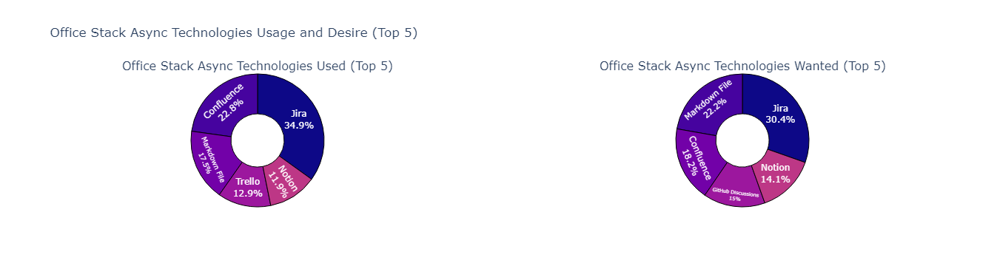

In [22]:
df_async_have_worked = df.explode('OfficeStackAsyncHaveWorkedWith')
async_have_worked_data = df_async_have_worked['OfficeStackAsyncHaveWorkedWith'].value_counts().reset_index()
async_have_worked_data.columns = ['OfficeStackAsyncHaveWorkedWith', 'Count']
total_async_have_worked = async_have_worked_data['Count'].sum()
async_have_worked_data['Percentage'] = (async_have_worked_data['Count'] / total_async_have_worked) * 100

df_async_want_to_work = df.explode('OfficeStackAsyncWantToWorkWith')
async_want_to_work_data = df_async_want_to_work['OfficeStackAsyncWantToWorkWith'].value_counts().reset_index()
async_want_to_work_data.columns = ['OfficeStackAsyncWantToWorkWith', 'Count']
total_async_want_to_work = async_want_to_work_data['Count'].sum()
async_want_to_work_data['Percentage'] = (async_want_to_work_data['Count'] / total_async_want_to_work) * 100

top_5_async_have_worked_data = async_have_worked_data.head(5)
top_5_async_want_to_work_data = async_want_to_work_data.head(5)

fig_async_have_worked = px.pie(top_5_async_have_worked_data, 
                              names='OfficeStackAsyncHaveWorkedWith', 
                              values='Count', 
                              title='Office Stack Async Technologies Used (Top 5)',
                              labels={'Count': 'Number of Respondents'},
                              hole=0.4,
                              height=700,
                              color='OfficeStackAsyncHaveWorkedWith',
                              color_discrete_sequence=px.colors.sequential.Plasma)
fig_async_have_worked.update_traces(textinfo='label+percent', 
                                    textposition='inside',
                                    marker=dict(line=dict(color='#000000', width=1)))

fig_async_want_to_work = px.pie(top_5_async_want_to_work_data, 
                                names='OfficeStackAsyncWantToWorkWith', 
                                values='Count', 
                                title='Office Stack Async Technologies Wanted (Top 5)',
                                labels={'Count': 'Number of Respondents'},
                                hole=0.4,
                                height=700,
                                color='OfficeStackAsyncWantToWorkWith',
                                color_discrete_sequence=px.colors.sequential.Plasma)
fig_async_want_to_work.update_traces(textinfo='label+percent', 
                                     textposition='inside',
                                     marker=dict(line=dict(color='#000000', width=1)))

fig = make_subplots(rows=1, cols=2, 
                    subplot_titles=('Office Stack Async Technologies Used (Top 5)', 
                                    'Office Stack Async Technologies Wanted (Top 5)'),
                    specs=[[{'type': 'pie'}, {'type': 'pie'}]])

fig.add_trace(fig_async_have_worked.data[0], row=1, col=1)
fig.add_trace(fig_async_want_to_work.data[0], row=1, col=2)

fig.update_layout(title_text='Office Stack Async Technologies Usage and Desire (Top 5)', showlegend=False)
fig.show()

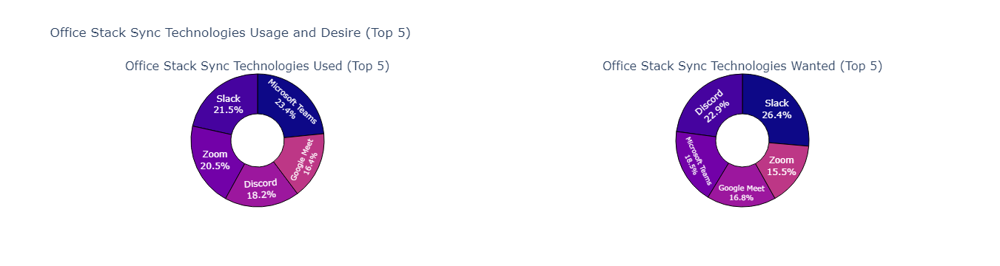

In [23]:
df_sync_have_worked = df.explode('OfficeStackSyncHaveWorkedWith')
sync_have_worked_data = df_sync_have_worked['OfficeStackSyncHaveWorkedWith'].value_counts().reset_index()
sync_have_worked_data.columns = ['OfficeStackSyncHaveWorkedWith', 'Count']
total_sync_have_worked = sync_have_worked_data['Count'].sum()
sync_have_worked_data['Percentage'] = (sync_have_worked_data['Count'] / total_sync_have_worked) * 100

df_sync_want_to_work = df.explode('OfficeStackSyncWantToWorkWith')
sync_want_to_work_data = df_sync_want_to_work['OfficeStackSyncWantToWorkWith'].value_counts().reset_index()
sync_want_to_work_data.columns = ['OfficeStackSyncWantToWorkWith', 'Count']
total_sync_want_to_work = sync_want_to_work_data['Count'].sum()
sync_want_to_work_data['Percentage'] = (sync_want_to_work_data['Count'] / total_sync_want_to_work) * 100

top_5_sync_have_worked_data = sync_have_worked_data.head(5)
top_5_sync_want_to_work_data = sync_want_to_work_data.head(5)

fig_sync_have_worked = px.pie(top_5_sync_have_worked_data, 
                              names='OfficeStackSyncHaveWorkedWith', 
                              values='Count', 
                              title='Office Stack Sync Technologies Used (Top 5)',
                              labels={'Count': 'Number of Respondents'},
                              hole=0.4,
                              height=700,
                              color='OfficeStackSyncHaveWorkedWith',
                              color_discrete_sequence=px.colors.sequential.Plasma)
fig_sync_have_worked.update_traces(textinfo='label+percent', 
                                   textposition='inside',
                                   marker=dict(line=dict(color='#000000', width=1)))

fig_sync_want_to_work = px.pie(top_5_sync_want_to_work_data, 
                               names='OfficeStackSyncWantToWorkWith', 
                               values='Count', 
                               title='Office Stack Sync Technologies Wanted (Top 5)',
                               labels={'Count': 'Number of Respondents'},
                               hole=0.4,
                               height=700,
                               color='OfficeStackSyncWantToWorkWith',
                               color_discrete_sequence=px.colors.sequential.Plasma)
fig_sync_want_to_work.update_traces(textinfo='label+percent', 
                                    textposition='inside',
                                    marker=dict(line=dict(color='#000000', width=1)))

fig = make_subplots(rows=1, cols=2, 
                    subplot_titles=('Office Stack Sync Technologies Used (Top 5)', 
                                    'Office Stack Sync Technologies Wanted (Top 5)'),
                    specs=[[{'type': 'pie'}, {'type': 'pie'}]])

fig.add_trace(fig_sync_have_worked.data[0], row=1, col=1)
fig.add_trace(fig_sync_want_to_work.data[0], row=1, col=2)

fig.update_layout(title_text='Office Stack Sync Technologies Usage and Desire (Top 5)', showlegend=False)
fig.show()

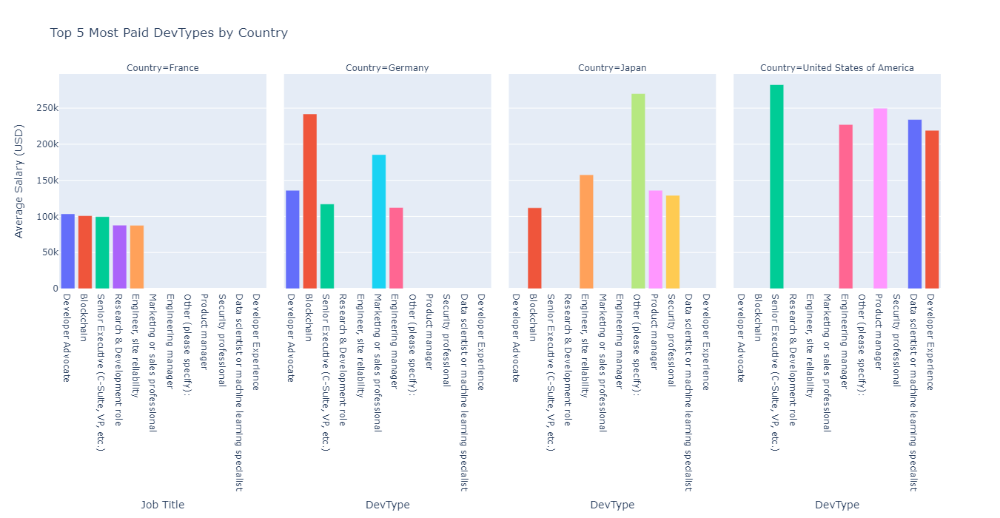

In [65]:
conversion_rates = {
    'USD': 1.0,    # USD is the base currency
    'EUR': 1.1,  # 1 EUR = 1.1 USD
    'JPY': 0.007 # 1 JPY = 0.007 USD
}
df['ConvertedCompYearlyUSD'] = df.apply(lambda row: row['ConvertedCompYearly'] * conversion_rates.get(row['Country'], 1), axis=1)

grouped = df.groupby(['Country', 'DevType'])['ConvertedCompYearlyUSD'].mean().reset_index()

countries_of_interest = ['United States of America', 'Japan', 'France', 'Germany']

filtered_data = grouped[grouped['Country'].isin(countries_of_interest)]

top_5_devtypes = (filtered_data
                   .sort_values(by=['Country', 'ConvertedCompYearlyUSD'], ascending=[True, False])
                   .groupby('Country')
                   .head(5))

fig = px.bar(top_5_devtypes, 
             x='DevType', 
             y='ConvertedCompYearlyUSD', 
             color='DevType',
             facet_col='Country',
             height=700,
             title='Top 5 Most Paid DevTypes in USA, Japan, France, and Germany')

fig.update_layout(title_text='Top 5 Most Paid DevTypes by Country', xaxis_title='Job Title', yaxis_title='Average Salary (USD)',showlegend=False)
fig.show()

***Top Salaries by Country:***

- **Germany** and **United States** have exceptionally high salaries for specific roles, with **Germany** leading in blockchain and the **United States** in senior executive roles.

- **Japan** shows high compensation in unique or specialized roles, reflecting niche areas of high demand.

***Roles with High Salaries:***

- **Blockchain** and **Senior Executive** roles consistently show high salaries, indicating strong demand for these positions.

- **Product Managers** and **Engineering Managers** are also highly valued across multiple countries.

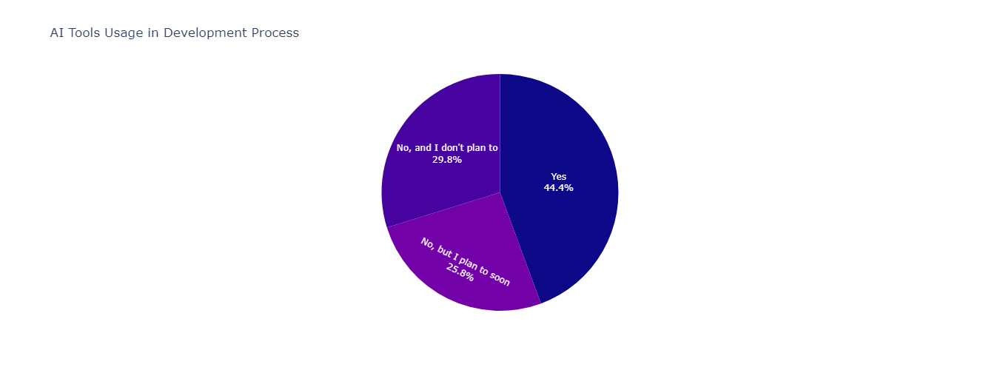

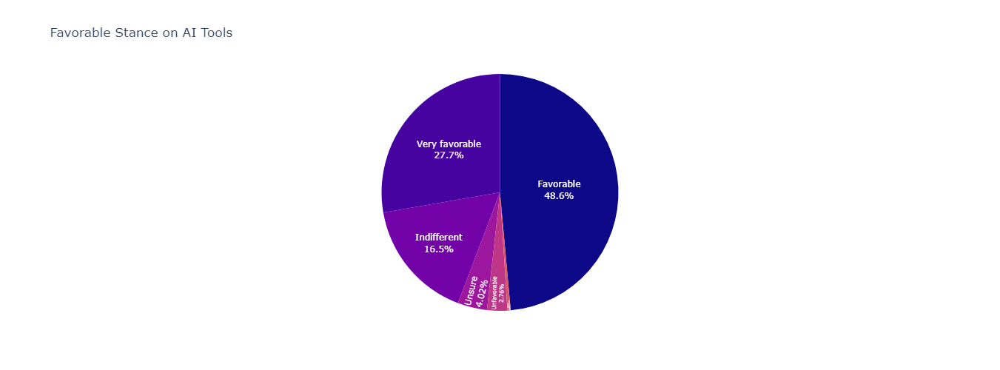

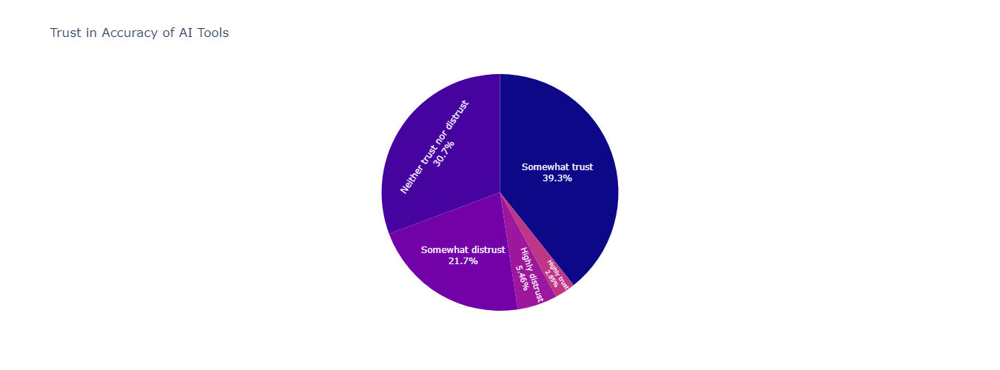

In [74]:
def create_pie_chart(df, column_name, title):
    # Drop null values and get value counts
    data = df[column_name].dropna().value_counts().reset_index()
    data.columns = [column_name, 'Count']
    
    # Create the pie chart
    fig = px.pie(data, names=column_name, values='Count', 
                 title=title, 
                 height=500,
                 color=column_name, 
                 color_discrete_sequence=px.colors.sequential.Plasma,
                 labels={column_name: column_name, 'Count': 'Count'})
    fig.update_traces(textinfo='label+percent', textposition='inside')
    fig.update_layout(showlegend=False)
    fig.show()

# Create and display pie charts
create_pie_chart(df, 'AISelect', 'AI Tools Usage in Development Process')
create_pie_chart(df, 'AISent', 'Favorable Stance on AI Tools')
create_pie_chart(df, 'AIBen', 'Trust in Accuracy of AI Tools')

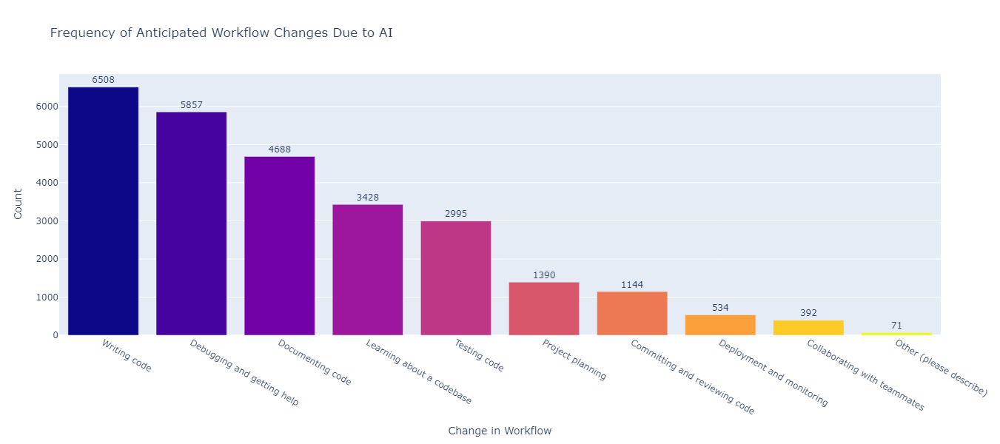

In [87]:
df_exploded = df.explode('AINextVery different')

count_data = df_exploded['AINextVery different'].value_counts().reset_index()
count_data.columns = ['AINextVery different', 'Count']

fig = px.bar(count_data, 
             x='AINextVery different', 
             y='Count',
             height=600,
             title='Frequency of Anticipated Workflow Changes Due to AI',
             labels={'AINextVery different': 'Change in Workflow', 'Count': 'Count'},
             color='AINextVery different',
             color_discrete_sequence=px.colors.sequential.Plasma)

fig.update_layout(xaxis_title='Change in Workflow', yaxis_title='Count',showlegend=False)
fig.update_traces(texttemplate='%{y}', textposition='outside')

fig.show()

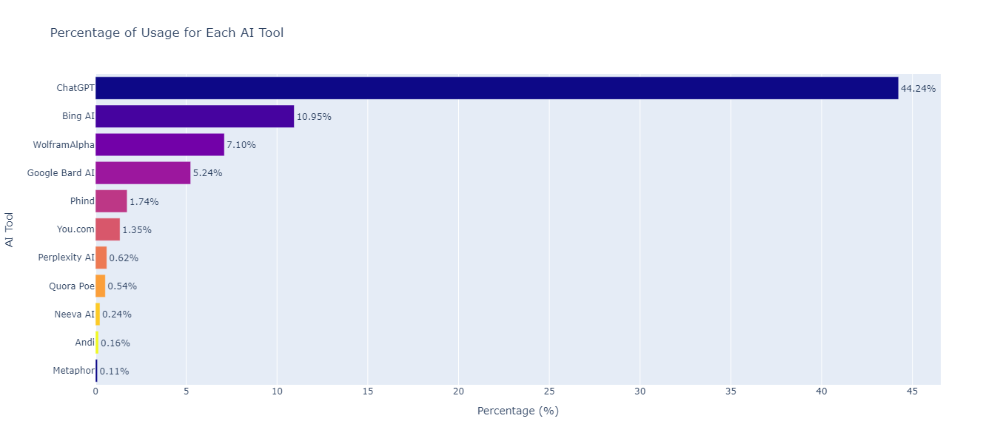

In [95]:
df_exploded = df.explode('AISearchHaveWorkedWith')

count_data = df_exploded['AISearchHaveWorkedWith'].value_counts().reset_index()
count_data.columns = ['AI Tool', 'Count']

total_entries = len(df_exploded)

count_data['Percentage'] = (count_data['Count'] / total_entries) * 100

fig = px.bar(count_data, 
             x='Percentage', 
             y='AI Tool',
             height=600,
             title='Percentage of Usage for Each AI Tool',
             labels={'AI Tool': 'AI Tool', 'Percentage': 'Percentage (%)'},
             color='AI Tool',
             color_discrete_sequence=px.colors.sequential.Plasma,
             orientation='h')

fig.update_layout(xaxis_title='Percentage (%)', yaxis_title='AI Tool', showlegend=False)
fig.update_traces(texttemplate='%{x:.2f}%', textposition='outside')

fig.show()

<div style="
  background-color: #e3f2fd;
  padding: 15px;
  border-left: 6px solid #0d47a1;
  border-radius: 8px;
  font-family: 'Georgia', serif;
  color: #01579b;
  font-size: 28px;
  text-align: center;
  font-weight: bold;
">
  ✨ Preprocessing

</div>


In [29]:
processed_data = data.copy()

In [30]:
processed_data.head()

,ResponseId,Q120,MainBranch,Age,Employment,RemoteWork,CodingActivities,EdLevel,LearnCode,LearnCodeOnline,LearnCodeCoursesCert,YearsCode,YearsCodePro,DevType,OrgSize,PurchaseInfluence,TechList,BuyNewTool,Country,Currency,CompTotal,LanguageHaveWorkedWith,LanguageWantToWorkWith,DatabaseHaveWorkedWith,DatabaseWantToWorkWith,PlatformHaveWorkedWith,PlatformWantToWorkWith,WebframeHaveWorkedWith,WebframeWantToWorkWith,MiscTechHaveWorkedWith,MiscTechWantToWorkWith,ToolsTechHaveWorkedWith,ToolsTechWantToWorkWith,NEWCollabToolsHaveWorkedWith,NEWCollabToolsWantToWorkWith,OpSysPersonal use,OpSysProfessional use,OfficeStackAsyncHaveWorkedWith,OfficeStackAsyncWantToWorkWith,OfficeStackSyncHaveWorkedWith,OfficeStackSyncWantToWorkWith,AISearchHaveWorkedWith,AISearchWantToWorkWith,AIDevHaveWorkedWith,AIDevWantToWorkWith,NEWSOSites,SOVisitFreq,SOAccount,SOPartFreq,SOComm,SOAI,AISelect,AISent,AIAcc,AIBen,AIToolInterested in Using,AIToolCurrently Using,AIToolNot interested in Using,AINextVery different,AINextNeither different nor similar,AINextSomewhat similar,AINextVery similar,AINextSomewhat different,TBranch,ICorPM,WorkExp,Knowledge_1,Knowledge_2,Knowledge_3,Knowledge_4,Knowledge_5,Knowledge_6,Knowledge_7,Knowledge_8,Frequency_1,Frequency_2,Frequency_3,TimeSearching,TimeAnswering,ProfessionalTech,Industry,SurveyLength,SurveyEase,ConvertedCompYearly
0,1,I agree,None of these,18-24 years old,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,2,I agree,I am a developer by profession,25-34 years old,"Employed, full-time",Remote,Hobby;Contribute to open-source projects;Boots...,"Bachelor’s degree (B.A., B.S., B.Eng., etc.)",Books / Physical media;Colleague;Friend or fam...,Formal documentation provided by the owner of ...,Other,18,9,"Senior Executive (C-Suite, VP, etc.)",2 to 9 employees,I have a great deal of influence,Investigate,Start a free trial;Ask developers I know/work ...,United States of America,USD\tUnited States dollar,285000.0,HTML/CSS;JavaScript;Python,Bash/Shell (all shells);C#;Dart;Elixir;GDScrip...,Supabase,Firebase Realtime Database;Supabase,Amazon Web Services (AWS);Netlify;Vercel,Fly.io;Netlify;Render,Next.js;React;Remix;Vue.js,Deno;Elm;Nuxt.js;React;Svelte;Vue.js,Electron;React Native;Tauri,Capacitor;Electron;Tauri;Uno Platform;Xamarin,Docker;Kubernetes;npm;Pip;Vite;Webpack;Yarn,Godot;npm;pnpm;Unity 3D;Unreal Engine;Vite;Web...,Vim;Visual Studio Code,Vim;Visual Studio Code,iOS;iPadOS;MacOS;Windows;Windows Subsystem for...,MacOS;Windows;Windows Subsystem for Linux (WSL),Asana;Basecamp;GitHub Discussions;Jira;Linear;...,GitHub Discussions;Linear;Notion;Trello,Cisco Webex Teams;Discord;Google Chat;Google M...,Discord;Signal;Slack;Zoom,ChatGPT,ChatGPT;Neeva AI,GitHub Copilot,GitHub Copilot,Stack Overflow;Stack Exchange,Daily or almost daily,Yes,A few times per month or weekly,"Yes, definitely","I don't think it's super necessary, but I thin...",Yes,Indifferent,Other (please explain),Somewhat distrust,Learning about a codebase;Writing code;Debuggi...,Writing code;Committing and reviewing code,NaN,NaN,NaN,NaN,NaN,NaN,Yes,People manager,10.0,Strongly agree,Agree,Strongly agree,Agree,Agree,Agree,Agree,Strongly agree,1-2 times a week,10+ times a week,Never,15-30 minutes a day,15-30 minutes a day,DevOps function;Microservices;Automated testin...,"Information Services, IT, Software Development...",Appropriate in length,Easy,285000.0
2,3,I agree,I am a developer by profession,45-54 years old,"Employed, full-time","Hybrid (some remote, some in-person)",Hobby;Professional development or self-paced l...,"Bachelor’s degree (B.A., B.S., B.Eng., etc.)",Books / Physical media;Colleague;On the job tr...,Formal documentation provided by the owner of ...,NaN,27,23,"Developer, back-end



<div style="
  background-color: #e3f2fd;
  padding: 12px;
  border-left: 4px solid #0d47a1; 
  border-radius: 6px;
  font-family: 'Georgia', serif;
  color: #0288d1; 
  font-size: 24px; 
  text-align: left;
">
  Fix years columns
</div>

In [31]:
for col, replacement in REPLACE_DICT.items():
    processed_data[col] = processed_data[col].replace(replacement).astype(np.float32)



<div style="
  background-color: #e3f2fd;
  padding: 12px;
  border-left: 4px solid #0d47a1; 
  border-radius: 6px;
  font-family: 'Georgia', serif;
  color: #0288d1; 
  font-size: 24px; 
  text-align: left;
">
Split the answers
</div>

In [32]:
object_cols = processed_data.select_dtypes(include='object').columns.tolist()
for col in object_cols:
    processed_data[col] = split_answers(processed_data[col])

In [23]:
processed_data.columns

Index(['ResponseId', 'Q120', 'MainBranch', 'Age', 'Employment', 'RemoteWork',
       'CodingActivities', 'EdLevel', 'LearnCode', 'LearnCodeOnline',
       'LearnCodeCoursesCert', 'YearsCode', 'YearsCodePro', 'DevType',
       'OrgSize', 'PurchaseInfluence', 'TechList', 'BuyNewTool', 'Country',
       'Currency', 'CompTotal', 'LanguageHaveWorkedWith',
       'LanguageWantToWorkWith', 'DatabaseHaveWorkedWith',
       'DatabaseWantToWorkWith', 'PlatformHaveWorkedWith',
       'PlatformWantToWorkWith', 'WebframeHaveWorkedWith',
       'WebframeWantToWorkWith', 'MiscTechHaveWorkedWith',
       'MiscTechWantToWorkWith', 'ToolsTechHaveWorkedWith',
       'ToolsTechWantToWorkWith', 'NEWCollabToolsHaveWorkedWith',
       'NEWCollabToolsWantToWorkWith', 'OpSysPersonal use',
       'OpSysProfessional use', 'OfficeStackAsyncHaveWorkedWith',
       'OfficeStackAsyncWantToWorkWith', 'OfficeStackSyncHaveWorkedWith',
       'OfficeStackSyncWantToWorkWith', 'AISearchHaveWorkedWith',
       'AISearchWan

In [33]:
processed_data = processed_data[TECH_COLS + ROLE_COLS]


In [34]:
print(processed_data['DevType'])

0                                         NaN

1        Senior Executive (C-Suite, VP, etc.)

2                         Developer, back-end

3                        Developer, front-end

4                       Developer, full-stack

                         ...                 

89179                    Developer, front-end

89180                     Developer, back-end

89181                                     NaN

89182                    System administrator

89183                   Developer, full-stack

Name: DevType, Length: 89184, dtype: object


In [26]:
processed_data['DevType'].isnull().sum()

12312



<div style="
  background-color: #e3f2fd;
  padding: 12px;
  border-left: 4px solid #0d47a1; 
  border-radius: 6px;
  font-family: 'Georgia', serif;
  color: #0288d1; 
  font-size: 24px; 
  text-align: left;
">
Handling Nulls
</div>

In [35]:
processed_data = processed_data.dropna()

In [36]:
devtype_mapping = {
    'Developer, back-end': 'Back-end dev',
    'Developer, full-stack': 'Full-stack dev',
    'Developer, front-end': 'Front-end dev',
    'Developer, desktop or enterprise applications': 'Desktop dev',
    'Developer, mobile': 'Mobile dev',
    'DevOps specialist': 'DevOps',
    'Database administrator': 'Database admin',
    'Designer': 'Designer',
    'System administrator': 'System admin',
    'Developer, embedded applications or devices': 'Embedded dev',
    'Data or business analyst': 'Analyst',
    'Data scientist or machine learning specialist': 'Data Scientist',
    'Developer, QA or test': 'Quality Assurance',
    'Engineer, data': 'Data Engineer',
    'Academic researcher': 'Researcher',
    'Educator': 'Educator',
    'Developer, game or graphics': 'Game dev',
    'Engineering manager': 'Engineering manager',
    'Product manager': 'Product manager',
    'Scientist': 'Scientist',
    'Engineer, site reliability': 'Site Engineer',
    'Senior Executive (C-Suite, VP, etc.)': 'Senior Executive',
    'Marketing or sales professional': 'Marketing/Sales',
    'Student': 'Student',
    'Other (please specify):': 'Other',
    'Cloud infrastructure engineer': 'Site Engineer',
    'Research & Development role': 'Researcher',
    'Security professional': 'Other',
    'Developer Advocate': 'Other',
    'Developer Experience': 'Other',
    'Project manager': 'Other',
    'Blockchain': 'Other',
    'Hardware Engineer': 'Other'
}

# Replace values in the DevType column using the mapping
#processed_data['DevType'] = processed_data['DevType'].replace(devtype_mapping)




<div style="
  background-color: #e3f2fd;
  padding: 12px;
  border-left: 4px solid #0d47a1; 
  border-radius: 6px;
  font-family: 'Georgia', serif;
  color: #0288d1; 
  font-size: 24px; 
  text-align: left;
">
Encoding
</div>

In [37]:

# Initialize the MultiLabelBinarizer
mlb = MultiLabelBinarizer()

# Apply the binarizer to each column in TECH_COLS
for col in TECH_COLS:
    # Assume the values in each TECH_COLS are lists (after splitting by ';' as mentioned earlier)
    processed_data = processed_data.join(
        pd.DataFrame(mlb.fit_transform(processed_data[col]), 
                     columns=mlb.classes_,  # Pure names without the feature name prefix
                     index=processed_data.index)
    )

# Drop the original TECH_COLS after binarization
processed_data.drop(columns=TECH_COLS, inplace=True)

# Check the resulting DataFrame
processed_data.head()

,DevType,APL,Ada,Apex,Assembly,Bash/Shell (all shells),C,C#,C++,Clojure,Cobol,Crystal,Dart,Delphi,Elixir,Erlang,F#,Flow,Fortran,GDScript,Go,Groovy,HTML/CSS,Haskell,Java,JavaScript,Julia,Kotlin,Lisp,Lua,MATLAB,Nim,OCaml,Objective-C,PHP,Perl,PowerShell,Prolog,Python,R,Raku,Ruby,Rust,SAS,SQL,Scala,Solidity,Swift,TypeScript,VBA,Visual Basic (.Net),Zig,BigQuery,Cassandra,Clickhouse,Cloud Firestore,Cockroachdb,Cosmos DB,Couch DB,Couchbase,Datomic,DuckDB,Dynamodb,Elasticsearch,Firebase Realtime Database,Firebird,H2,IBM DB2,InfluxDB,MariaDB,Microsoft Access,Microsoft SQL Server,MongoDB,MySQL,Neo4J,Oracle,PostgreSQL,RavenDB,Redis,SQLite,Snowflake,Solr,Supabase,TiDB,Amazon Web Services (AWS),Cloudflare,Colocation,Digital Ocean,Firebase,Fly.io,Google Cloud,Heroku,Hetzner,IBM Cloud Or Watson,"Linode, now Akamai",Managed Hosting,Microsoft Azure,Netlify,OVH,OpenShift,OpenStack,Oracle Cloud Infrastructure (OCI),Render,Scaleway,VMware,Vercel,Vultr,ASP.NET,ASP.NET CORE,Angular,AngularJS,Blazor,CodeIgniter,Deno,Django,Drupal,Elm,Express,FastAPI,Fastify,Flask,Gatsby,Laravel,Lit,NestJS,Next.js,Node.js,Nuxt.js,Phoenix,Play Framework,Qwik,React,Remix,Ruby on Rails,Solid.js,Spring Boot,Svelte,Symfony,Vue.js,WordPress,jQuery,.NET (5+),.NET Framework (1.0 - 4.8),.NET MAUI,Apache Kafka,Apache Spark,CUDA,Capacitor,Cordova,Electron,Flutter,GTK,Hadoop,Hugging Face Transformers,Ionic,JAX,Keras,Ktor,MFC,Micronaut,NumPy,OpenGL,Opencv,Pandas,Qt,Quarkus,RabbitMQ,React Native,Scikit-Learn,Spring Framework,SwiftUI,Tauri,TensorFlow,Tidyverse,Torch/PyTorch,Uno Platform,Xamarin,APT,Ansible,Ant,Boost.Test,Bun,CMake,CUTE,Cargo,Catch2,Chef,Chocolatey,Composer,Dagger,Docker,ELFspy,GNU GCC,Godot,Google Test,Gradle,Homebrew,Kubernetes,LLVM's Clang,MSBuild,MSVC,Make,Maven (build tool),Meson,Ninja,Nix,NuGet,Pacman,Pip,Podman,Pulumi,Puppet,QMake,SCons,Terraform,Unity 3D,Unreal Engine,Visual Studio Solution,Vite,Wasmer,Webpack,Yarn,bandit,build2,cppunit,doctest,lest,liblittletest,npm,pnpm,snitch,tunit,Android Studio,Atom,BBEdit,CLion,Code::Blocks,DataGrip,Eclipse,Emacs,Fleet,Geany,Goland,Helix,IPython,IntelliJ IDEA,Jupyter Notebook/JupyterLab,Kate,Micro,Nano,Neovim,Netbeans,Notepad++,Nova,PhpStorm,PyCharm,Qt Creator,RStudio,"Rad Studio (Delphi, C++ Builder)",Rider,RubyMine,Spyder,Sublime Text,TextMate,VSCodium,Vim,Visual Studio,Visual Studio Code,WebStorm,Xcode,condo
1,"Senior Executive (C-Suite, VP, etc.)",0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,1,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,1,1,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,1,0,1,1,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,1,0,0,0
2,"Developer, back-end",0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,1,0,0,0,1,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,1,0,0,0,0,0,0,1,0,0,0,1,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
3,"Developer, front-end",0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,1,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,1,0,0,1,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,1,0,0,0,0,0,0,1,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,1,0,1,0,0,0,0,1,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,1,1,0,0,0,0,0,0,1,0,0,0,0,0,0,0

In [19]:
processed_data.shape

(76872, 271)

In [17]:
processed_data.head()

,DevType,APL,Ada,Apex,Assembly,Bash/Shell (all shells),C,C#,C++,Clojure,Cobol,Crystal,Dart,Delphi,Elixir,Erlang,F#,Flow,Fortran,GDScript,Go,Groovy,HTML/CSS,Haskell,Java,JavaScript,Julia,Kotlin,Lisp,Lua,MATLAB,Nim,OCaml,Objective-C,PHP,Perl,PowerShell,Prolog,Python,R,Raku,Ruby,Rust,SAS,SQL,Scala,Solidity,Swift,TypeScript,VBA,Visual Basic (.Net),Zig,BigQuery,Cassandra,Clickhouse,Cloud Firestore,Cockroachdb,Cosmos DB,Couch DB,Couchbase,Datomic,DuckDB,Dynamodb,Elasticsearch,Firebase Realtime Database,Firebird,H2,IBM DB2,InfluxDB,MariaDB,Microsoft Access,Microsoft SQL Server,MongoDB,MySQL,Neo4J,Oracle,PostgreSQL,RavenDB,Redis,SQLite,Snowflake,Solr,Supabase,TiDB,Amazon Web Services (AWS),Cloudflare,Colocation,Digital Ocean,Firebase,Fly.io,Google Cloud,Heroku,Hetzner,IBM Cloud Or Watson,"Linode, now Akamai",Managed Hosting,Microsoft Azure,Netlify,OVH,OpenShift,OpenStack,Oracle Cloud Infrastructure (OCI),Render,Scaleway,VMware,Vercel,Vultr,ASP.NET,ASP.NET CORE,Angular,AngularJS,Blazor,CodeIgniter,Deno,Django,Drupal,Elm,Express,FastAPI,Fastify,Flask,Gatsby,Laravel,Lit,NestJS,Next.js,Node.js,Nuxt.js,Phoenix,Play Framework,Qwik,React,Remix,Ruby on Rails,Solid.js,Spring Boot,Svelte,Symfony,Vue.js,WordPress,jQuery,.NET (5+),.NET Framework (1.0 - 4.8),.NET MAUI,Apache Kafka,Apache Spark,CUDA,Capacitor,Cordova,Electron,Flutter,GTK,Hadoop,Hugging Face Transformers,Ionic,JAX,Keras,Ktor,MFC,Micronaut,NumPy,OpenGL,Opencv,Pandas,Qt,Quarkus,RabbitMQ,React Native,Scikit-Learn,Spring Framework,SwiftUI,Tauri,TensorFlow,Tidyverse,Torch/PyTorch,Uno Platform,Xamarin,APT,Ansible,Ant,Boost.Test,Bun,CMake,CUTE,Cargo,Catch2,Chef,Chocolatey,Composer,Dagger,Docker,ELFspy,GNU GCC,Godot,Google Test,Gradle,Homebrew,Kubernetes,LLVM's Clang,MSBuild,MSVC,Make,Maven (build tool),Meson,Ninja,Nix,NuGet,Pacman,Pip,Podman,Pulumi,Puppet,QMake,SCons,Terraform,Unity 3D,Unreal Engine,Visual Studio Solution,Vite,Wasmer,Webpack,Yarn,bandit,build2,cppunit,doctest,lest,liblittletest,npm,pnpm,snitch,tunit,Android Studio,Atom,BBEdit,CLion,Code::Blocks,DataGrip,Eclipse,Emacs,Fleet,Geany,Goland,Helix,IPython,IntelliJ IDEA,Jupyter Notebook/JupyterLab,Kate,Micro,Nano,Neovim,Netbeans,Notepad++,Nova,PhpStorm,PyCharm,Qt Creator,RStudio,"Rad Studio (Delphi, C++ Builder)",Rider,RubyMine,Spyder,Sublime Text,TextMate,VSCodium,Vim,Visual Studio,Visual Studio Code,WebStorm,Xcode,condo
1,"Senior Executive (C-Suite, VP, etc.)",0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,1,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,1,1,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,1,0,1,1,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,1,0,0,0
2,"Developer, back-end",0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,1,0,0,0,1,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,1,0,0,0,0,0,0,1,0,0,0,1,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
3,"Developer, front-end",0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,1,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,1,0,0,1,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,1,0,0,0,0,0,0,1,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,1,0,1,0,0,0,0,1,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,1,1,0,0,0,0,0,0,1,0,0,0,0,0,0,0

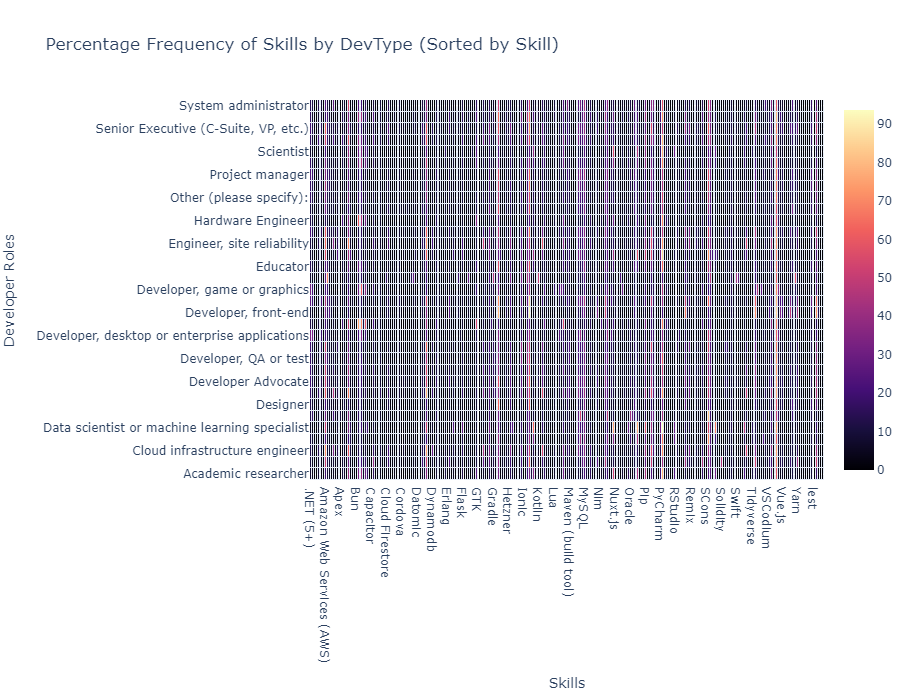

In [ ]:


# Step 1: Calculate the percentage frequency of each skill for each 'DevType'
devtype_skill_freq = processed_data.groupby('DevType').mean() * 100  # Multiply by 100 to get percentages

# Step 2: Sort the columns (skills) alphabetically
devtype_skill_freq = devtype_skill_freq[sorted(devtype_skill_freq.columns)]

# Step 3: Plot the heatmap with sorted skills
fig = go.Figure(data=go.Heatmap(
    z=devtype_skill_freq.values,  # The percentage data as the heatmap values
    x=devtype_skill_freq.columns,  # Sorted skill names (one-hot encoded column names)
    y=devtype_skill_freq.index,  # Developer roles (DevType)
    colorscale='magma',  # Colorscale for the heatmap
    ygap=1,  # Add a gap between rows
    xgap=1   # Add a gap between columns
))

# Step 4: Adjust layout for better visualization
fig.update_layout(
    width=2500,  # Set width for better visibility
    height=700,  # Set height for better visibility
    title="Percentage Frequency of Skills by DevType (Sorted by Skill)",
    xaxis_title="Skills",
    yaxis_title="Developer Roles"
)

# Show the heatmap
fig.show()



<div style="
  background-color: #e3f2fd;
  padding: 12px;
  border-left: 4px solid #0d47a1; 
  border-radius: 6px;
  font-family: 'Georgia', serif;
  color: #0288d1; 
  font-size: 24px; 
  text-align: left;
">
Clustering</div>

In [38]:
skills_ohe = processed_data.drop('DevType', axis=1).copy()
std_skills = StandardScaler().fit_transform(skills_ohe)

In [39]:
tsne_projection = TSNE(n_components=2, 
                       perplexity=3,
                       learning_rate=0.01,
                       init='pca', 
                       method='barnes_hut', 
                       n_jobs=2, 
                       n_iter=10**10,
                       random_state=0).fit_transform(std_skills.T)

tsne_projection = pd.DataFrame(tsne_projection, index=skills_ohe.columns)

In [40]:
tsne_projection.shape

(270, 2)

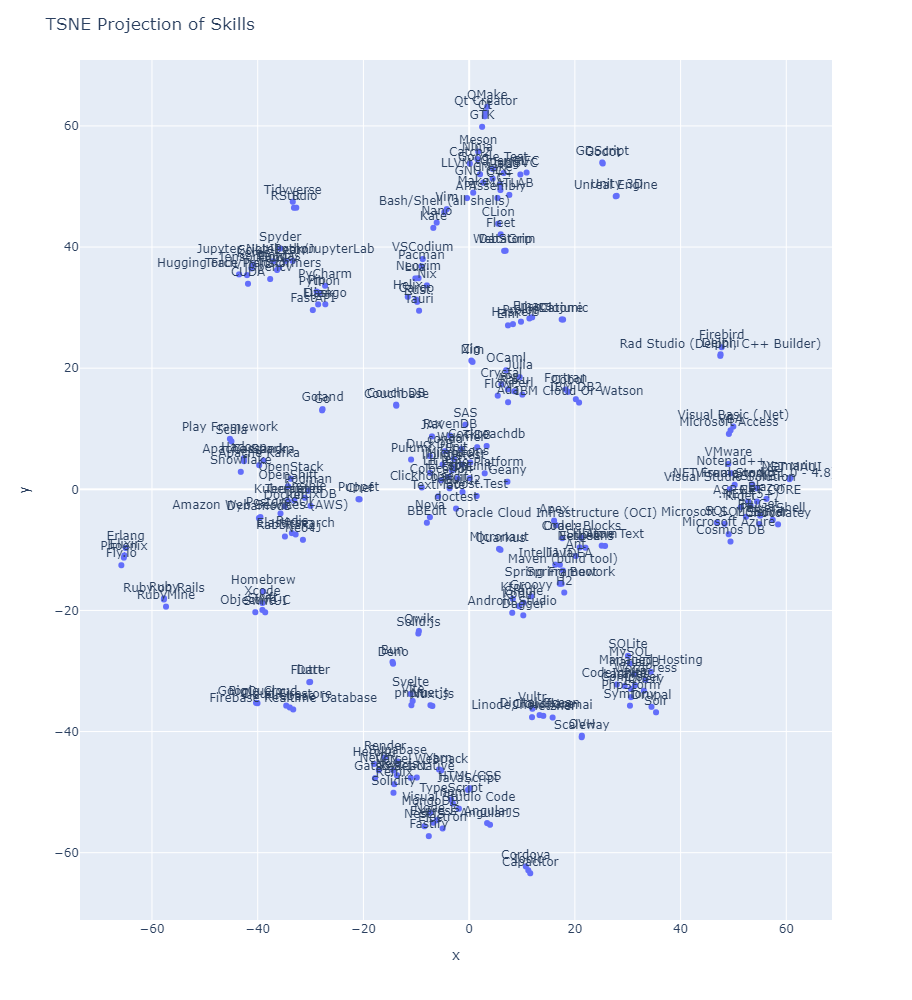

In [22]:
# Plot using plotly
fig = px.scatter(x=tsne_projection[0], y=tsne_projection[1], 
                 text=tsne_projection.index)  # Use index as labels for points
fig.update_traces(textposition='top center')
fig.update_layout(height=1000, width=1000, title_text='TSNE Projection of Skills')
fig.show()

In [41]:
range_n_cluster = list(range(10,25))
silhoutte_score = []
best_cluster_model = None 

for n_clusters in range_n_cluster:
    cluster_model  = AgglomerativeClustering(n_clusters=n_clusters, linkage='ward')
    cluster_labels = cluster_model.fit_predict(tsne_projection)
    
    silhouette_avg = silhouette_score(tsne_projection, cluster_labels)
    silhoutte_score += [silhouette_avg]
    
    if silhouette_avg >= np.max(silhoutte_score):
        best_cluster_model = cluster_model

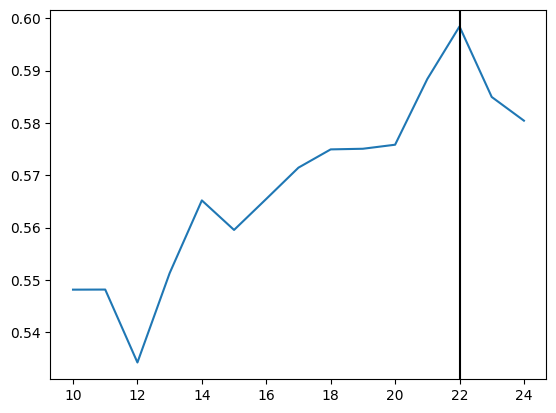

In [42]:
plt.plot(range_n_cluster, silhoutte_score)
plt.axvline(best_cluster_model.n_clusters, color='black')

In [34]:
cluster_labels = ["skills_group_" + str(label) 
                 for label in best_cluster_model.labels_]

c:\Users\public\anaconda3\Lib\site-packages\plotly\express\_core.py:1979: FutureWarning:



When grouping with a length-1 list-like, you will need to pass a length-1 tuple to get_group in a future version of pandas. Pass `(name,)` instead of `name` to silence this warning.




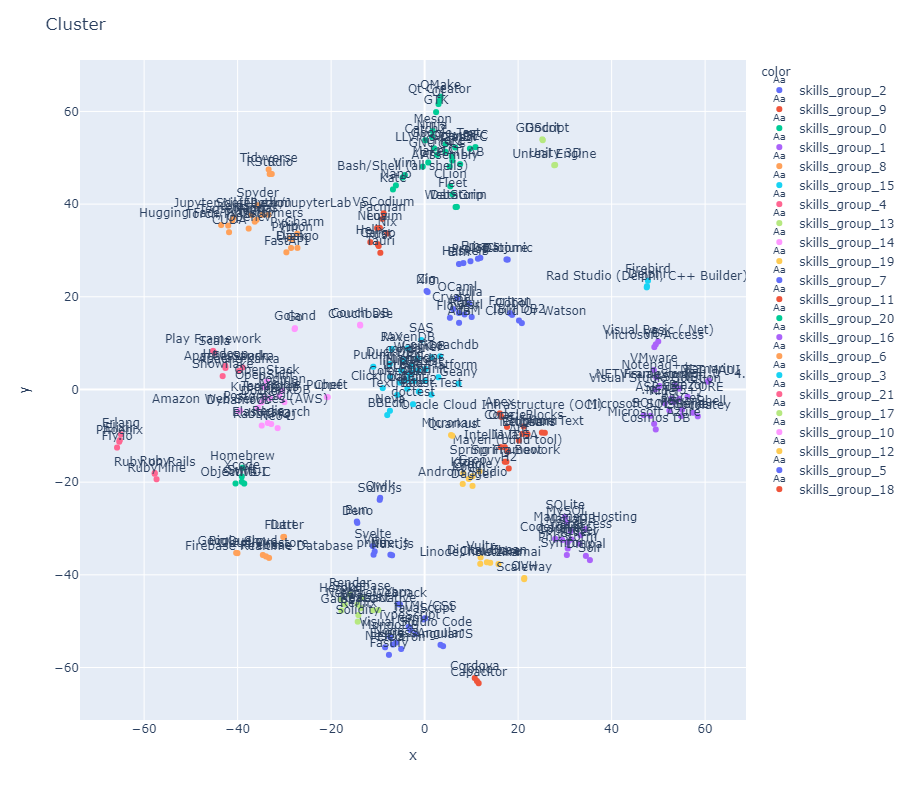

In [25]:
fig = px.scatter(x=tsne_projection[0], 
                 y=tsne_projection[1], 
                 text=tsne_projection.index, 
                 color=cluster_labels)
fig.update_traces(textposition='top center')
fig.update_layout(height=800, width=800, title_text='Cluster')
fig.show()

<div style="
  background-color: #e3f2fd;
  padding: 15px;
  border-left: 6px solid #0d47a1;
  border-radius: 8px;
  font-family: 'Georgia', serif;
  color: #01579b;
  font-size: 28px;
  text-align: center;
  font-weight: bold;
">
  🛠️ Feature Engineering

</div>

In [43]:
skills_clusters = tsne_projection.index.to_series().groupby(cluster_labels).apply(list)

In [44]:
new_features = []

for cluster, skills in skills_clusters.items():
    cluster_sum = skills_ohe[skills].sum(axis=1)
    cluster_sum.name = cluster
    new_features.append(cluster_sum)

fe_clustered_skills = pd.concat(new_features, axis=1)

fe_clustered_skills.head()

,0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19,20,21,22,23
1,0,0,0,0,1,0,7,0,0,0,0,2,0,0,0,7,0,0,0,0,0,1,3,2
2,1,0,1,1,1,0,0,1,0,1,0,0,0,0,0,0,0,1,0,0,0,3,4,0
3,0,0,0,1,3,0,8,1,1,0,0,2,2,0,0,2,2,0,1,0,0,0,2,0
4,0,0,0,0,1,0,11,0,0,0,0,0,0,0,0,6,0,2,0,0,0,0,4,0
5,0,0,0,1,1,0,8,1,0,0,0,1,1,0,0,0,0,3,1,0,0,2,6,0


In [37]:
fe_clustered_skills.shape

(76872, 22)

In [38]:
fe_clustered_skills

,skills_group_0,skills_group_1,skills_group_10,skills_group_11,skills_group_12,skills_group_13,skills_group_14,skills_group_15,skills_group_16,skills_group_17,skills_group_18,skills_group_19,skills_group_2,skills_group_20,skills_group_21,skills_group_3,skills_group_4,skills_group_5,skills_group_6,skills_group_7,skills_group_8,skills_group_9
1,1,0,3,2,0,0,0,7,0,0,0,0,2,0,1,0,0,0,7,0,0,0
2,2,1,4,0,0,0,0,0,0,1,0,0,0,0,3,1,0,0,0,1,0,1
3,3,0,2,2,2,0,0,2,2,0,1,0,0,0,0,1,0,0,8,1,1,0
4,1,0,4,0,0,0,0,6,0,2,0,0,0,0,0,0,0,0,11,0,0,0
5,1,0,6,1,1,0,0,0,0,3,1,0,0,0,2,1,0,0,8,1,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
89178,1,0,3,0,0,0,0,0,0,0,1,1,0,0,0,0,0,0,6,0,2,0
89179,1,0,2,4,0,0,0,2,3,2,0,0,1,0,0,3,0,2,11,1,8,0
89180,0,0,2,0,0,0,0,0,0,0,0,0,5,0,0,1,0,3,0,0,5,0
89182,3,0,5,1,0,0,0,3,4,1,1,0,5,0,1,7,0,0,7,1,3,0


In [45]:
# Exclude rows where 'DevType' is in the EXCLUDE_ROLES list
processed_data = processed_data[~processed_data['DevType'].isin(EXCLUDE_ROLES)]


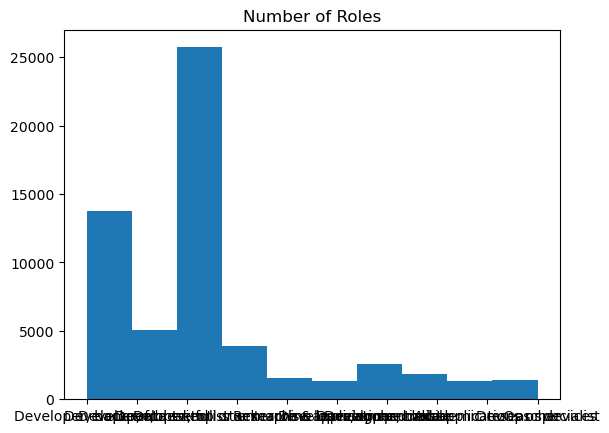

In [27]:
plt.hist(processed_data['DevType'])
plt.title('Number of Roles')
plt.show()

<div style="
  background-color: #e3f2fd;
  padding: 12px;
  border-left: 4px solid #0d47a1; 
  border-radius: 6px;
  font-family: 'Georgia', serif;
  color: #0288d1; 
  font-size: 24px; 
  text-align: left;
">
Fix variance in answers
</div>

In [46]:
# Define the range for the number of skills
TECH_RANGE = [3, 30]

# Calculate the number of skills (sum of one-hot encoded tech columns per row)
num_skills = processed_data.drop(columns=['DevType']).sum(axis=1)

# Create a mask for the rows where the number of skills is within the range
filter_mask = (num_skills >= TECH_RANGE[0]) & (num_skills <= TECH_RANGE[1])

# Apply the mask to filter rows (samples) within the specified range of skills
filtered_processed_data = processed_data.loc[filter_mask].copy()



In [41]:
filtered_processed_data

,DevType,APL,Ada,Apex,Assembly,Bash/Shell (all shells),C,C#,C++,Clojure,Cobol,Crystal,Dart,Delphi,Elixir,Erlang,F#,Flow,Fortran,GDScript,Go,Groovy,HTML/CSS,Haskell,Java,JavaScript,Julia,Kotlin,Lisp,Lua,MATLAB,Nim,OCaml,Objective-C,PHP,Perl,PowerShell,Prolog,Python,R,Raku,Ruby,Rust,SAS,SQL,Scala,Solidity,Swift,TypeScript,VBA,Visual Basic (.Net),Zig,BigQuery,Cassandra,Clickhouse,Cloud Firestore,Cockroachdb,Cosmos DB,Couch DB,Couchbase,Datomic,DuckDB,Dynamodb,Elasticsearch,Firebase Realtime Database,Firebird,H2,IBM DB2,InfluxDB,MariaDB,Microsoft Access,Microsoft SQL Server,MongoDB,MySQL,Neo4J,Oracle,PostgreSQL,RavenDB,Redis,SQLite,Snowflake,Solr,Supabase,TiDB,Amazon Web Services (AWS),Cloudflare,Colocation,Digital Ocean,Firebase,Fly.io,Google Cloud,Heroku,Hetzner,IBM Cloud Or Watson,"Linode, now Akamai",Managed Hosting,Microsoft Azure,Netlify,OVH,OpenShift,OpenStack,Oracle Cloud Infrastructure (OCI),Render,Scaleway,VMware,Vercel,Vultr,ASP.NET,ASP.NET CORE,Angular,AngularJS,Blazor,CodeIgniter,Deno,Django,Drupal,Elm,Express,FastAPI,Fastify,Flask,Gatsby,Laravel,Lit,NestJS,Next.js,Node.js,Nuxt.js,Phoenix,Play Framework,Qwik,React,Remix,Ruby on Rails,Solid.js,Spring Boot,Svelte,Symfony,Vue.js,WordPress,jQuery,.NET (5+),.NET Framework (1.0 - 4.8),.NET MAUI,Apache Kafka,Apache Spark,CUDA,Capacitor,Cordova,Electron,Flutter,GTK,Hadoop,Hugging Face Transformers,Ionic,JAX,Keras,Ktor,MFC,Micronaut,NumPy,OpenGL,Opencv,Pandas,Qt,Quarkus,RabbitMQ,React Native,Scikit-Learn,Spring Framework,SwiftUI,Tauri,TensorFlow,Tidyverse,Torch/PyTorch,Uno Platform,Xamarin,APT,Ansible,Ant,Boost.Test,Bun,CMake,CUTE,Cargo,Catch2,Chef,Chocolatey,Composer,Dagger,Docker,ELFspy,GNU GCC,Godot,Google Test,Gradle,Homebrew,Kubernetes,LLVM's Clang,MSBuild,MSVC,Make,Maven (build tool),Meson,Ninja,Nix,NuGet,Pacman,Pip,Podman,Pulumi,Puppet,QMake,SCons,Terraform,Unity 3D,Unreal Engine,Visual Studio Solution,Vite,Wasmer,Webpack,Yarn,bandit,build2,cppunit,doctest,lest,liblittletest,npm,pnpm,snitch,tunit,Android Studio,Atom,BBEdit,CLion,Code::Blocks,DataGrip,Eclipse,Emacs,Fleet,Geany,Goland,Helix,IPython,IntelliJ IDEA,Jupyter Notebook/JupyterLab,Kate,Micro,Nano,Neovim,Netbeans,Notepad++,Nova,PhpStorm,PyCharm,Qt Creator,RStudio,"Rad Studio (Delphi, C++ Builder)",Rider,RubyMine,Spyder,Sublime Text,TextMate,VSCodium,Vim,Visual Studio,Visual Studio Code,WebStorm,Xcode,condo
2,"Developer, back-end",0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,1,0,0,0,1,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,1,0,0,0,0,0,0,1,0,0,0,1,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
3,"Developer, front-end",0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,1,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,1,0,0,1,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,1,0,0,0,0,0,0,1,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,1,0,1,0,0,0,0,1,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,1,1,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,1,1,0,0
4,"Developer, full-stack",0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,1,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,1,0,0,0,1,0,0,0,0,0,0,0,1,0,0,0,1,0,0,1,0,0,0,0,0,1,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,1,0,0,1,1,1,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,1,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,

In [47]:
filtered_processed_data['DevType'].value_counts()

DevType
Developer, full-stack                            19335
Developer, back-end                              11604
Developer, front-end                              4484
Developer, desktop or enterprise applications     3377
Developer, mobile                                 2290
Developer, embedded applications or devices       1632
Data scientist or machine learning specialist     1286
Academic researcher                               1117
Research & Development role                       1075
DevOps specialist                                 1018
Name: count, dtype: int64

In [36]:
filtered_processed_data['DevType'] = filtered_processed_data['DevType'].replace(devtype_mapping)

filtered_processed_data['DevType'].value_counts()

DevType
Full-stack dev    19335
Back-end dev      11604
Front-end dev      4484
Desktop dev        3377
Mobile dev         2290
Researcher         2192
Embedded dev       1632
Data Scientist     1286
DevOps             1018
Name: count, dtype: int64

In [49]:
# 1. MultiLabelBinarizer for 'DevType' column without splitting
mlb = MultiLabelBinarizer()
# Convert each value in 'DevType' to a list (even if it is a single string)
devtype_encoded = pd.DataFrame(mlb.fit_transform(filtered_processed_data['DevType'].apply(lambda x: [x])),
                               columns=mlb.classes_,
                               index=filtered_processed_data.index)

<div style="
  background-color: #e3f2fd;
  padding: 12px;
  border-left: 4px solid #0d47a1; 
  border-radius: 6px;
  font-family: 'Georgia', serif;
  color: #0288d1; 
  font-size: 24px; 
  text-align: left;
">
2 Level Indexing
</div>

In [50]:
# 2. Define groupings for the columns
groups = ['DevType', 
          'LanguageHaveWorkedWith', 
          'DatabaseHaveWorkedWith', 
          'PlatformHaveWorkedWith', 
          'WebframeHaveWorkedWith', 
          'MiscTechHaveWorkedWith', 
          'ToolsTechHaveWorkedWith', 
          'NEWCollabToolsHaveWorkedWith']

# 3. Combine 'filtered_processed_data' with 'devtype_encoded'
combined_data = pd.concat([devtype_encoded, filtered_processed_data.drop(columns=['DevType'])], axis=1)

# 4. Define the MultiIndex for columns
# Assuming that each column belongs to one of the groups defined above
# Adjust accordingly based on actual column names in the data

group_map = {}

# DevType group
for col in devtype_encoded.columns:
    group_map[col] = 'DevType'

# Assigning other groups
for col in ['LanguageHaveWorkedWith', 'DatabaseHaveWorkedWith', 'PlatformHaveWorkedWith', 
            'WebframeHaveWorkedWith', 'MiscTechHaveWorkedWith', 'ToolsTechHaveWorkedWith', 
            'NEWCollabToolsHaveWorkedWith']:
    if col in data.columns:
        group_map[col] = col

# Set the MultiIndex
combined_data.columns = pd.MultiIndex.from_tuples([(group_map.get(col, 'Skills'), col) for col in combined_data.columns])

# Display the data with MultiIndex
combined_data.head()

DevType                                                \
  Academic researcher Data scientist or machine learning specialist   
2                   0                                             0   
3                   0                                             0   
4                   0                                             0   
5                   0                                             0   
9                   0                                             0   

                                         \
  DevOps specialist Developer, back-end   
2                 0                   1   
3                 0                   0   
4                 0                   0   
5                 0                   1   
9                 0                   0   

                                                 \
  Developer, desktop or enterprise applications   
2                                             0   
3                                             0   
4                                             0   
5                                             0   
9                                             0   

                                                                    \
  Developer, embedded applications or devices Developer, front-end   
2                                           0                    0   
3                                           0                    1   
4                                           0                    0   
5                                           0                    0   
9                                           0                    0   

                                                                      Skills  \
  Developer, full-stack Developer, mobile Research & Development role    APL   
2                     0                 0                           0      0   
3                     0                 0                           0      0   
4                     1                 0                           0      0   
5                     0                 0                           0      0   
9                     1                 0                           0      0   

                                                                             \
  Ada Apex Assembly Bash/Shell (all shells)  C C# C++ Clojure Cobol Crystal   
2   0    0        0                       1  0  0   0       0     0       0   
3   0    0        0                       1  0  0   0       0     0       0   
4   0    0        0                       0  0  0   0       0     0       0   
5   0    0        0                       1  0  0   0       0     0       0   
9   0    0        0                       0  0  0   0       0     0       0   

                                                                         \
  Dart Delphi Elixir Erlang F# Flow Fortran GDScript Go Groovy HTML/CSS   
2    0      0      0      0  0    0       0        0  1      0        0   
3    0      0      0      0  0    0       0        0  0      0        1   
4    0      0      0      0  0    0       0        0  0      0        1   
5    0      0      0      0  0    0       0        0  0      0        1   
9    0      0      0      0  0    0       0        0  0      0        1   

                                                                              \
  Haskell Java JavaScript Julia Kotlin Lisp Lua MATLAB Nim OCaml Objective-C   
2       0    0          0     0      0    0   0      0   0     0           0   
3       0    0          1     0      0    0   0      0   0     0           0   
4       0    0          1     0      0    0   0      0   0     0           0   
5       0    0          1     0      0    0   0      0   0     0           0   
9       0    1          1     0      0    0   0      0   0     0           0   

                                                                              \
  PHP Perl PowerShell Prolog Python  R Raku Ruby Rust SAS SQL Scala Solidity   
2  

In [35]:
combined_data["DevType"].sum(axis=0)

Back-end dev      11604
Data Scientist     1286
Desktop dev        3377
DevOps             1018
Embedded dev       1632
Front-end dev      4484
Full-stack dev    19335
Mobile dev         2290
Researcher         2192
dtype: int64

In [51]:
combined_data["Skills"].sum(axis=0)

APL                           27
Ada                          234
Apex                         247
Assembly                    1119
Bash/Shell (all shells)    12549
                           ...  
Visual Studio              11932
Visual Studio Code         33338
WebStorm                    2664
Xcode                       3520
condo                         24
Length: 270, dtype: int64

In [56]:
combined_data.shape

(47218, 279)

In [51]:
fe_clustered_skills.columns = pd.MultiIndex.from_product([['skills_clusters'], 
                                                  fe_clustered_skills.columns])

In [52]:
final_data = pd.concat([combined_data, fe_clustered_skills], axis=1, join='inner')


In [39]:
final_data

DevType                                                 \
      Back-end dev Data Scientist Desktop dev DevOps Embedded dev   
2                1              0           0      0            0   
3                0              0           0      0            0   
4                0              0           0      0            0   
5                1              0           0      0            0   
9                0              0           0      0            0   
...            ...            ...         ...    ...          ...   
89173            0              0           0      0            0   
89175            0              0           0      0            0   
89178            0              0           0      0            0   
89180            1              0           0      0            0   
89183            0              0           0      0            0   

                                                         Skills           \
      Front-end dev Full-stack dev Mobile dev Researcher    APL Ada Apex   
2                 0              0          0          0      0   0    0   
3                 1              0          0          0      0   0    0   
4                 0              1          0          0      0   0    0   
5                 0              0          0          0      0   0    0   
9                 0              1          0          0      0   0    0   
...             ...            ...        ...        ...    ...  ..  ...   
89173             0              1          0          0      0   0    0   
89175             0              0          1          0      0   0    0   
89178             0              1          0          0      0   0    0   
89180             0              0          0          0      0   0    0   
89183             0              1          0          0      0   0    0   

                                                                             \
      Assembly Bash/Shell (all shells)  C C# C++ Clojure Cobol Crystal Dart   
2            0                       1  0  0   0       0     0       0    0   
3            0                       1  0  0   0       0     0       0    0   
4            0                       0  0  0   0       0     0       0    0   
5            0                       1  0  0   0       0     0       0    0   
9            0                       0  0  0   0       0     0       0    0   
...        ...                     ... .. ..  ..     ...   ...     ...  ...   
89173        0                       0  0  1   0       0     0       0    0   
89175        0                       0  0  0   0       0     0       0    0   
89178        0                       0  0  0   0       0     0       0    0   
89180        0                       0  0  0   0       0     0       0    1   
89183        0                       0  0  1   0       0     0       0    0   

                                                                        \
      Delphi Elixir Erlang F# Flow Fortran GDScript Go Groovy HTML/CSS   
2          0      0      0  0    0       0        0  1      0        0   
3          0      0      0  0    0       0        0  0      0        1   
4          0      0      0  0    0       0        0  0      0        1   
5          0      0      0  0    0       0        0  0      0        1   
9          0      0      0  0    0       0        0  0      0        1   
...      ...    ...    ... ..  ...     ...      ... ..    ...      ...   
89173      0      0      0  0    0       0        0  0      0        1   
89175      0      0      0  0    0       0        0  0      0        0   
89178      0      0      0  0    0       0        0  0      0        0   
89180      0      0      0  0    0       0        0  0      0        0   
89183      0      0      0  0    0       0        0  1      0        0   

                                                                      \
      Haskell Java JavaScript Julia Kotlin Lisp Lua MATLAB Ni

In [ ]:
temp_df = final_data[final_data['DevType']['Researcher'] !=1]
temp_df = temp_df.drop(columns=[('DevType', 'Researcher')])
final_data = temp_df

In [53]:
roles_data = final_data['DevType'].copy()

roles_data.sum(axis=0)

Academic researcher                               1117
Data scientist or machine learning specialist     1286
DevOps specialist                                 1018
Developer, back-end                              11604
Developer, desktop or enterprise applications     3377
Developer, embedded applications or devices       1632
Developer, front-end                              4484
Developer, full-stack                            19335
Developer, mobile                                 2290
Research & Development role                       1075
dtype: int64

<div style="
  background-color: #e3f2fd;
  padding: 15px;
  border-left: 6px solid #0d47a1;
  border-radius: 8px;
  font-family: 'Georgia', serif;
  color: #01579b;
  font-size: 28px;
  text-align: center;
  font-weight: bold;
">
  ✂️ Splitting The Data

</div>


In [ ]:
df_train, df_test = train_test_split(final_data, random_state=0)

In [ ]:
roles_data = df_train['DevType'].copy()

<div style="
  background-color: #e3f2fd;
  padding: 12px;
  border-left: 4px solid #0d47a1; 
  border-radius: 6px;
  font-family: 'Georgia', serif;
  color: #0288d1; 
  font-size: 24px; 
  text-align: left;
">
  Fix Balancing In The Data
</div>

In [54]:
samples_per_class = 2200
resampled_roles = []

for role_col in roles_data.columns:
    sub_df = roles_data.loc[roles_data[role_col] == 1].copy()
    
    if len(sub_df) < samples_per_class:
        # Upsample
        sub_df = sub_df.sample(samples_per_class, replace=True, random_state=0)
    else:
        # Downsample
        sub_df = sub_df.sample(samples_per_class, random_state=0) 
    
    resampled_roles.append(sub_df)

In [55]:
roles_df  = pd.concat(resampled_roles)
df_train=df_train.loc[roles_df.index].copy()

In [ ]:
df_train['DevType'].sum(axis=0)

Back-end dev      2200
Data Scientist    2200
Desktop dev       2200
DevOps            2200
Embedded dev      2200
Front-end dev     2200
Full-stack dev    2200
Mobile dev        2200
dtype: int64

In [48]:
df_train.head()

DevType                                                 \
      Back-end dev Data Scientist Desktop dev DevOps Embedded dev   
52115            1              0           0      0            0   
50574            1              0           0      0            0   
68360            1              0           0      0            0   
4077             1              0           0      0            0   
48633            1              0           0      0            0   

                                                         Skills           \
      Front-end dev Full-stack dev Mobile dev Researcher    APL Ada Apex   
52115             0              0          0          0      0   0    0   
50574             0              0          0          0      0   0    0   
68360             0              0          0          0      0   0    0   
4077              0              0          0          0      0   0    0   
48633             0              0          0          0      0   0    0   

                                                                             \
      Assembly Bash/Shell (all shells)  C C# C++ Clojure Cobol Crystal Dart   
52115        0                       1  1  0   0       0     0       0    0   
50574        0                       0  0  0   0       0     0       0    0   
68360        0                       1  0  0   0       0     0       0    0   
4077         0                       0  0  0   0       0     0       0    0   
48633        0                       0  0  0   0       0     0       0    0   

                                                                        \
      Delphi Elixir Erlang F# Flow Fortran GDScript Go Groovy HTML/CSS   
52115      0      0      0  0    0       0        0  0      0        0   
50574      0      0      0  0    0       0        0  0      0        0   
68360      0      0      0  0    0       0        0  0      0        1   
4077       0      0      0  0    0       0        0  1      0        0   
48633      0      0      0  0    0       0        0  0      0        0   

                                                                      \
      Haskell Java JavaScript Julia Kotlin Lisp Lua MATLAB Nim OCaml   
52115       0    1          0     0      0    0   0      0   0     0   
50574       0    0          0     0      0    0   0      0   0     0   
68360       0    0          1     0      0    0   0      0   0     0   
4077        0    0          1     0      0    0   0      0   0     0   
48633       0    1          1     0      0    0   0      0   0     0   

                                                                               \
      Objective-C PHP Perl PowerShell Prolog Python  R Raku Ruby Rust SAS SQL   
52115           0   0    0          0      0      1  0    0    0    1   0   0   
50574           0   0    0          0      0      1  0    0    0    0   0   0   
68360           0   0    0          0      0      1  0    0    0    0   0   0   
4077            0   1    0          0      0      0  0    0    0    0   0   0   
48633           0   0    0          0      0      1  0    0    0    0   0   0   

                                                                            \
      Scala Solidity Swift TypeScript VBA Visual Basic (.Net) Zig BigQuery   
52115     0        0     0          0   0                   0   0        0   
50574     1        0     0          1   0                   0   0        0   
68360     0        0     0          1   0                   0   0        0   
4077      0        0     0          0   0                   0   0        0   
48633     0        0     0          1   0                   0   0        0   

                                                                           \
      Cassandra Clickhouse Cloud Firestore Cockroachdb Cosmos DB Couch DB   
52115         1          0               0           0         0        0   
50574         0          0               0           0         0      

In [56]:
X_train,Y_train = df_train.drop("DevType", axis=1), df_train["DevType"]
X_test,Y_test = df_test.drop("DevType", axis=1), df_test["DevType"]

<div style="
  background-color: #e3f2fd;
  padding: 15px;
  border-left: 6px solid #0d47a1;
  border-radius: 8px;
  font-family: 'Georgia', serif;
  color: #01579b;
  font-size: 28px;
  text-align: center;
  font-weight: bold;
">
  🧠 Modeling

</div>


In [44]:
clf = make_pipeline(StandardScaler(),
                    MultiOutputClassifier(LogisticRegression()))

clf.fit(X_train.values, Y_train.values)
predictions =  pd.DataFrame(clf.predict(X_train.values),
                            columns=Y_train.columns)

In [45]:
train_scores , test_scores = evaluate_model(clf,X_train, Y_train, X_test,Y_test)

======Train Scores======

accuracy_score     92.982222

precision_score    74.688889

recall_score       52.277778

f1_score           59.955556

dtype: float64



                accuracy_score  precision_score  recall_score  f1_score

Back-end dev             90.86            69.54         33.00     44.76

Data Scientist           95.40            82.00         75.15     78.43

Desktop dev              91.12            69.67         37.60     48.84

DevOps                   93.73            78.68         59.98     68.07

Embedded dev             93.25            74.82         60.42     66.85

Front-end dev            94.66            79.77         69.49     74.27

Full-stack dev           89.70            57.22         21.95     31.73

Mobile dev               97.77            91.50         87.41     89.41

Researcher               90.35            69.00         25.50     37.24



======Test Scores======

accuracy_score     92.063333

precision_score    66.763333

recall_score       

In [46]:
train_scores.sort_values('precision_score', ascending= False)

,accuracy_score,precision_score,recall_score,f1_score
Mobile dev,97.77,91.50,87.41,89.41
Data Scientist,95.40,82.00,75.15,78.43
Front-end dev,94.66,79.77,69.49,74.27
DevOps,93.73,78.68,59.98,68.07
Embedded dev,93.25,74.82,60.42,66.85
Desktop dev,91.12,69.67,37.60,48.84
Back-end dev,90.86,69.54,33.00,44.76
Researcher,90.35,69.00,25.50,37.24
Full-stack dev,89.70,57.22,21.95,31.73


In [47]:
test_scores.sort_values('precision_score', ascending= False)

,accuracy_score,precision_score,recall_score,f1_score
Mobile dev,96.11,84.44,83.52,83.98
Data Scientist,95.07,81.08,72.51,76.56
Front-end dev,93.46,72.91,65.66,69.10
DevOps,92.96,72.18,58.54,64.65
Embedded dev,92.62,69.02,55.52,61.54
Desktop dev,90.78,61.41,35.65,45.11
Researcher,90.04,60.91,20.87,31.09
Back-end dev,90.24,59.06,31.37,40.97
Full-stack dev,87.29,39.86,16.29,23.12


In [51]:
#Base Models with standard scaler

scalers = {
    'StandardScaler': StandardScaler(),
}
models = {
    'Decision Tree': (DecisionTreeClassifier(random_state=42), {}),
    'Logistic Regression': (LogisticRegression(random_state=42), {}),
    'SVM': (SVC(random_state=42,probability=True), {}),
    'KNN': (KNeighborsClassifier(), {}),
    'Naive Bayes': (GaussianNB(), {}),
    'AdaBoost': (AdaBoostClassifier(random_state=42), {}),
    'Gradient Boosting': (GradientBoostingClassifier(random_state=42), {}),
    'XGBoost': (xgb.XGBClassifier(random_state=42), {}),
    'Random Forest': (RandomForestClassifier(random_state=42), {}),
}


results_random_search = perform_randomized_search(X_train, Y_train, X_test, Y_test, scalers, models, save_model=False)

Training with StandardScaler and Decision Tree

Best parameters for StandardScaler with Decision Tree: {}

Best score: 0.37224481450774866

======Train Scores======

accuracy_score     99.991111

precision_score    99.966667

recall_score       99.944444

f1_score           99.955556

dtype: float64



                accuracy_score  precision_score  recall_score  f1_score

Back-end dev            100.00            100.0         100.0    100.00

Data Scientist           99.99            100.0          99.9     99.95

Desktop dev              99.97             99.7         100.0     99.85

DevOps                  100.00            100.0         100.0    100.00

Embedded dev             99.99            100.0          99.9     99.95

Front-end dev            99.99            100.0          99.9     99.95

Full-stack dev           99.99            100.0          99.9     99.95

Mobile dev              100.00            100.0         100.0    100.00

Researcher               99.99         

In [52]:

for result in results_random_search:
    model_name = result['model']
    model = models[model_name][0]
    best_params = result['best_params']
    
    pipeline = Pipeline([
        ('scaler', scalers['StandardScaler']),
        ('classifier', MultiOutputClassifier(model))
    ])
    
    pipeline.fit(X_train, Y_train)
    y_pred_proba = pipeline.predict_proba(X_test)
    
    roc_data = {}
    for i, col in enumerate(Y_test.columns):
        fpr, tpr, _ = roc_curve(Y_test[col], y_pred_proba[i][:, 1])
        roc_data[col] = (fpr, tpr)
    
    result['roc_data'] = roc_data


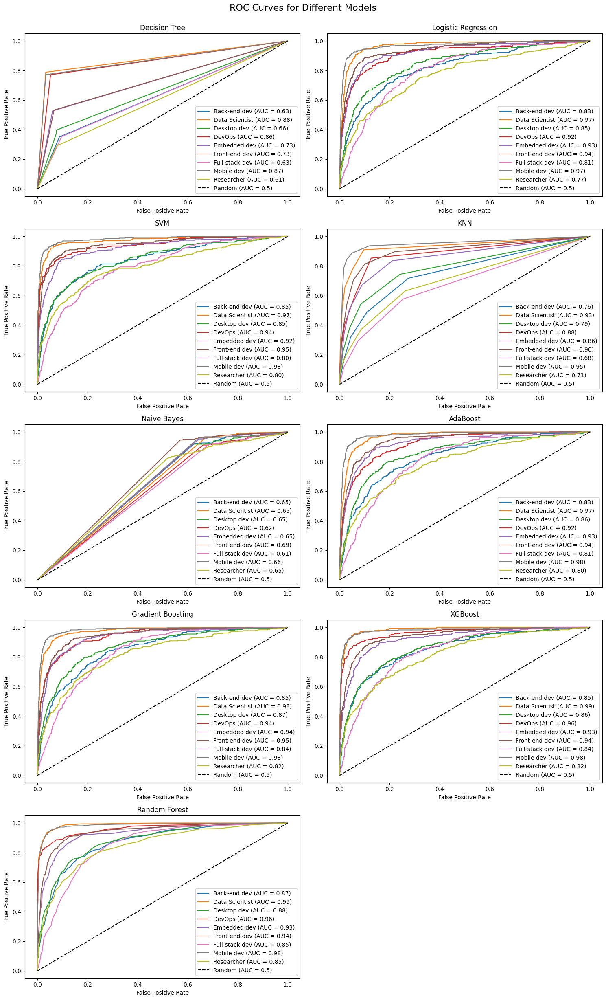

In [53]:
plot_roc_for_each_model(results_random_search,"ROC Curves for Different Models")

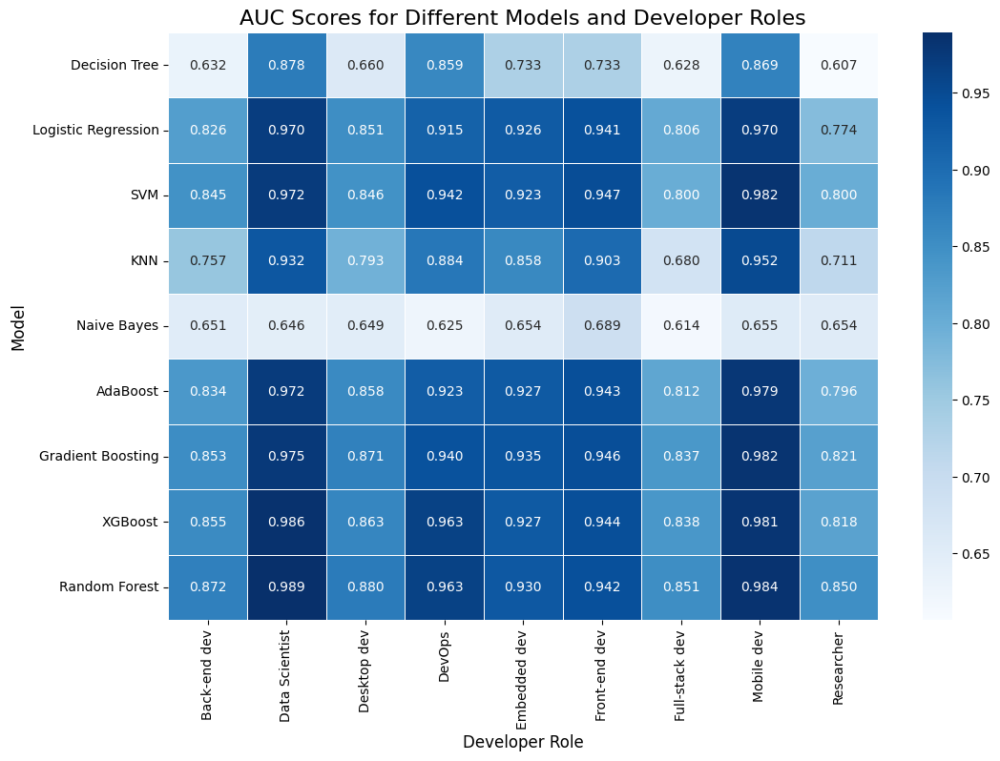

In [62]:
all_auc_scores = {}
for result in results_random_search:
    model_name = result['model']
    roc_data = result['roc_data']
    model_auc_scores = {}
    for role, (fpr, tpr) in roc_data.items():
        model_auc_scores[role] = auc(fpr, tpr)
    all_auc_scores[model_name] = model_auc_scores

auc_scores_df = pd.DataFrame(all_auc_scores).T

plt.figure(figsize=(12, 8))
sns.heatmap(auc_scores_df, annot=True, cmap="Blues", fmt=".3f", linewidths=0.5)
plt.title('AUC Scores for Different Models and Developer Roles', fontsize=16)
plt.xlabel('Developer Role', fontsize=12)
plt.ylabel('Model', fontsize=12)
plt.show()


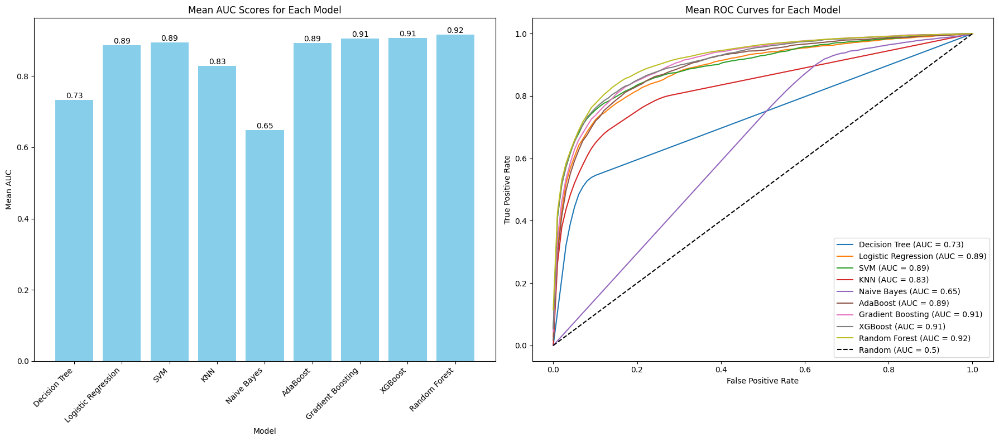

In [63]:
mean_auc_df = plot_mean_roc_auc(results_random_search)


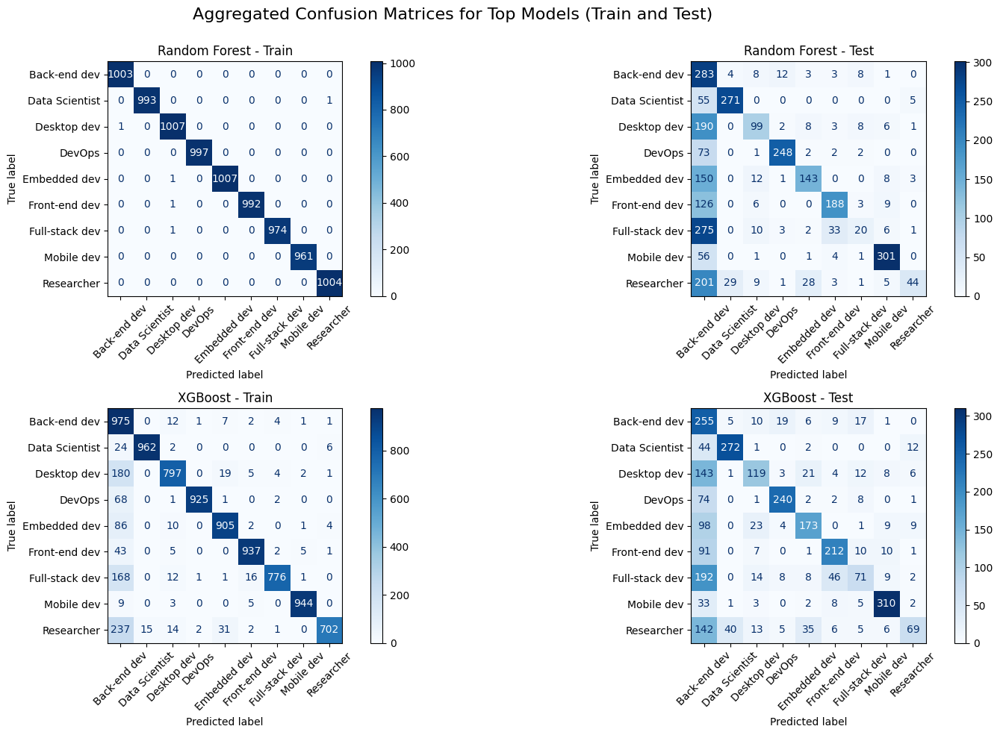

In [68]:
plot_confusion_matrix(mean_auc_df,X_train,X_test,Y_train,Y_test,n_top=2)


In [70]:
scaler = StandardScaler()
X_train_scaled = pd.DataFrame(scaler.fit_transform(X_train))
X_test_scaled = pd.DataFrame(scaler.transform(X_test))


vote = MultiOutputClassifier(VotingClassifier(estimators=[('rf', RandomForestClassifier(random_state=42)),('xgb',xgb.XGBClassifier(random_state=42)),], voting='soft', n_jobs=-1))
stack = MultiOutputClassifier(StackingClassifier(estimators=[('rf', RandomForestClassifier(random_state=42)),('xgb',xgb.XGBClassifier(random_state=42))], final_estimator=LogisticRegression(), n_jobs=-1))

vote.fit(X_train_scaled, Y_train)
stack.fit(X_train_scaled, Y_train)


evaluate_model(vote, X_train_scaled, Y_train, X_test_scaled, Y_test)
evaluate_model(stack, X_train_scaled, Y_train, X_test_scaled, Y_test)

======Train Scores======

accuracy_score     99.190000

precision_score    99.304444

recall_score       93.402222

f1_score           96.201111

dtype: float64



                accuracy_score  precision_score  recall_score  f1_score

Back-end dev             98.67           100.00         88.14     93.69

Data Scientist           99.82            99.70         98.69     99.19

Desktop dev              98.47            97.60         88.59     92.88

DevOps                   99.69            99.90         97.29     98.58

Embedded dev             99.30            98.76         94.94     96.81

Front-end dev            99.52            98.87         96.78     97.81

Full-stack dev           98.99           100.00         90.77     95.16

Mobile dev               99.85            99.48         99.17     99.32

Researcher               98.40            99.43         86.25     92.37



======Test Scores======

accuracy_score     93.016667

precision_score    74.726667

recall_score       

In [ ]:
results= []
results.append(
    {
        'model': 'Voting Classifier',
        'scaler': 'StandardScaler',
    }
    {
        'model': 'Stacking Classifier',
        'scaler': 'StandardScaler',
    }
)

models = {
    'Voting Classifier': ((VotingClassifier(estimators=[('rf', RandomForestClassifier(random_state=42)),('xgb',xgb.XGBClassifier(random_state=42)),], voting='soft', n_jobs=-1)),{}),
    'Stacking Classifier': ((StackingClassifier(estimators=[('rf', RandomForestClassifier(random_state=42)),('xgb',xgb.XGBClassifier(random_state=42))], final_estimator=LogisticRegression(), n_jobs=-1)),{})
}



In [ ]:

for result in results:
    model_name = result['model']
    model = models[model_name][0]
    scaler_name = result.get('scaler', 'StandardScaler')
    scaler = scalers[scaler_name]
    
    pipeline = Pipeline([
        ('scaler', scaler),
        ('classifier', MultiOutputClassifier(model))
    ])
    
    pipeline.fit(X_train, Y_train)
    y_pred_proba = pipeline.predict_proba(X_test)
    
    roc_data = {}
    for i, col in enumerate(Y_test.columns):
        fpr, tpr, _ = roc_curve(Y_test[col], y_pred_proba[i][:, 1])
        roc_data[col] = (fpr, tpr)
    
    result['roc_data'] = roc_data


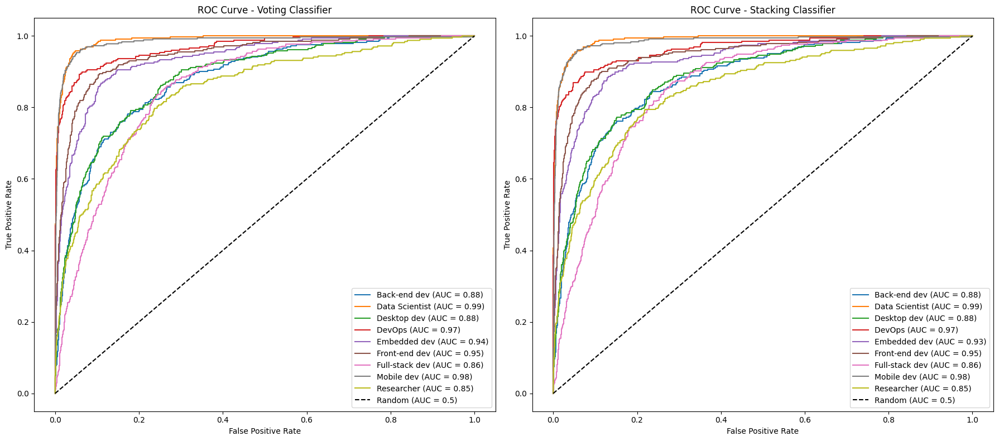

In [75]:
plot_roc_for_each_model(results,"ROC Curves for Different Models")

In [ ]:
all_auc_scores = {}
for result in results:
    model_name = result['model']
    roc_data = result['roc_data']
    model_auc_scores = {}
    for role, (fpr, tpr) in roc_data.items():
        model_auc_scores[role] = auc(fpr, tpr)
    all_auc_scores[model_name] = model_auc_scores

auc_scores_df = pd.DataFrame(all_auc_scores).T

plt.figure(figsize=(12, 8))
sns.heatmap(auc_scores_df, annot=True, cmap="Blues", fmt=".3f", linewidths=0.5)
plt.title('AUC Scores for Different Models and Developer Roles', fontsize=16)
plt.xlabel('Developer Role', fontsize=12)
plt.ylabel('Model', fontsize=12)
plt.show()


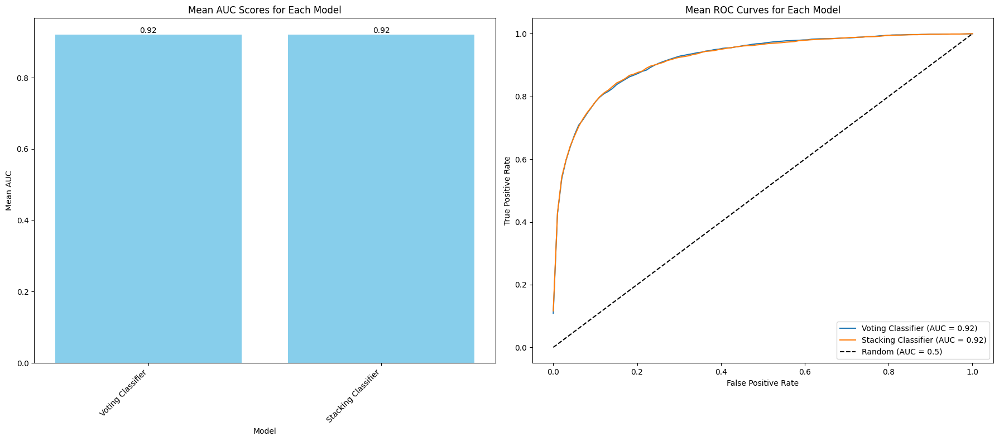

In [78]:
mean_auc_df = plot_mean_roc_auc(results)

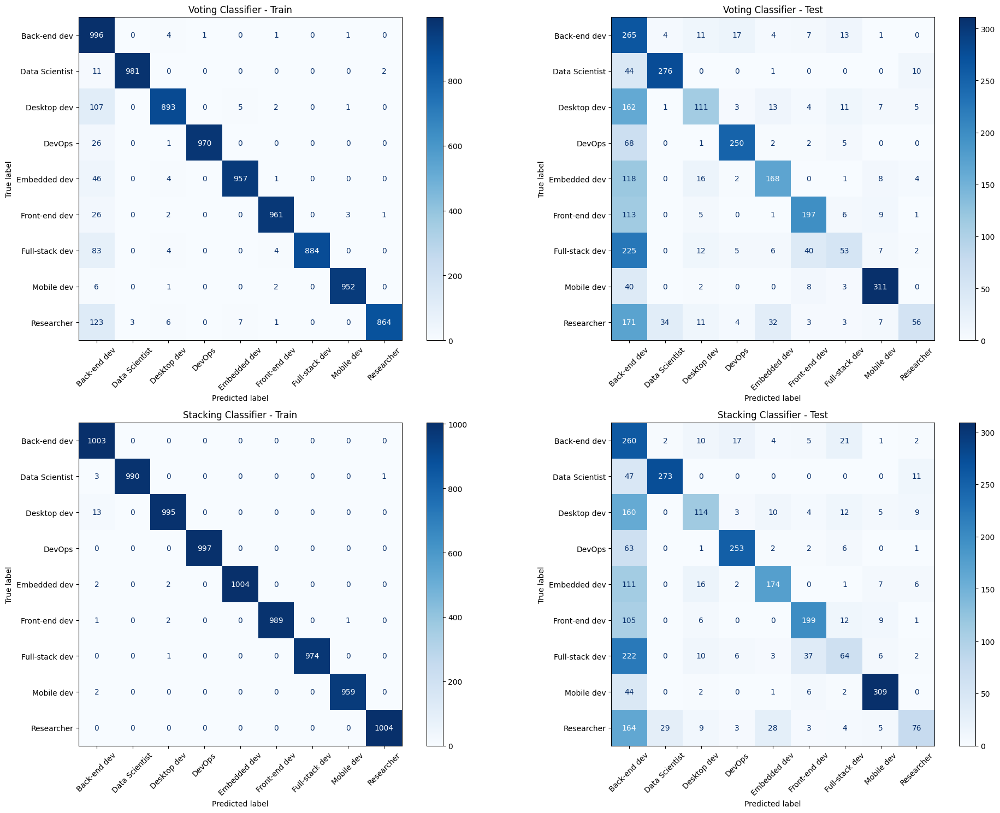

In [ ]:
plot_confusion_matrix(mean_auc_df,X_train,X_test,Y_train,Y_test,n_top=2)

<div style="
  background-color: #e3f2fd;
  padding: 12px;
  border-left: 4px solid #0d47a1; 
  border-radius: 6px;
  font-family: 'Georgia', serif;
  color: #0288d1; 
  font-size: 24px; 
  text-align: left;
">
  Hyperparameters Tuning
</div>



In [165]:
scalers = {
    'StandardScaler': StandardScaler(),
    'MinMaxScaler': MinMaxScaler(),
    'RobustScaler': RobustScaler()
}

models = {
    'Random Forest': (
        RandomForestClassifier(random_state=42, n_jobs=-1,bootstrap=False),
        {
            'classifier__estimator__n_estimators': [100, 200, 300],
            'classifier__estimator__max_depth': [10, 20, 30],
            'classifier__estimator__min_samples_split': [1, 2, 5],
            'classifier__estimator__max_features': ['sqrt', 'log2']
        }
    ),
    'Gradient Boosting': (
        GradientBoostingClassifier(random_state=42, n_iter_no_change=10),
        {
            'classifier__estimator__n_estimators': [100, 200],
            'classifier__estimator__learning_rate': [0.01, 0.1, 0.001],
            'classifier__estimator__max_depth': [3, 5, 7],
            'classifier__estimator__subsample': [0.8, 1.0]
        }
    ),
    'XGBoost': (
        xgb.XGBClassifier(random_state=42, n_jobs=-1),
        {
            'classifier__estimator__n_estimators': [100, 200],
            'classifier__estimator__learning_rate': [0.01, 0.1, 0.001],
            'classifier__estimator__reg_alpha': [0, 0.1, 0.5],
            'classifier__estimator__reg_lambda': [1, 2, 3],
            'classifier__estimator__max_depth': [3, 5, 7],
            'classifier__estimator__subsample': [0.7, 0.8, 1.0],
            'classifier__estimator__colsample_bytree': [0.7, 1.0]
        }
    ),
    'Logistic Regression': (
        LogisticRegression(random_state=42, n_jobs=-1),
        {
            'classifier__estimator__C': [0.1, 0.5, 1, 10],
            'classifier__estimator__penalty': ['l1', 'l2'],
            'classifier__estimator__solver': ['liblinear','lbfgs']
        }
    )
}


results_grid_search = perform_grid_search(X_train, Y_train, X_test, Y_test, scalers, models, scoring = 'roc_auc',save_model=True)

In [163]:
for result in results_grid_search:
    model_name = result['model']
    model = models[model_name][0]
    best_params = result['best_params']
    scaler_name = result.get('scaler', 'StandardScaler')
    scaler = scalers[scaler_name]
    
    pipeline = Pipeline([
        ('scaler', scaler),
        ('classifier', MultiOutputClassifier(model.set_params(**{k.split('__')[-1]: v for k, v in best_params.items() if 'classifier' in k})))
    ])
    
    pipeline.fit(X_train, Y_train)
    y_pred_proba = pipeline.predict_proba(X_test)
    
    roc_data = {}
    for i, col in enumerate(Y_test.columns):
        fpr, tpr, _ = roc_curve(Y_test[col], y_pred_proba[i][:, 1])
        roc_data[col] = (fpr, tpr)
    
    result['roc_data'] = roc_data


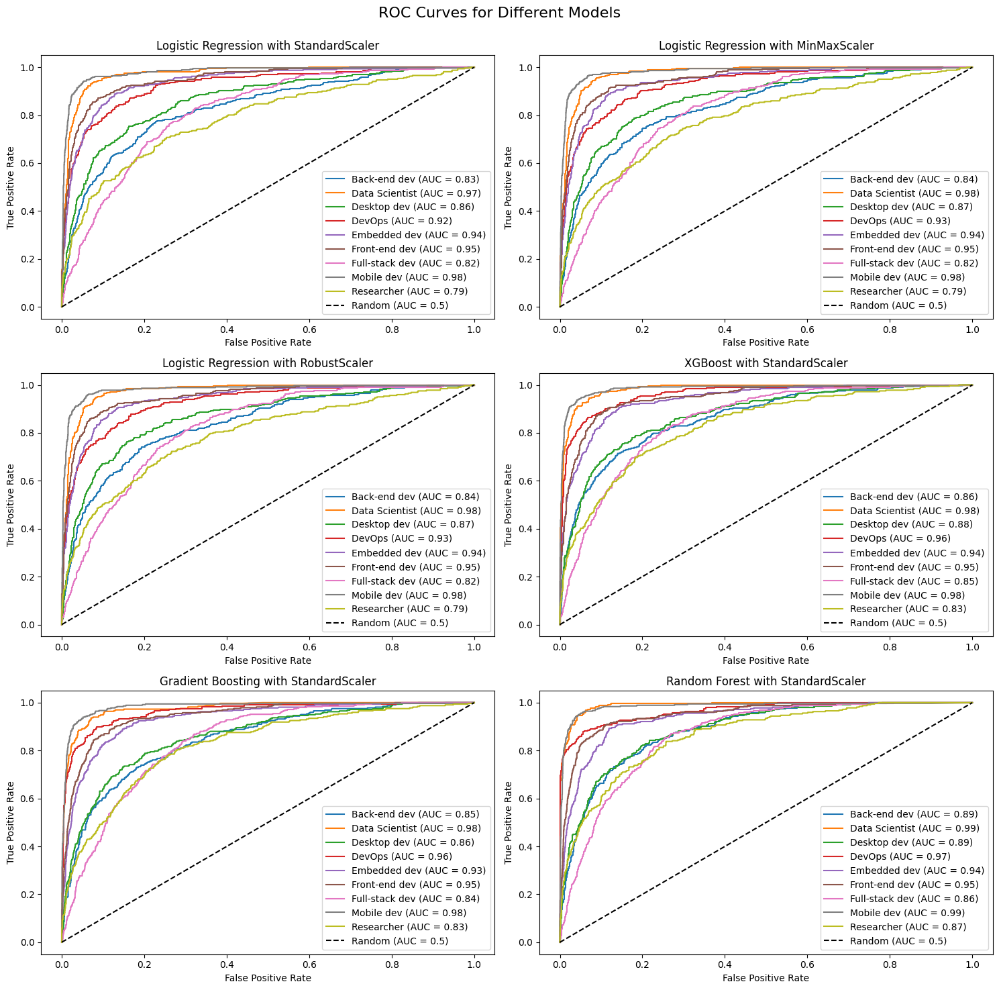

In [166]:
plot_roc_for_each_model(results_grid_search,"ROC Curves for Different Models")

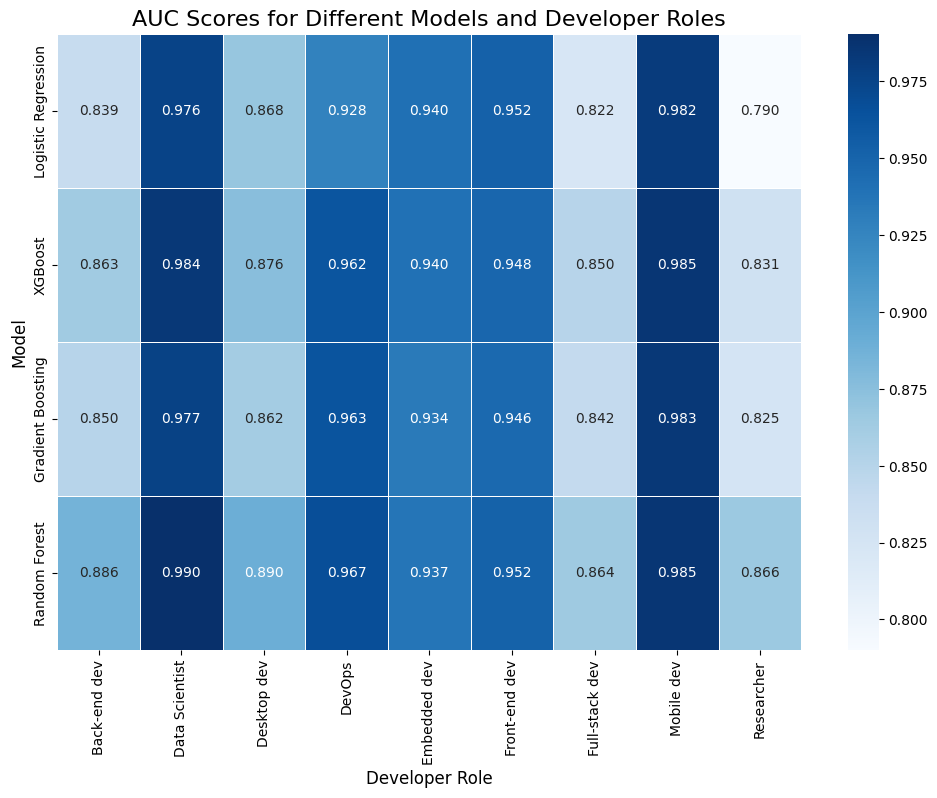

In [167]:
all_auc_scores = {}
for result in results_grid_search:
    model_name = result['model']
    roc_data = result['roc_data']
    model_auc_scores = {}
    for role, (fpr, tpr) in roc_data.items():
        model_auc_scores[role] = auc(fpr, tpr)
    all_auc_scores[model_name] = model_auc_scores

auc_scores_df = pd.DataFrame(all_auc_scores).T

plt.figure(figsize=(12, 8))
sns.heatmap(auc_scores_df, annot=True, cmap="Blues", fmt=".3f", linewidths=0.5)
plt.title('AUC Scores for Different Models and Developer Roles', fontsize=16)
plt.xlabel('Developer Role', fontsize=12)
plt.ylabel('Model', fontsize=12)
plt.show()


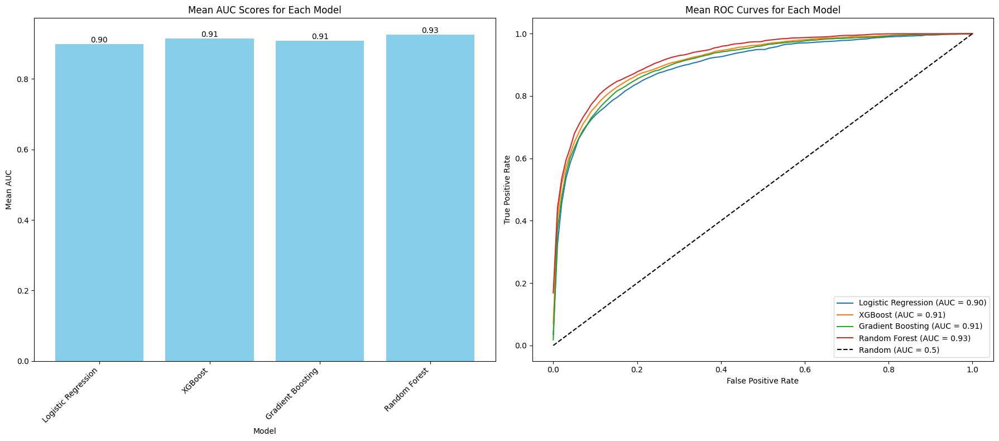

In [168]:
mean_auc_df = plot_mean_roc_auc(results_grid_search)


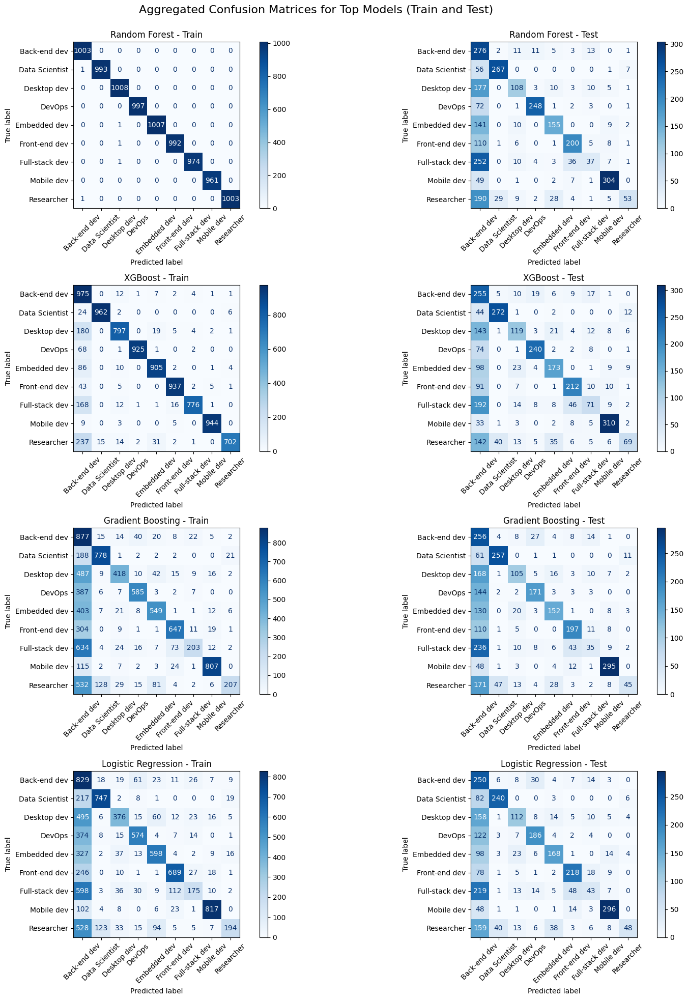

In [169]:
plot_confusion_matrix(mean_auc_df,X_train,X_test,Y_train,Y_test,n_top=4)


In [180]:
with open('best_model_StandardScaler_XGBoost_0.9120819551241122_grid.pkl', 'rb') as f:
    pipeline1 = pickle.load(f)
    model1 = pipeline1.named_steps['classifier'].estimator 

with open('best_model_StandardScaler_Random Forest_0.9208327923116654_grid.pkl', 'rb') as f:
    pipeline2 = pickle.load(f)
    model2 = pipeline2.named_steps['classifier'].estimator 

with open('best_model_StandardScaler_Gradient Boosting_0.9050763464502237_grid.pkl', 'rb') as f:
    pipeline3 = pickle.load(f)
    model3 = pipeline3.named_steps['classifier'].estimator

with open('best_model_RobustScaler_Logistic Regression_0.9006292532745943_grid.pkl', 'rb') as f:
    pipeline4 = pickle.load(f)
    model4 = pipeline4.named_steps['classifier'].estimator

voting_clf = VotingClassifier(estimators=[
    ('xgb', model1),
    ('rf', model2),
    ('gb', model3),
    ('lr', model4)
], voting='soft', n_jobs=-1)
voting_pipeline = Pipeline([
    ('scaler', RobustScaler()),
    ('voting_clf', MultiOutputClassifier(voting_clf))
])

voting_pipeline.fit(X_train, Y_train)


stack_clf = StackingClassifier(estimators=[
    ('xgb', model1),
    ('rf', model2),
    ('gb', model3),
    ('lr', model4)
], final_estimator=LogisticRegression(), n_jobs=-1)
stack_pipeline = Pipeline([
    ('scaler', RobustScaler()),
    ('stack_clf', MultiOutputClassifier(stack_clf))
])
stack_pipeline.fit(X_train, Y_train)

evaluate_model(voting_pipeline, X_train, Y_train, X_test, Y_test)
evaluate_model(stack_pipeline, X_train, Y_train, X_test, Y_test)

======Train Scores======

accuracy_score     97.011111

precision_score    97.114444

recall_score       75.601111

f1_score           83.944444

dtype: float64



                accuracy_score  precision_score  recall_score  f1_score

Back-end dev             95.24            98.98         58.13     73.24

Data Scientist           98.74            96.81         91.65     94.16

Desktop dev              95.17            94.04         61.01     74.01

DevOps                   98.64            99.32         88.37     93.52

Embedded dev             97.48            92.69         84.33     88.31

Front-end dev            98.41            96.00         89.43     92.60

Full-stack dev           95.50            99.83         58.87     74.06

Mobile dev               99.28            97.66         95.63     96.64

Researcher               94.64            98.70         52.99     68.96



======Test Scores======

accuracy_score     93.013333

precision_score    76.318889

recall_score       

(                accuracy_score  precision_score  recall_score  f1_score
 Back-end dev             99.44           100.00         95.01     97.44
 Data Scientist           99.85           100.00         98.69     99.34
 Desktop dev              99.22            99.26         93.75     96.43
 DevOps                   99.89           100.00         99.00     99.50
 Embedded dev             99.65            99.00         97.92     98.45
 Front-end dev            99.75            99.19         98.59     98.89
 Full-stack dev           99.85           100.00         98.67     99.33
 Mobile dev               99.94           100.00         99.48     99.74
 Researcher               99.69            99.90         97.31     98.59,
                 accuracy_score  precision_score  recall_score  f1_score
 Back-end dev             91.11            67.07         34.78     45.81
 Data Scientist           96.81            89.33         80.97     84.94
 Desktop dev              91.38            66.48  

In [181]:
with open("Voting.pkl", 'wb') as f:
    pickle.dump(voting_pipeline, f)

with open("Stacking.pkl", 'wb') as f:
    pickle.dump(stack_pipeline, f)

In [185]:
results= []
results.append(
    {
        'model': 'Voting Classifier',
        'scaler': 'StandardScaler'
    })
results.append(
    {
        'model': 'Stacking Classifier',
        'scaler': 'StandardScaler'
    }
)

models = {
    'Voting Classifier': ((VotingClassifier(estimators=[
    ('xgb', model1),
    ('rf', model2),
    ('gb', model3),
    ('lr', model4)], voting='soft') ),{}),
    'Stacking Classifier': ((StackingClassifier(estimators=[
    ('xgb', model1),
    ('rf', model2),
    ('gb', model3),
    ('lr', model4)
], final_estimator=LogisticRegression(), n_jobs=-1)),{})
}



In [187]:
for result in results:
    model_name = result['model']
    model = models[model_name][0]
    scaler_name = result.get('scaler', 'StandardScaler')
    scaler = scalers[scaler_name]
    
    pipeline = Pipeline([
        ('scaler', scaler),
        ('classifier', MultiOutputClassifier(model))
    ])
    
    pipeline.fit(X_train, Y_train)
    y_pred_proba = pipeline.predict_proba(X_test)
    
    roc_data = {}
    for i, col in enumerate(Y_test.columns):
        fpr, tpr, _ = roc_curve(Y_test[col], y_pred_proba[i][:, 1])
        roc_data[col] = (fpr, tpr)
    
    result['roc_data'] = roc_data


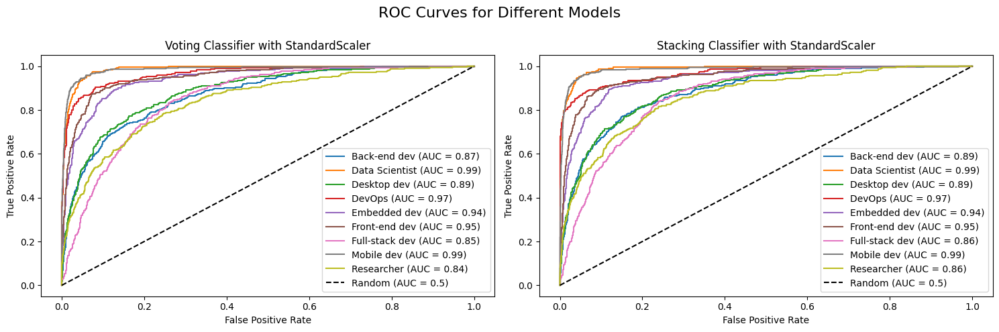

In [188]:
plot_roc_for_each_model(results,"ROC Curves for Different Models")

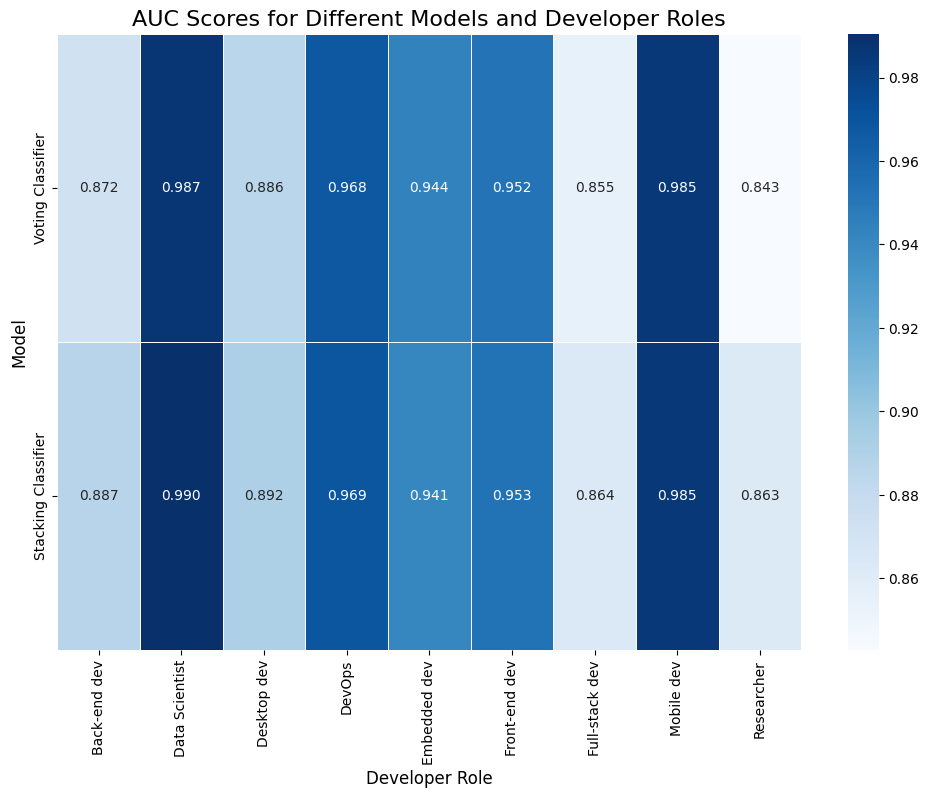

In [189]:
all_auc_scores = {}
for result in results:
    model_name = result['model']
    roc_data = result['roc_data']
    model_auc_scores = {}
    for role, (fpr, tpr) in roc_data.items():
        model_auc_scores[role] = auc(fpr, tpr)
    all_auc_scores[model_name] = model_auc_scores

auc_scores_df = pd.DataFrame(all_auc_scores).T

plt.figure(figsize=(12, 8))
sns.heatmap(auc_scores_df, annot=True, cmap="Blues", fmt=".3f", linewidths=0.5)
plt.title('AUC Scores for Different Models and Developer Roles', fontsize=16)
plt.xlabel('Developer Role', fontsize=12)
plt.ylabel('Model', fontsize=12)
plt.show()


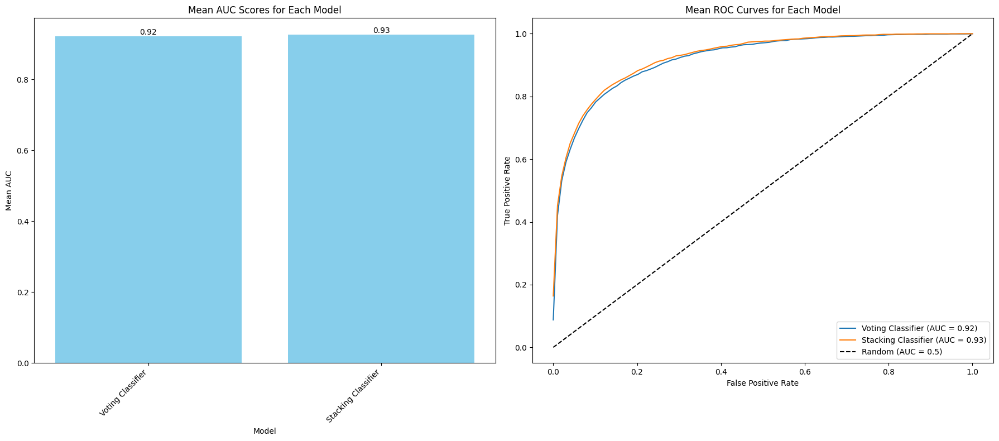

In [190]:
mean_auc_df = plot_mean_roc_auc(results)

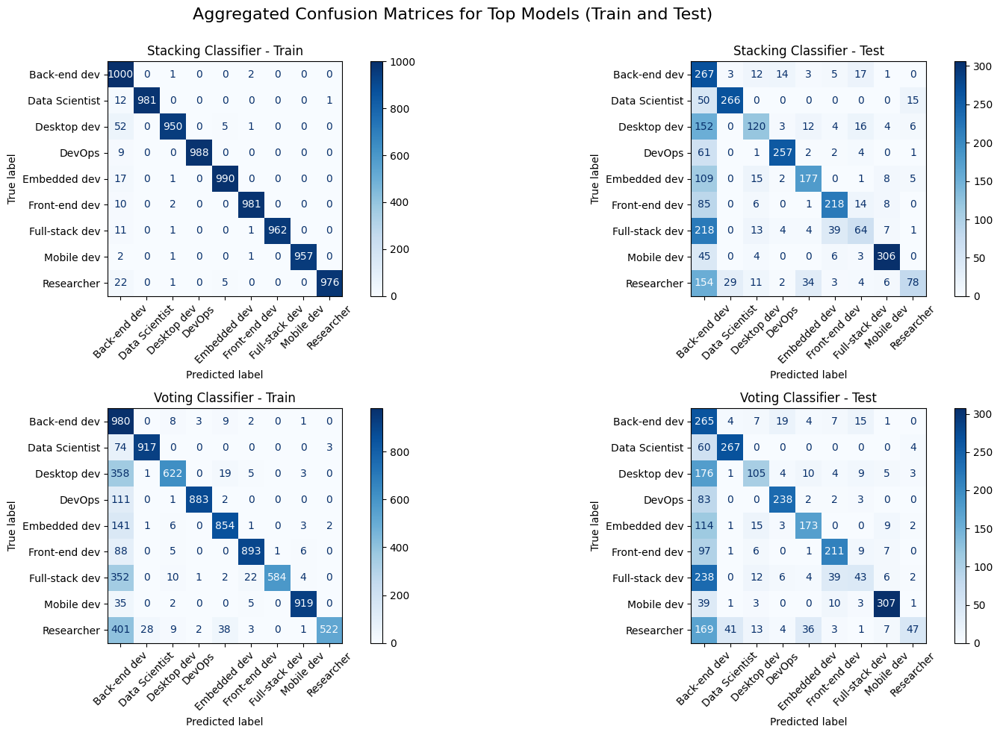

In [191]:
plot_confusion_matrix(mean_auc_df,X_train,X_test,Y_train,Y_test,n_top=2)

<div style="
  background-color: #e3f2fd;
  padding: 12px;
  border-left: 4px solid #0d47a1; 
  border-radius: 6px;
  font-family: 'Georgia', serif;
  color: #0288d1; 
  font-size: 24px; 
  text-align: left;
">
Using PCA
</div>



In [199]:
scalers = {
    'StandardScaler': StandardScaler(),
}

models = {
    'Decision Tree': (DecisionTreeClassifier(random_state=42), {'classifier__estimator__max_depth': [3, 5, 7]}),
    'Logistic Regression': (LogisticRegression(random_state=42), {'classifier__estimator__C': [0.1, 0.5, 1, 10], 'classifier__estimator__penalty': ['l1', 'l2']}),
    'SVM': (SVC(random_state=42,probability=True), {'classifier__estimator__C': [0.1, 1, 10], 'classifier__estimator__kernel': ['rbf']}),
    'KNN': (KNeighborsClassifier(), {'classifier__estimator__n_neighbors': [3, 5, 7], 'classifier__estimator__weights': ['uniform', 'distance']}),
    'Naive Bayes': (GaussianNB(), {'classifier__estimator__var_smoothing': [1e-9, 1e-5]}),
    'Random Forest': (RandomForestClassifier(random_state=42), {'classifier__estimator__n_estimators': [100, 150, 200], 'classifier__estimator__max_depth': [5, 10, 20,25, 30], 'classifier__estimator__max_features': ['sqrt', 'log2']}),
    'AdaBoost': (AdaBoostClassifier(random_state=42), {'classifier__estimator__n_estimators': [50, 100, 150], 'classifier__estimator__learning_rate': [0.01, 0.05, 0.1, 0.5, 1]}),
    'Gradient Boosting': (GradientBoostingClassifier(random_state=42), {'classifier__estimator__n_estimators': [50, 100, 200], 'classifier__estimator__learning_rate': [0.01, 0.05, 0.1, 0.5, 1]}),
    'XGBoost': (xgb.XGBClassifier(random_state=42), {'classifier__estimator__n_estimators': [50, 100, 200], 'classifier__estimator__learning_rate': [0.01, 0.05, 0.1, 0.3], 'classifier__estimator__reg_alpha': [0, 0.1, 0.5], 'classifier__estimator__reg_lambda': [1, 1.5, 2], 'classifier__estimator__max_depth': [3, 5, 7]})
}

results_random_search = perform_randomized_search(X_train, Y_train, X_test, Y_test, scalers, models,scoring='roc_auc', use_pca=True, save_model=True)

Training with StandardScaler and Decision Tree

Best parameters for StandardScaler with Decision Tree: {'pca__n_components': 10, 'classifier__estimator__max_depth': 5}

Best score: 0.854184228202374

======Train Scores======

accuracy_score     91.815556

precision_score    70.242222

recall_score       45.586667

f1_score           51.161111

dtype: float64



                accuracy_score  precision_score  recall_score  f1_score

Back-end dev             89.77            62.64         21.73     32.27

Data Scientist           94.57            75.45         75.75     75.60

Desktop dev              90.94            69.72         34.72     46.36

DevOps                   91.74            67.20         50.55     57.70

Embedded dev             90.76            59.74         55.36     57.47

Front-end dev            93.45            71.72         67.67     69.64

Full-stack dev           89.44            84.44          3.90      7.45

Mobile dev               96.62            88.18     

In [205]:

for result in results_random_search:
    model_name = result['model']
    model = models[model_name][0]
    best_params = result['best_params']
    
    pipeline = Pipeline([
        ('scaler', scalers['StandardScaler']),
        ('pca', PCA(n_components=best_params['pca__n_components'])),
        ('classifier', MultiOutputClassifier(model.set_params(**{k.split('__')[-1]: v for k, v in best_params.items() if 'classifier' in k})))
    ])
    
    pipeline.fit(X_train, Y_train)
    y_pred_proba = pipeline.predict_proba(X_test)
    
    roc_data = {}
    for i, col in enumerate(Y_test.columns):
        fpr, tpr, _ = roc_curve(Y_test[col], y_pred_proba[i][:, 1])
        roc_data[col] = (fpr, tpr)
    
    result['roc_data'] = roc_data


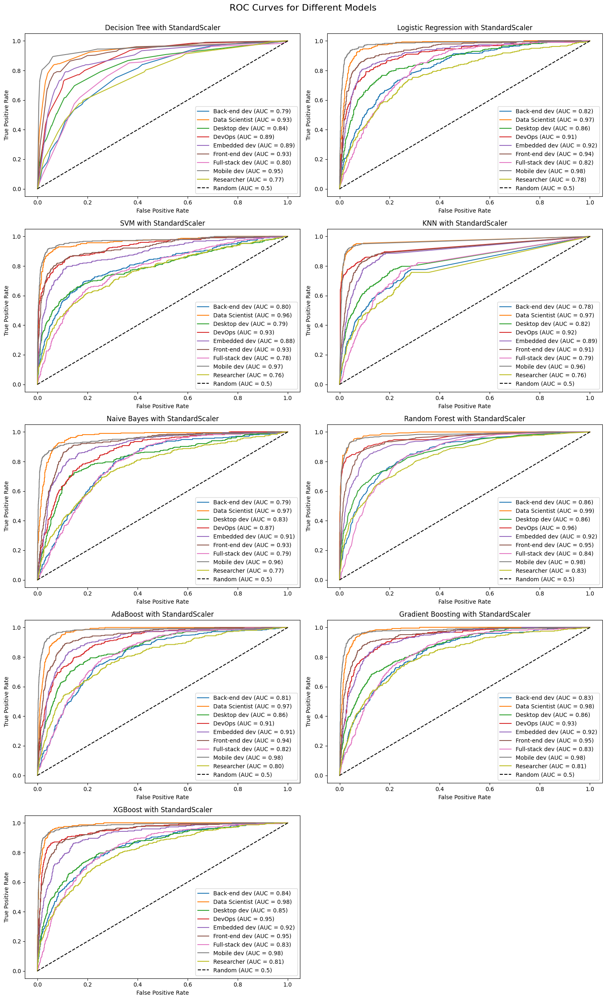

In [206]:
plot_roc_for_each_model(results_random_search,"ROC Curves for Different Models")

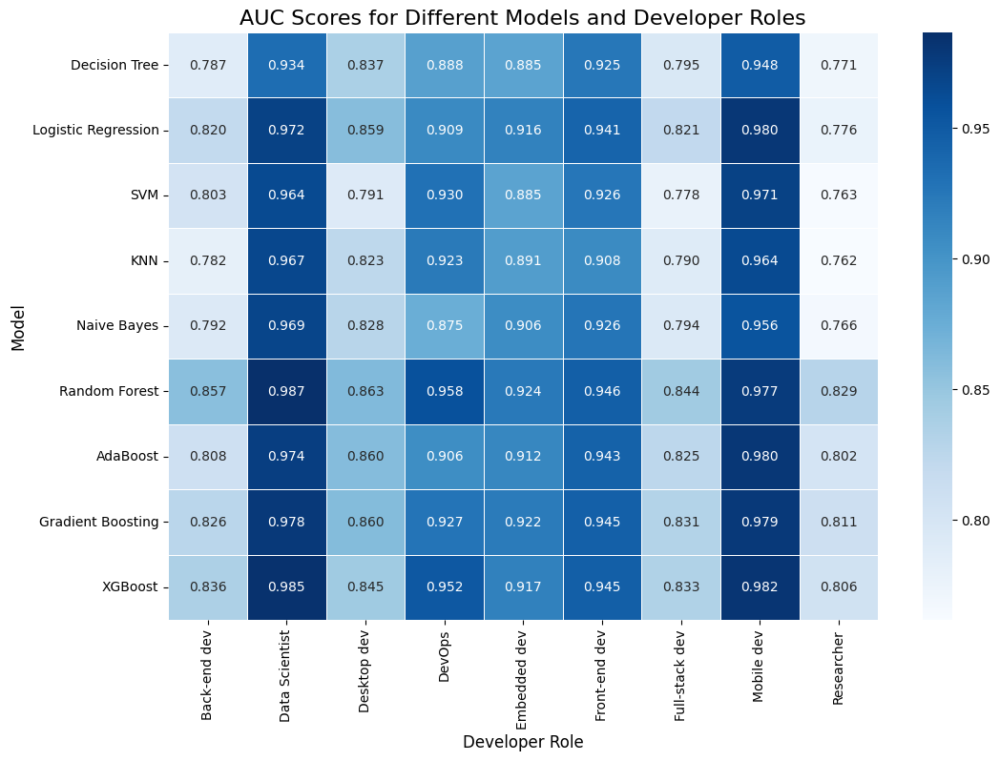

In [207]:
all_auc_scores = {}
for result in results_random_search:
    model_name = result['model']
    roc_data = result['roc_data']
    model_auc_scores = {}
    for role, (fpr, tpr) in roc_data.items():
        model_auc_scores[role] = auc(fpr, tpr)
    all_auc_scores[model_name] = model_auc_scores

auc_scores_df = pd.DataFrame(all_auc_scores).T

plt.figure(figsize=(12, 8))
sns.heatmap(auc_scores_df, annot=True, cmap="Blues", fmt=".3f", linewidths=0.5)
plt.title('AUC Scores for Different Models and Developer Roles', fontsize=16)
plt.xlabel('Developer Role', fontsize=12)
plt.ylabel('Model', fontsize=12)
plt.show()


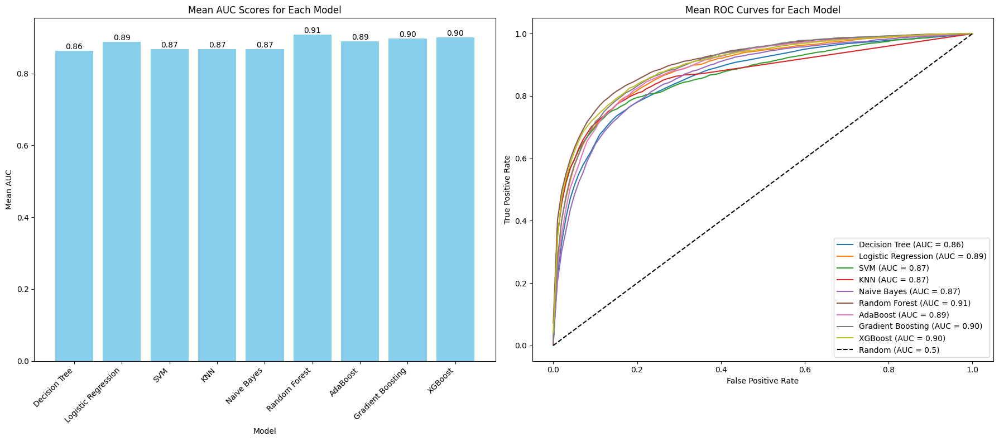

In [208]:
mean_auc_df = plot_mean_roc_auc(results_random_search)

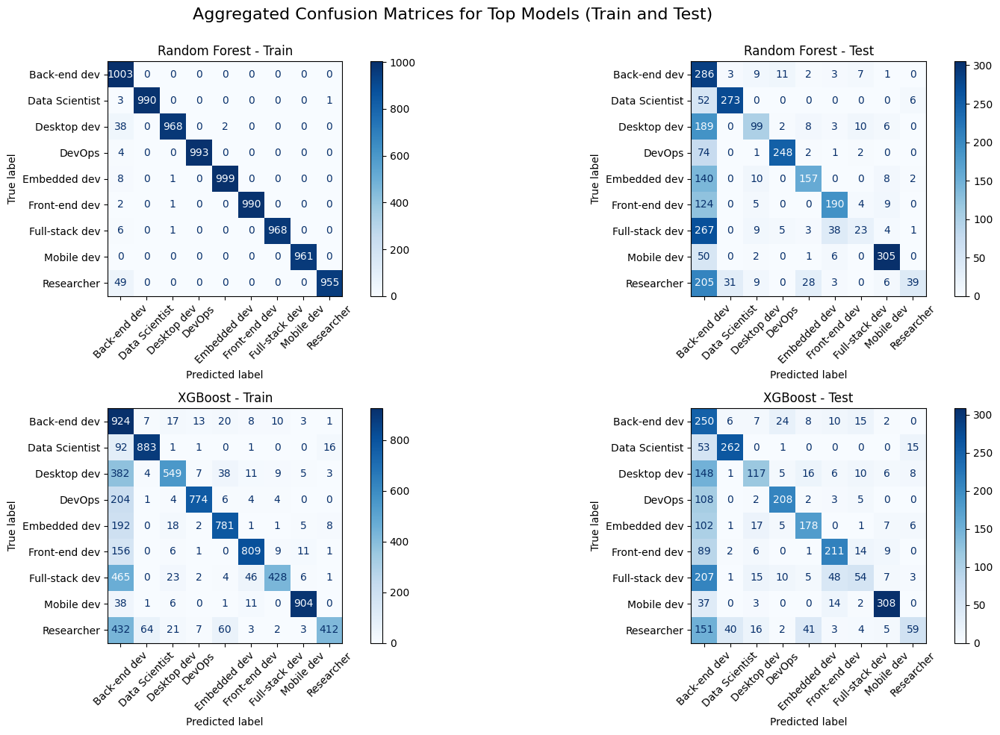

In [209]:
plot_confusion_matrix(mean_auc_df,X_train,X_test,Y_train,Y_test,n_top=2)

<div style="
  background-color: #e3f2fd;
  padding: 12px;
  border-left: 4px solid #0d47a1; 
  border-radius: 6px;
  font-family: 'Georgia', serif;
  color: #0288d1; 
  font-size: 24px; 
  text-align: left;
">
Trying Using Different Model For Each Label 
</div>



In [224]:
classifiers = {}
for label in Y_train.columns:
    if label in ['Full-stack dev', 'Researcher']:
        classifiers[label] = RandomForestClassifier(random_state=42, n_jobs=-1,bootstrap=False)
    classifiers[label] = xgb.XGBClassifier(random_state=42,n_jobs=-1)

for label in Y_train.columns:
    classifiers[label].fit(X_train, Y_train[label])

predictions = {}
for label in Y_train.columns:
    predictions[label] = classifiers[label].predict(X_test)

y_pred_combined = np.array([predictions[label] for label in Y_train.columns]).T

for i, label in enumerate(Y_train.columns):
    y_test_label = Y_test[label]
    y_pred_label = predictions[label]
    print(f"Label: {label}")
    print(f"Accuracy: {accuracy_score(y_test_label, y_pred_label)}")
    print(f"F1 Score: {f1_score(y_test_label, y_pred_label)}")
    print()


overall_f1_score = np.mean([f1_score(Y_test[label], predictions[label]) for label in Y_train.columns])
print(f"Overall F1 Score: {overall_f1_score}")


Label: Back-end dev

Accuracy: 0.9067739771965124

F1 Score: 0.4417670682730923



Label: Data Scientist

Accuracy: 0.9641180415828303

F1 Score: 0.8356374807987712



Label: Desktop dev

Accuracy: 0.9087860496311201

F1 Score: 0.4666666666666667



Label: DevOps

Accuracy: 0.9570757880617036

F1 Score: 0.7915309446254072



Label: Embedded dev

Accuracy: 0.926224010731053

F1 Score: 0.6140350877192982



Label: Front-end dev

Accuracy: 0.9346076458752515

F1 Score: 0.6859903381642513



Label: Full-stack dev

Accuracy: 0.8819584171696848

F1 Score: 0.3178294573643411



Label: Mobile dev

Accuracy: 0.9664654594232059

F1 Score: 0.8633879781420766



Label: Researcher

Accuracy: 0.9061032863849765

F1 Score: 0.3721973094170403



Overall F1 Score: 0.5987824812412161


<div style="
  background-color: #e3f2fd;
  padding: 12px;
  border-left: 4px solid #0d47a1; 
  border-radius: 6px;
  font-family: 'Georgia', serif;
  color: #0288d1; 
  font-size: 24px; 
  text-align: left;
">
Finally Chossing Best Model !
</div>



'best.pkl' is the the 'Stacking.pkl' we saved above after some hyperparameter tuning

In [ ]:
best_model = pickle.load(open('best.pkl', 'rb'))

In [ ]:
best_model

Pipeline(steps=[('scaler', RobustScaler()),
                ('stack_clf',
                 MultiOutputClassifier(estimator=StackingClassifier(estimators=[('xgb',
                                                                                 XGBClassifier(base_score=None,
                                                                                               booster=None,
                                                                                               callbacks=None,
                                                                                               colsample_bylevel=None,
                                                                                               colsample_bynode=None,
                                                                                               colsample_bytree=None,
                                                                                               device=None,
                                                                                               early_stopping_rounds=None,
                                                                                               enable_categorical=False,
                                                                                               eval_metric=None,
                                                                                               feature_types=None,...
                                                                                               num_parallel_tree=5, ...)),
                                                                                ('rf',
                                                                                 RandomForestClassifier(bootstrap=False,
                                                                                                        max_depth=40,
                                                                                                        max_features='log2',
                                                                                                        n_estimators=300,
                                                                                                        n_jobs=-1,
                                                                                                        random_state=42)),
                                                                                ('gb',
                                                                                 GradientBoostingClassifier(max_depth=40,
                                                                                                            n_estimators=300,
                                                                                                            n_iter_no_change=10,
                                                                                                            random_state=42)),
                                                                                ('lr',
                                                                                 LogisticRegression(C=1,
                                                                                                    n_jobs=-1,
                                                                                                    random_state=42))],
                                                                    final_estimator=LogisticRegression(),
                                                                    n_jobs=-1)))])

In [ ]:
evaluate_model(best_model,X_train,Y_train, X_test, Y_test)

======Train Scores======

accuracy_score     95.57375

precision_score    87.14000

recall_score       73.65250

f1_score           78.82500

dtype: float64



                accuracy_score  precision_score  recall_score  f1_score

Back-end dev             92.01            80.08         48.05     60.06

Data Scientist           98.81            96.76         93.64     95.17

Desktop dev              94.81            83.99         72.27     77.69

DevOps                   97.99            96.20         87.36     91.57

Embedded dev             97.47            94.38         84.77     89.32

Front-end dev            95.47            85.44         76.82     80.90

Full-stack dev           89.48            67.94         29.95     41.58

Mobile dev               98.55            92.33         96.36     94.31



======Test Scores======

accuracy_score     91.57875

precision_score    72.79625

recall_score       73.01875

f1_score           70.34500

dtype: float64



                accura

(                accuracy_score  precision_score  recall_score  f1_score
 Back-end dev             92.01            80.08         48.05     60.06
 Data Scientist           98.81            96.76         93.64     95.17
 Desktop dev              94.81            83.99         72.27     77.69
 DevOps                   97.99            96.20         87.36     91.57
 Embedded dev             97.47            94.38         84.77     89.32
 Front-end dev            95.47            85.44         76.82     80.90
 Full-stack dev           89.48            67.94         29.95     41.58
 Mobile dev               98.55            92.33         96.36     94.31,
                 accuracy_score  precision_score  recall_score  f1_score
 Back-end dev             83.21            78.08         48.17     59.58
 Data Scientist           98.85            75.76         92.53     83.31
 Desktop dev              94.67            63.28         72.24     67.46
 DevOps                   98.91            70.29  

In [ ]:
results = []
results.append(
    {
        'model': 'Stacking Classifier',
        'scaler': 'RobudsScaler',
    }
)
models = {'Stacking Classifier': ((StackingClassifier(estimators=[], final_estimator=LogisticRegression(), n_jobs=-1)),{})}

In [ ]:
y_pred_proba = best_model.predict_proba(X_test)
for result in results:
    roc_data = {}
    for i, col in enumerate(Y_test.columns):
        fpr, tpr, _ = roc_curve(Y_test[col], y_pred_proba[i][:, 1])
        roc_data[col] = (fpr, tpr)

    result['roc_data'] = roc_data

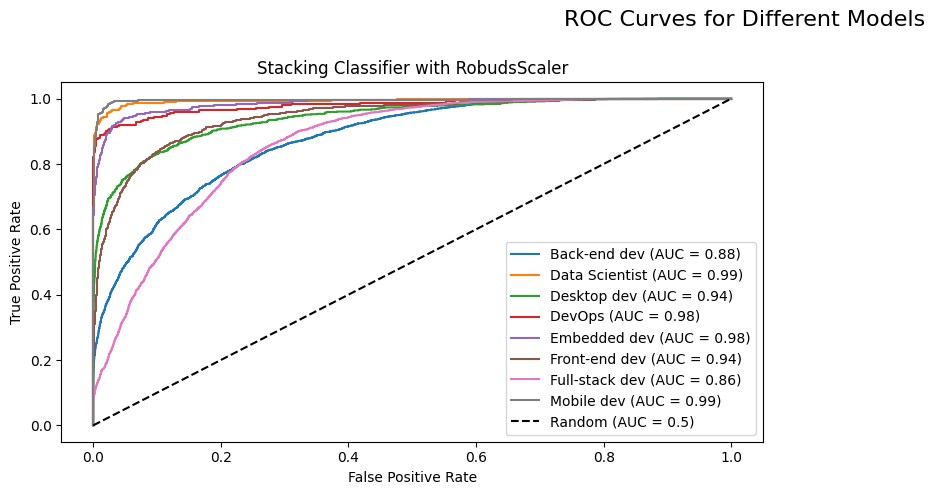

In [ ]:
plot_roc_for_each_model(results,"ROC Curves for Different Models")

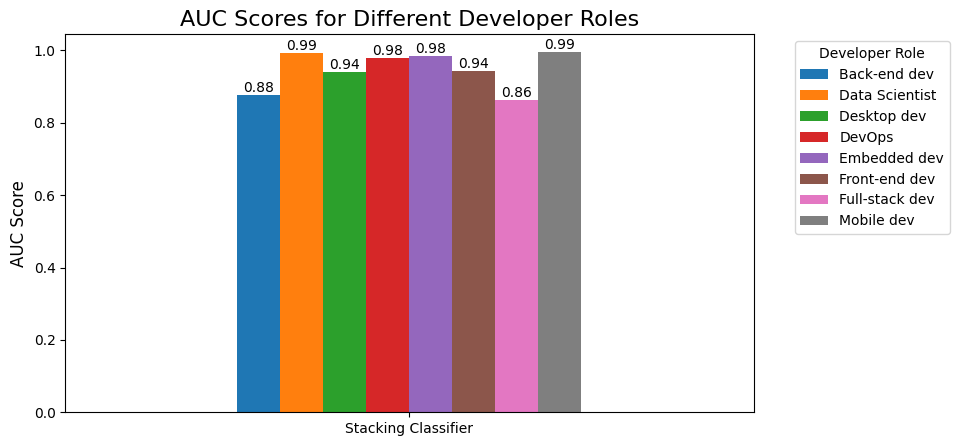

In [ ]:
all_auc_scores = {}
for result in results:
    model_name = result['model']
    roc_data = result['roc_data']
    model_auc_scores = {}
    for role, (fpr, tpr) in roc_data.items():
        model_auc_scores[role] = auc(fpr, tpr)
    all_auc_scores[model_name] = model_auc_scores

auc_scores_df = pd.DataFrame(all_auc_scores).T

ax = auc_scores_df.plot(kind='bar', rot=0)
plt.title('AUC Scores for Different Developer Roles', fontsize=16)
plt.ylabel('AUC Score', fontsize=12)
plt.legend(title='Developer Role', bbox_to_anchor=(1.05, 1), loc='upper left')

# Annotate the bars with the AUC scores
for p in ax.patches:
    ax.annotate(f'{p.get_height():.2f}', (p.get_x() + p.get_width() / 2., p.get_height()),
                ha='center', va='center', xytext=(0, 5), textcoords='offset points')
plt.tight_layout(rect=[0, 0, 1.5,0.95])
plt.show()


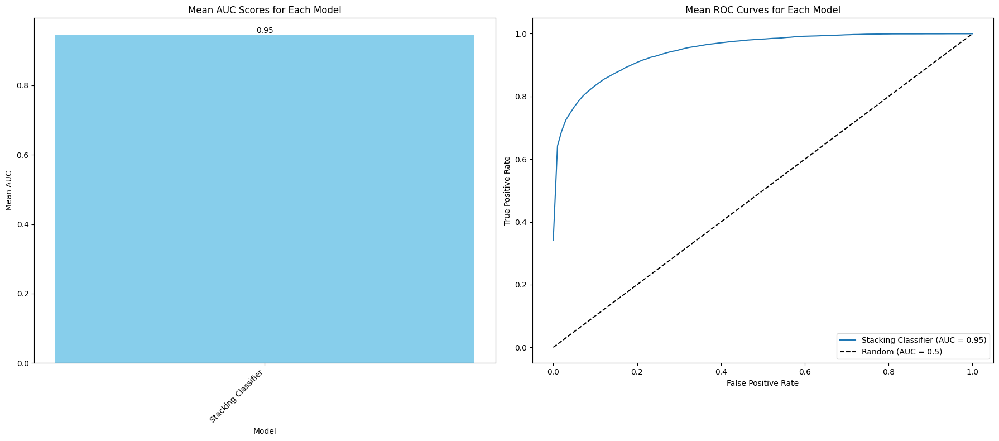

In [ ]:
mean_auc_df = plot_mean_roc_auc(results)

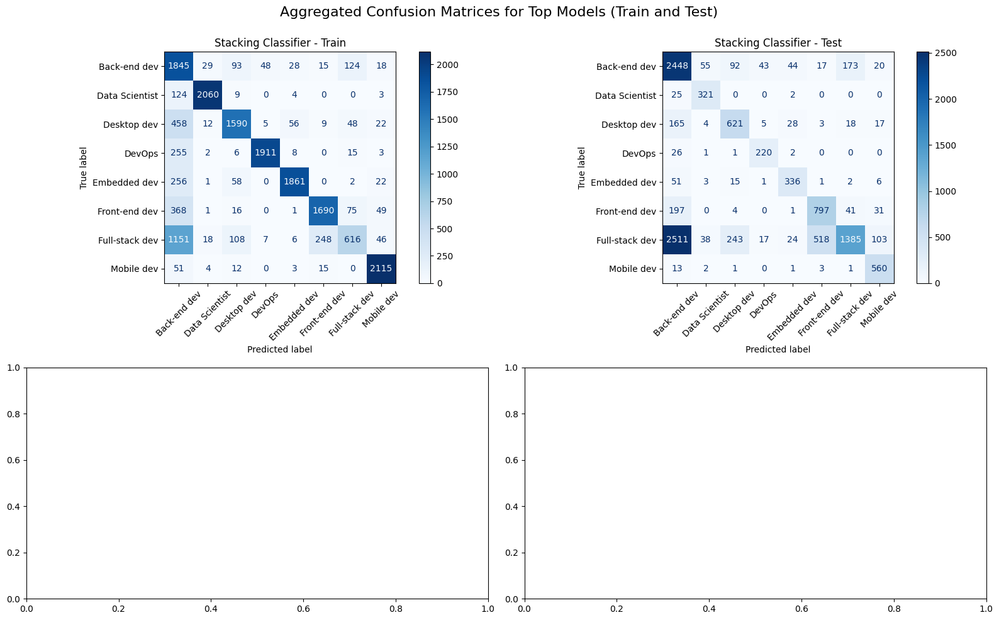

In [ ]:
plot_confusion_matrix(mean_auc_df,X_train,X_test,Y_train,Y_test,best_model,n_top=2)